<a href="https://colab.research.google.com/github/arvind2047/gl_capstone/blob/master/GL_AIML_Capstone_Automatic_Ticket_Assignment_V1.1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##**Automatic Ticket Assignment - problem statement, objective and steps involved**

# INDEX:

----

####I. Import Libraries
####II. Load and understand the data
####III. Data Cleansing
####IV. Exploratory Data Analysis
>i. Group by category   
>ii. Distribution by group   
>iii. Caller - Assignment group analysis to identify any patterns   
>iv. Short description length analysis and its relation with Assignment group   
>v. Description length analysis and its relation with assignment group   
>vi. Mean length of Description Columns   
>vii. Get the Frequency of Words in the Description Column   
####V. Text Pre-processing   
>i. Expand the contractions   
>ii. English Language Detection   
>iii. Plot the language Distribution   
>iv. Translate non-English details   
>v. Tokenization   
>vi. Converting all Characters to Lowercase   
>vii. Removing Punctuations   
>viii. Removing Stopwords   
>ix. Lemmatization   
>x. Plot the document frequency of the Description Field   
####VI. Exploratory Data Analysis on pre-processed Data   
>i.Groups with most and least frequent number of tickets   
>ii. Distribution of tickets based on ticket count   
>iii. Derive insights on ticket distribution by L1/L2 and L3 Queues   
>iv. Character and word counts in Short description by L1/L2 and L3   
>v. Number of unique words in each article   
>vi. Word clouds by assignment groups   
>vii. Hypothesis testing
>viii. Measure Readability of a ticket
####VII. Topic Modeling    
>i. Count Vectorizer   
>ii. Latent Dirichlet Allocation (LDA)  
>iii. Non-Negative Matrix Factorization (NMF) approach using TF-IDF   
>iv. TF-IDF distribution   
>v. Dimensionality Reduction using t-SNE
####VIII. Agglomerative Clustering   
>i. Get Embeddings from Glove   
>ii. Pseudo class setup   
####IX. KMeans clustering
####X. Model Building   
>i. Classification Models on Bag of Words   
>ii. Data balancing using cosine distance comparison and SMOTE techniques   
>iii. Classification Models on Glove embedding clusters   
>iv. Classification Models using KMeans clusters   
####XI. Hyperparameter Tuning   
>i. Determining the best hyperparameters using GridSearchCV   
>ii. Fit the models with tuned hyperparameters   
####XII. Prediction using Neural Network Models   
>i. Classification using BERT model   
>ii. BiDirectional LSTM for prediction   
>iii. Prediction using GRU model   
>iv. Prediction using RNN model   
>v. Text Classification With Hugging Face Transformers
####XIII. Group classification (Secondary layer)
>vi. Secondary Classification algorithm
####XIV. Final Conclusion


# Automatic Ticket Assignment





Problem Statement:

Manual assignment of incidents is time consuming and requires human efforts. There may be mistakes due to human errors and resource consumption is carried out ineffectively because of the misaddressing. On the other hand, manual assignment increases the response and resolution times which result in user satisfaction deterioration / poor customer service.

Additional effort needed for Functional teams to re-assign to right functional groups. During this process, some of the incidents are in queue and not addressed timely resulting in poor customer service. Guided by powerful AI techniques that can classify incidents to right functional groups can help organizations to reduce the resolving time of the issue and can focus on more productive tasks.

**Objective:**

The objective of the project is,

Learn how to use different classification models.
Use transfer learning to use pre-built models.
Learn to set the optimizers, loss functions, epochs, learning rate, batch size, checkpointing, early stopping etc.
Read different research papers of given domain to obtain the knowledge of advanced models for the given problem.
This capstone project intends to reduce the manual intervention of IT operations or Service desk teams by automating the ticket assignment process.The goal here is to create a text classification based ML model that can automatically classify any new tickets by analysing ticket description to one of the relevant Assignment groups, which could be later integrated to any ITSM tool like Service Now. Based on the ticket description our model will output the probability of assigning it to one of the 74 Groups.

Data:

Details about the data and dataset files are given in below link, https://drive.google.com/open?id=1OZNJm81JXucV3HmZroMq6qCT2m7ez7IJ

**Steps Involved:**

> **Pre-Processing, Data Visualization and EDA**

*   Exploring the given Data files
*   Understanding the structure of data
*   Missing points in data
*   Finding inconsistencies in the data
*   Visualizing different patterns
*   Visualizing different text features
*   Dealing with missing values
*   Text preprocessing
*   Creating word vocabulary from the corpus of report text data
*   Creating tokens as required

> **Model Building**

*   Building a model architecture which can classify.
*   Trying different model architectures by researching state of the art for similar tasks.
*   Train the model
*   To deal with large training time, save the weights so that you can use them when training the model for the second time without starting from scratch.

> **Test the Model, Fine-tuning and Repeat**

*   Test the model and report as per evaluation metrics
*   Try different models
*   Try different evaluation metrics
*   Set different hyper parameters, by trying different optimizers, loss functions, epochs, learning rate, batch size, checkpointing, early stopping etc..for these models to fine-tune them
*   Report evaluation metrics for these models along with your observation on how changing different hyper parameters leads to change in the final evaluation metric.

## Import Libraries

In [1]:
!pip install tensorflow >> /dev/null
!pip install ktrain==0.18.0 >> /dev/null
!pip install googletrans >> /dev/null
!pip install contractions >> /dev/null
!pip install fasttext >> /dev/null
!pip install langdetect >> /dev/null
!pip install gensim >> /dev/null
!pip install imblearn >> /dev/null
!pip install tensorflow-gpu >> /dev/null
!pip install bs4 >> /dev/null
!pip install pyLDAvis >> /dev/null
!pip install warnings >> /dev/null
!pip install bert-for-tf2 >> /dev/null
!pip install sentencepiece >> /dev/null
!pip install tqdm >> /dev/null
!pip install spacy >> /dev/null
!pip install textstat >> /dev/null
!pip install scikit-learn >>  /dev/null


ERROR: tensorflow 2.2.0 has requirement tensorboard<2.3.0,>=2.2.0, but you'll have tensorboard 2.3.0 which is incompatible.
ERROR: tensorflow 2.2.0 has requirement tensorflow-estimator<2.3.0,>=2.2.0, but you'll have tensorflow-estimator 2.3.0 which is incompatible.
ERROR: Could not find a version that satisfies the requirement warnings (from versions: none)
ERROR: No matching distribution found for warnings


In [2]:
# Basic python computation and visualization
import numpy as np
import pandas as pd
#pd.set_option('display.max_colwidth', None)
import matplotlib.pyplot as plt 
from matplotlib.ticker import MaxNLocator
import seaborn as sns
sns.set(style='whitegrid',palette='muted',font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE","#FFDD00","#FF7D00","#FF006D","#ADFF02","#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

from pylab import rcParams
rcParams['figure.figsize']=12,8
import scipy
import scipy.stats as st
from statsmodels.stats.proportion import proportions_ztest
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# For handling string
import string
import random
import collections
from collections import Counter
# For performing mathematical operations
import math

# Deep Learning Libraries and models
import tensorflow as tf
import keras 
from keras.preprocessing.text import Tokenizer
from keras.models import Sequential
from keras.layers import Dense
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, Dropout, Embedding, LSTM, Flatten, GRU, Activation, Bidirectional, GlobalMaxPool1D, Conv1D, MaxPooling1D
from keras.models import Model
from keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import io
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorboard.plugins import projector
import bert
from bert import BertModelLayer
from bert.loader import StockBertConfig, map_stock_config_to_params, load_stock_weights
from bert.tokenization.bert_tokenization import FullTokenizer
import ktrain
from ktrain import text
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Model building
from time import time
from sklearn import preprocessing
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder 
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, auc, f1_score, precision_score, recall_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from xgboost.sklearn import XGBClassifier
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist
import pickle
plt.style.use('ggplot')
%matplotlib inline

# Tools & Evaluation metrics
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import roc_curve, accuracy_score, precision_recall_curve 
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import train_test_split, cross_val_score
from imblearn.over_sampling import RandomOverSampler

# NLP text handling libraries
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk import FreqDist
from nltk import pos_tag
from string import punctuation
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import spacy
import googletrans
from googletrans import Translator
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import contractions
import fasttext
from langdetect import detect
import textstat

# Topic Modeling
import pyLDAvis.sklearn
from textblob import TextBlob
from sklearn.decomposition import LatentDirichletAllocation, NMF
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

# General purpose
import os
from zipfile import ZipFile
from google.colab import drive
from tqdm import tqdm
import datetime

RANDOM_SEED=42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [3]:
drive.mount('/content/drive/', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


In [4]:
project_path = '/content/drive/My Drive/GL AIML Capstone/' 
os.chdir(project_path) 
os.getcwd()

'/content/drive/My Drive/GL AIML Capstone'

## Load and Understand the Data

In [ ]:
## Read the data from EXCEL
incidents = pd.read_excel(project_path + "input_data.xlsx")

## Quick View 
incidents.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [ ]:
## basic info
incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [ ]:
## Shape
incidents.shape

(8500, 4)

In [ ]:
## List of columns
incidents.columns

Index(['Short description', 'Description', 'Caller', 'Assignment group'], dtype='object')

In [ ]:
## List the unique assignment groups
incidents["Assignment group"].unique()
print("Number of unique assignment groups - ", incidents["Assignment group"].nunique())

Number of unique assignment groups -  74


In [ ]:
## find nulls
incidents[incidents.isna().any(axis=1)]

,Short description,Description,Caller,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


**Observation:**

* There are 4 columns and all are string columns.
* There are totally 8500 rows and there seems to be missing values in Short description and Description columns, which needs to be looked into and handled.
* There are 74 unique assignment groups - GRP_0 the most frequent item with 3976 entries.
* Caller columns mainly contains the details of the user who raised the incident and is of not much use in our analysis and can be dropped.
* Assignment group is our predictor / target column with multiple classes.
This is a Multiclass Classification problem.


## Data Cleansing
Following actions were peformed - 
* Remove null columns
* Drop duplicates
* Remove special characters, trailing spaces, numbers
* Convert to lower case

In [ ]:
# drop nulls
incidents.dropna(inplace=True)
incidents.shape

(8491, 4)

In [ ]:
incidents.columns

Index(['Short description', 'Description', 'Caller', 'Assignment group'], dtype='object')

In [ ]:
## Duplicates 
incidents[incidents.duplicated()]

,Short description,Description,Caller,Assignment group
51,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,olckhmvx pcqobjnd,GRP_0
229,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,olckhmvx pcqobjnd,GRP_0
493,ticket update on inplant_872730,ticket update on inplant_872730,fumkcsji sarmtlhy,GRP_0
512,blank call //gso,blank call //gso,rbozivdq gmlhrtvp,GRP_0
667,job bkbackup_tool_powder_prod_full failed in j...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
...,...,...,...,...
7836,probleme mit erpgui \tmqfjard qzhgdoua,probleme mit erpgui \tmqfjard qzhgdoua,tmqfjard qzhgdoua,GRP_24
8051,issue on pricing in distributor_tool,we have agreed price with many of the distribu...,hbmwlprq ilfvyodx,GRP_21
8093,reset passwords for prgthyuulla ramdntythanjes...,the,boirqctx bkijgqry,GRP_17
8347,blank call // loud noise,blank call // loud noise,rbozivdq gmlhrtvp,GRP_0


In [ ]:
# Remove Duplicates
incidents = incidents.drop_duplicates(['Short description', 'Description', 'Caller', 'Assignment group'])

In [ ]:
#remove spaces trailing
incidents['Short description'] = incidents['Short description'].str.strip()
incidents['Description'] = incidents['Description'].str.strip()

#remove tabs and carriage returns
incidents.replace(to_replace=[r"\\t|\\n|\\r", "\t|\n|\r"], value=[" "," "], regex=True, inplace=True)

# Removing special characters
incidents['Short description']  = incidents['Short description'].map(lambda x: re.sub(r'\W', ' ', x))
incidents['Description'] = incidents['Description'].map(lambda x: re.sub(r'\W', ' ', x))

#Getting rid of numbers & special characters etc

spec_chars = ["!",'"',"#","%","&","'","(",")",
              "*","+",",","-",".","/",":",";","<",
              "=",">","?","@","[","\\","]","^","_",
              "`","{","|","}","~","–"]
for char in spec_chars:
    incidents['Short description'] = incidents['Description'].str.replace(char, ' ')
    incidents['Description'] = incidents['Description'].str.replace(char, ' ')

#remove numbers    
incidents['Description'] = incidents['Description'].replace('\d+', '', regex=True)
incidents['Short description'] = incidents['Short description'].replace('\d+', '', regex=True)
    
#remove more than 1 space
incidents.replace('\s+', ' ', regex=True, inplace=True)

#make lower case
incidents.apply(lambda x: x.astype(str).str.lower())

incidents.head(10)

<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence 

,Short description,Description,Caller,Assignment group
0,verified user details employee manager name c...,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0
1,received from hmjdrvpb komuaywn gmail com hell...,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0
2,received from eylqgodm ybqkwiam gmail com hi i...,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0
6,event critical HostName company com the value ...,event critical HostName company com the value ...,jyoqwxhz clhxsoqy,GRP_1
7,ticket no employment status new non employee e...,ticket no employment status new non employee e...,eqzibjhw ymebpoih,GRP_0
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0
9,ticket update on inplant,ticket update on inplant,fumkcsji sarmtlhy,GRP_0


## Exploratory Data Analysis

### Group by Category

In [ ]:
## Group by Categories
df_grp = incidents.groupby(['Assignment group']).size().reset_index(name='counts')
df_grp

,Assignment group,counts
0,GRP_0,3926
1,GRP_1,31
2,GRP_10,140
3,GRP_11,30
4,GRP_12,257
...,...,...
69,GRP_71,2
70,GRP_72,2
71,GRP_73,1
72,GRP_8,645


In [ ]:
df_grp.describe()

,counts
count,74.000000
mean,113.621622
std,459.823990
min,1.000000
25%,5.250000
50%,26.000000
75%,81.000000
max,3926.000000


### Distribution by group

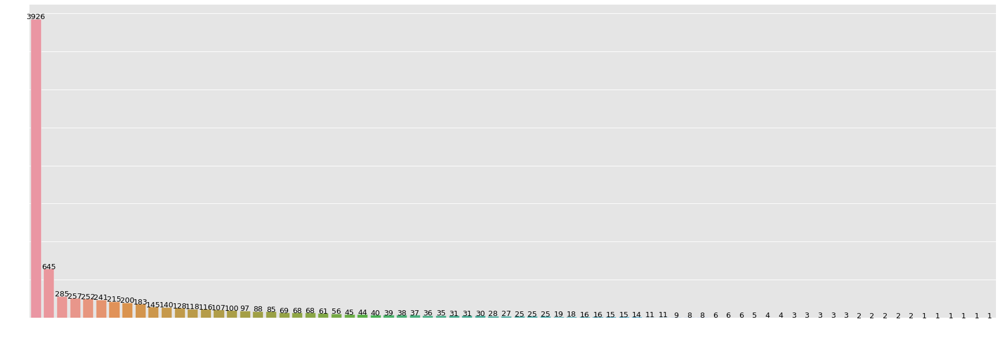

In [ ]:
assgn = incidents['Assignment group'].value_counts()
plt.figure(figsize=(30,10))
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
cntplot = sns.barplot(x=assgn.index,y=assgn.values)
cntplot.set_xticklabels(cntplot.get_xticklabels(), rotation=90, ha="right")
for i in range(len(assgn)):
  cntplot.text(i, assgn.values[i], assgn.values[i], color='black', ha='center', fontsize=13)
plt.show()

**Observation:**

* The Target class distrubtion is extremely skewed
* Large no of entries for GRP_0 (amounting to 3926) which account for ~50% of the data
* GRP_0 and GRP_8 together amount to around 55% of the available data.
* There are groups with 1 entry also. 
* We have to resolve the imbalance before modelling.

### Caller - Assignment group analysis to identify any patterns

In [ ]:
incidents['Caller'].describe()

count                  8408
unique                 2948
top       bpctwhsn kzqsbmtp
freq                    788
Name: Caller, dtype: object

**Observation:**
*   There are 2948 unique callers who have submitted tickets.
*   'bpctwhsn kzqsbmtp' is the most frequent caller with 788 records  

Let us try to explore any relation between the caller and assignment groups.

In [ ]:
incidents_freqgrp = incidents[incidents['Assignment group'].isin(list(incidents['Assignment group'].value_counts()[incidents['Assignment group'].value_counts()>10].index))]
freq_grp = (np.max(pd.crosstab(incidents_freqgrp['Caller'],incidents_freqgrp['Assignment group'])) /
            np.sum(pd.crosstab(incidents_freqgrp['Caller'],incidents_freqgrp['Assignment group']))).sort_values(ascending=False)
grp_df = incidents_freqgrp[incidents_freqgrp['Assignment group'].isin(list(freq_grp[freq_grp>0.4].index))].groupby(by='Assignment group').agg(lambda x:x.value_counts().index[0])
grp_df.loc[freq_grp[freq_grp>0.4].index,'Percentage tickets by most frequent caller'] = freq_grp[freq_grp>0.4].round(3).values
grp_df.loc[freq_grp[freq_grp>0.4].index,'Total records for group'] = incidents[incidents['Assignment group'].isin(list(freq_grp[freq_grp>0.4].index))]['Assignment group'].value_counts()
grp_df.drop(columns=['Short description','Description'])

,Caller,Percentage tickets by most frequent caller,Total records for group
Assignment group,,,
GRP_10,bpctwhsn kzqsbmtp,0.429,140
GRP_41,entuakhp xrnhtdmk,0.550,40
GRP_5,bpctwhsn kzqsbmtp,0.742,128
GRP_6,bpctwhsn kzqsbmtp,0.481,183
GRP_60,bpctwhsn kzqsbmtp,0.750,16
GRP_8,bpctwhsn kzqsbmtp,0.536,645
GRP_9,bpctwhsn kzqsbmtp,0.607,252


**Observation:**

* We have listed the assignment groups where most of the records are submitted by 
single caller.
* 'bpctwhsn kzqsbmtp' is the most frequent caller for groups 5, 6, 8, 9, 10 and 60. 
* There is some correlation between these groups and caller names, but this is not significant enough finding to set as a rule.








In [ ]:
incidents_freqcall = incidents[incidents['Caller'].isin(list(incidents['Caller'].value_counts()[incidents['Caller'].value_counts()>20].index))]
freq_call = (np.max(pd.crosstab(incidents_freqcall['Assignment group'],incidents_freqcall['Caller'])) /
            np.sum(pd.crosstab(incidents_freqcall['Assignment group'],incidents_freqcall['Caller']))).sort_values(ascending=False)
call_df = incidents_freqcall[incidents_freqcall['Caller'].isin(list(freq_call[freq_call>0.7].index))].groupby(by='Caller').agg(lambda x:x.value_counts().index[0])
call_df.loc[freq_call[freq_call>0.7].index,'Percentage tickets by most frequent group'] = freq_call[freq_call>0.7].round(3).values
call_df.loc[freq_call[freq_call>0.7].index,'Total records for caller'] = incidents[incidents['Caller'].isin(list(freq_call[freq_call>0.7].index))]['Caller'].value_counts()
call_df.drop(columns=['Short description','Description'])

,Assignment group,Percentage tickets by most frequent group,Total records for caller
Caller,,,
efbwiadp dicafxhv,GRP_0,1.000,45
entuakhp xrnhtdmk,GRP_41,0.880,25
fumkcsji sarmtlhy,GRP_0,0.984,128
jionmpsf wnkpzcmv,GRP_24,0.958,24
olckhmvx pcqobjnd,GRP_0,1.000,47
rbozivdq gmlhrtvp,GRP_0,0.986,72


**Observation:**

*   We have plotted the caller based analysis where most of the records submitted by the caller are to a single group.
* All the records from callers 'efbwiadp dicafxhv' and 'olckhmvx pcqobjnd' are assigned to group 0. Again, we can't consider this significant because group 0 records account for half of all input data.
* Consider the volume of total records, we conclude there is no significant correlation between caller and assignment group.



### Short description length analysis and its relation with Assignment group

In [ ]:
incidents['sdesc_len'] = incidents['Short description'].str.len()

Text(0.5, 1.0, 'Distribution of length of short descriptions')

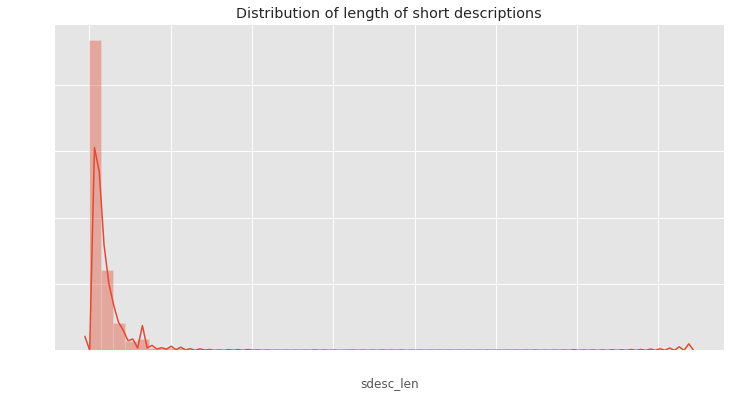

In [ ]:
plt.figure(figsize=(12,6))
sns.distplot(incidents['sdesc_len']).set_title('Distribution of length of short descriptions')

**Observation:**

Above plot shows the distribution of short description lengths.
We observe two peaks - most of the records are 20-30 words long but there is also a peak around 60. There is a possibility that this peak maybe characteristic of particular groups. Let us look at the groupwise analysis.

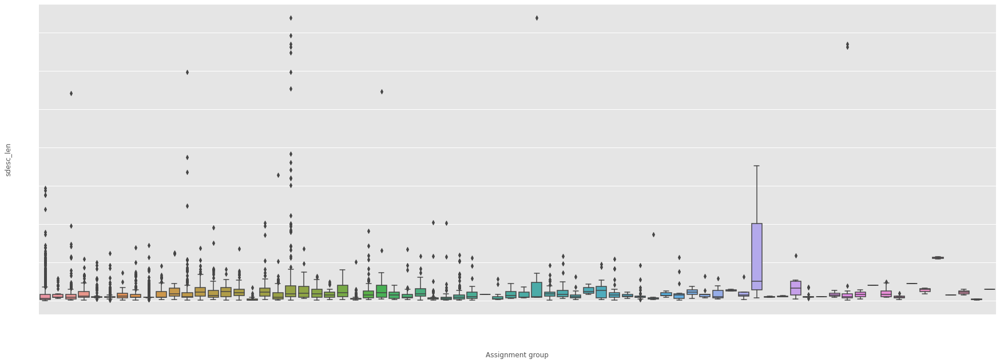

In [ ]:
plt.figure(figsize=(30,10))
lengths = sns.boxplot(data=incidents, x='Assignment group', y='sdesc_len')
lengths.set_xticklabels(lengths.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

We can see most of the short description are around 30 to 80 characters long with mean length around 50. However, we can see data for certain groups are on the upper range (GRP_20, GRP_1, GRP_56), while some have a characteristic to have lower lengths (GRP_0, GRP_48, GRP_19).

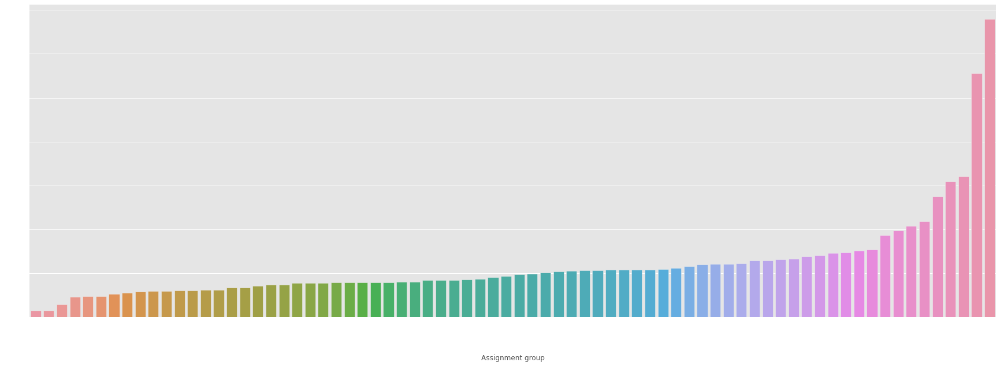

In [ ]:
plt.figure(figsize=(30,10))
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
plot_meansdesc_len=sns.barplot(x=incidents.groupby(['Assignment group']).mean()['sdesc_len'].sort_values().index,
                               y=incidents.groupby(['Assignment group']).mean()['sdesc_len'].sort_values().values)
plot_meansdesc_len.set_xticklabels(plot_meansdesc_len.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

We are seeing a pattern with records for groups 17, 57 and 61 typically having longer mean word lengths in contrast to most other groups having lengths below 60 words.


### Description length analysis and its relation with assignment group

In [ ]:
incidents['desc_len'] = incidents['Description'].str.len()

Text(0.5, 1.0, 'Distribution of length of descriptions')

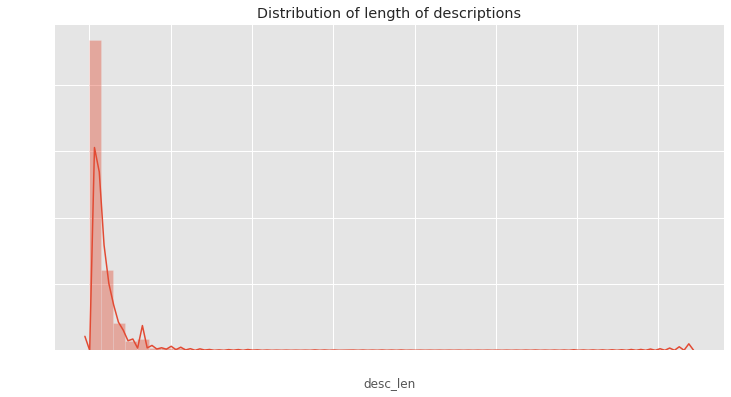

In [ ]:
plt.figure(figsize=(12,6))
sns.distplot(incidents['desc_len']).set_title('Distribution of length of descriptions')

**Observation:**

The distribution of description lengths is extremely skewed, let us try to omit the tail and focus the major portion from the right skewed graph.

In [ ]:
incidents['desc_len'].describe(percentiles=[0.25,0.5,0.75,0.9,0.95])

count    8408.000000
mean      167.200404
std       344.296363
min         0.000000
25%        39.000000
50%        81.000000
75%       184.000000
90%       353.300000
95%       587.250000
max      7376.000000
Name: desc_len, dtype: float64

In [ ]:
len(incidents[incidents['desc_len'] > 680])

230

**Observation:**

* Half of the records have less than 100 words.
* 90% of descriptions have less than 400 words.
* The remaining 10% records are very long and extremely skewed in comparison with the remaining portion.

Let us consider till the 95th percentile for further visualization.

Text(0.5, 1.0, 'Distribution of length of descriptions')

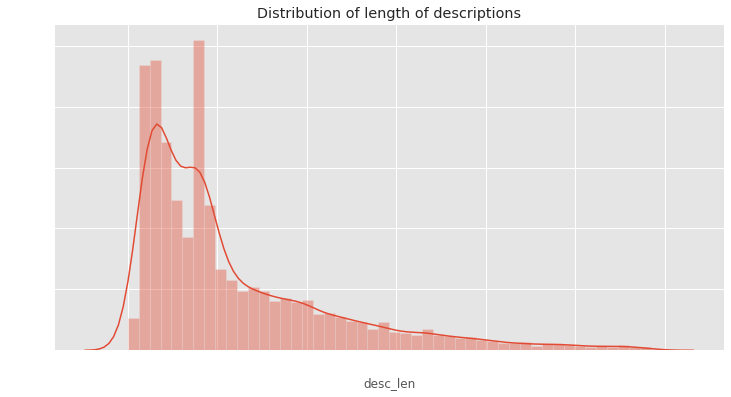

In [ ]:
incidents_95 = incidents[incidents['desc_len'] < incidents['desc_len'].quantile(0.95)]
plt.figure(figsize=(12,6))
sns.distplot(incidents_95['desc_len']).set_title('Distribution of length of descriptions')

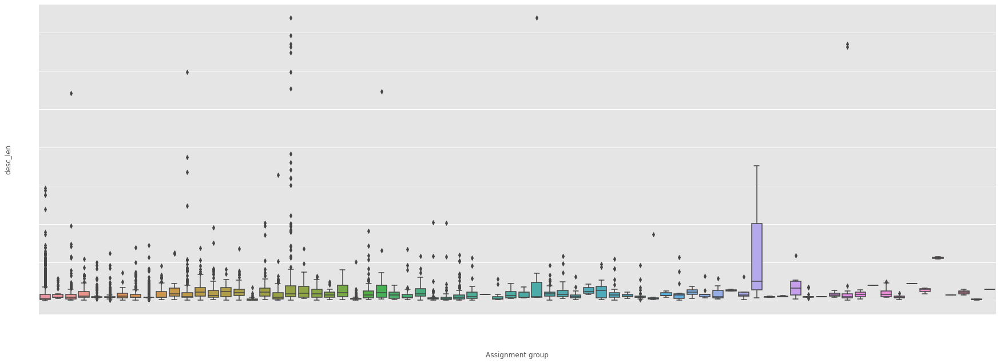

In [ ]:
plt.figure(figsize=(30,10))
lengths = sns.boxplot(data=incidents, x='Assignment group', y='desc_len')
lengths.set_xticklabels(lengths.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

From the above graph, most of the group 56 records have long descriptions.
Let us bring the focus to records which have limited length. 


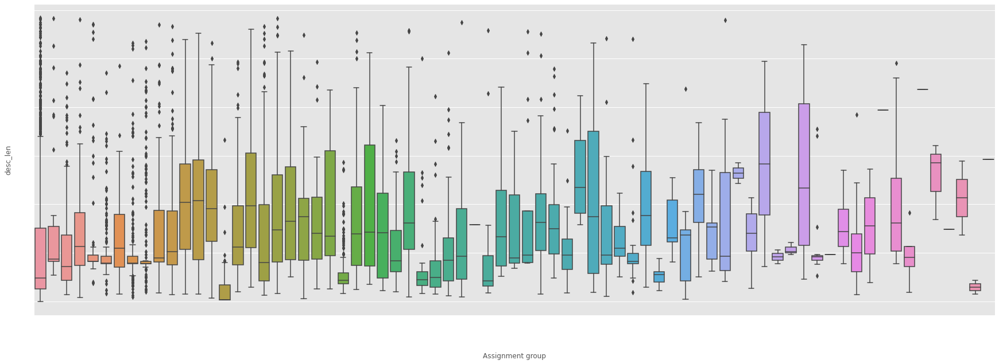

In [ ]:
plt.figure(figsize=(30,10))
lengths = sns.boxplot(data=incidents_95, x='Assignment group', y='desc_len')
lengths.set_xticklabels(lengths.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

There is no clear pattern visible to describe the relation between group and description lengths. It is however visible that for most of the groups, there are less outliers and some groups fall in the lower range while most of them have lengths in the range of 100 to 350.

### Mean length of Description Columns

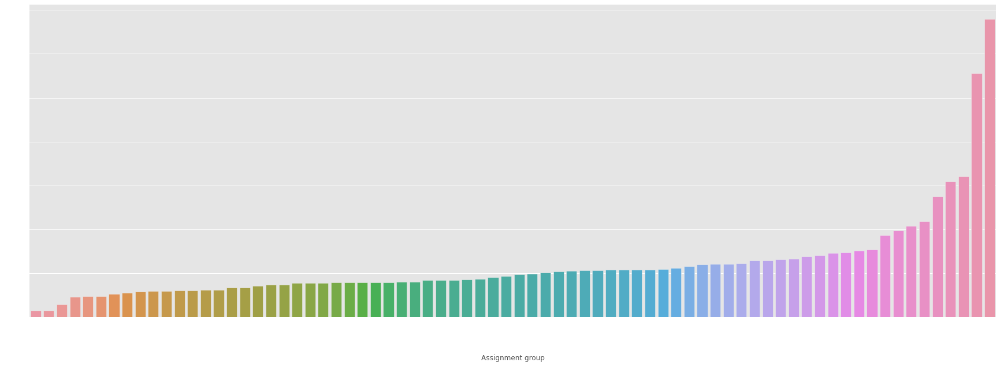

In [ ]:
plt.figure(figsize=(30,10))
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
plot_meandesc_len=sns.barplot(x=incidents.groupby(['Assignment group']).mean()['desc_len'].sort_values().index,
                               y=incidents.groupby(['Assignment group']).mean()['desc_len'].sort_values().values)
plot_meandesc_len.set_xticklabels(plot_meandesc_len.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

There is a clear distinction between the data of five groups which have very long description data. Other group records have mean length lesser than 500 words.

In [ ]:
#Check if short description is present in Description field, else merge both the fields into Description field
incidents['isSubstr'] = incidents.apply(lambda x: x['Short description'] not in x['Description'], axis=1)
incidents.loc[incidents['isSubstr']==True, 'Description'] = incidents['Short description'] + ' ' + incidents['Description']

In [ ]:
incidents.drop(columns=['Short description','sdesc_len','desc_len','isSubstr'],inplace=True)
incidents.head()

,Description,Caller,Assignment group
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,owlgqjme qhcozdfx,GRP_0


### Get the Frequency of Words in the Description Column

---



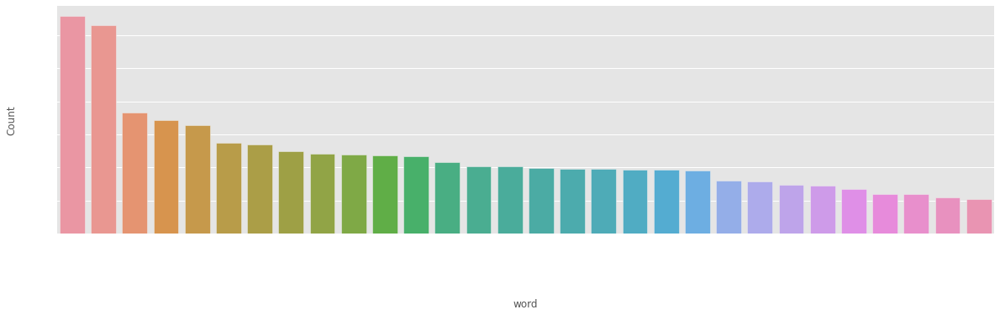

In [ ]:
def freq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()

  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

  # selecting top n most frequent words
  d = words_df.nlargest(columns="count", n = terms) 
  plt.figure(figsize=(20,5))
  plt.rcParams['xtick.color'] = 'white'
  plt.rcParams['ytick.color'] = 'white'
  ax = sns.barplot(data=d, x= "word", y = "count")
  ax.set(ylabel = 'Count')
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
  plt.show()

freq_words(list(incidents['Description']))

**Observation:**

The above plot shows most frequent words in the dataset.
We can see that most of the words are common English words (known as 'stopwords') and doesn't contribute to any inference. We can only try to do inference after we remove stopwords.

#### Generate a wordcloud for the Description column 

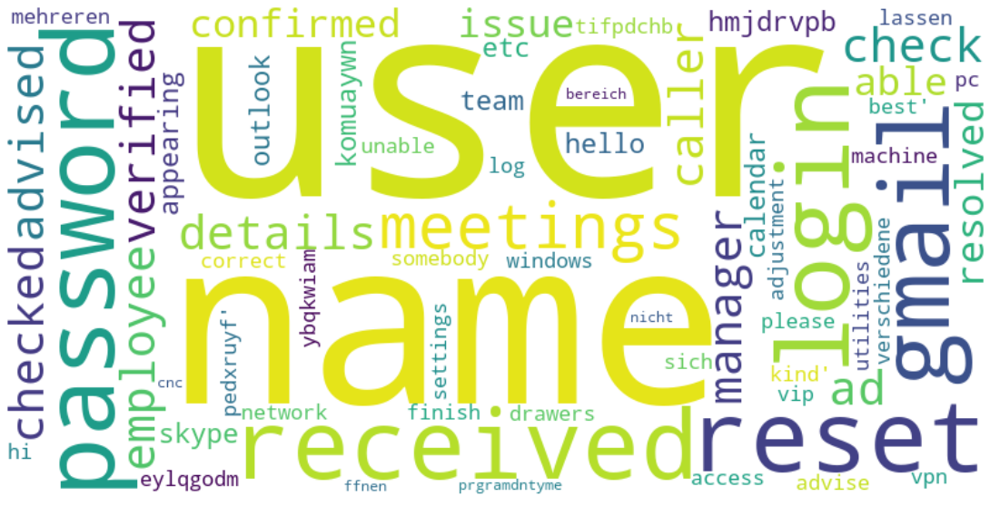

In [ ]:
#word cloud for overall data
stopwords = STOPWORDS

wordcloud = WordCloud(stopwords = stopwords, max_words=500, background_color="white",width=800, height=400).generate(str(incidents['Description'].values))

plt.figure( figsize=(20,10) )
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

**Observation:** 

The word cloud shows the top reasons for raising a ticket but it needs to be pre-processed so that we can identify any patterns.

## Text Pre-processing

#### Expand the contractions

In [ ]:
incidents['Description_Expanded'] = incidents['Description'].apply(lambda x: [contractions.fix(word) for word in x.split()])

#Convert the expanded column to string
incidents['Description_Expanded_Str'] = [' '.join(map(str, l)) for l in incidents['Description_Expanded']]
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error


#### English Language Detection

In [ ]:
pretrained_model = project_path + "lid.176.bin" 
model = fasttext.load_model(pretrained_model)
langs = []
for sent in incidents['Description_Expanded_Str']:
    lang = model.predict(sent)[0]
    langs.append(str(lang)[11:13])
incidents['langs'] = langs

incidents.head(10)

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja
5,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,"[unable, to, log, in, to, engineering, tool, a...",unable to log in to engineering tool and skype,en
6,event critical HostName company com the value ...,jyoqwxhz clhxsoqy,GRP_1,"[event, critical, HostName, company, com, the,...",event critical HostName company com the value ...,en
7,ticket no employment status new non employee e...,eqzibjhw ymebpoih,GRP_0,"[ticket, no, employment, status, new, non, emp...",ticket no employment status new non employee e...,en
8,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,"[unable, to, disable, add, ins, on, outlook]",unable to disable add ins on outlook,en
9,ticket update on inplant,fumkcsji sarmtlhy,GRP_0,"[ticket, update, on, inplant]",ticket update on inplant,en


#### Plot the language Distribution

In [ ]:
#checking detected languages
x=incidents['langs'].value_counts()

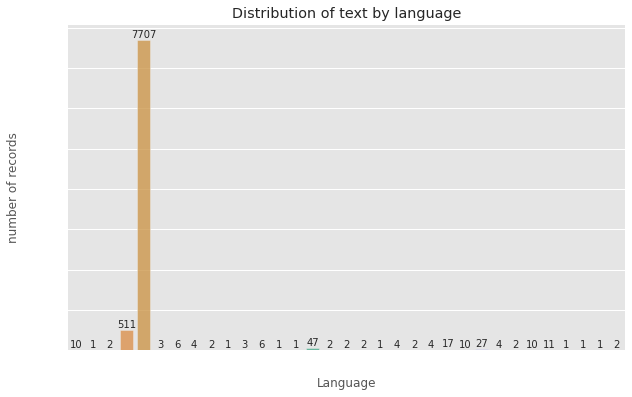

In [ ]:
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Distribution of text by language")
plt.ylabel('number of records')
plt.xlabel('Language')
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

**Observation:**

The plot shows that there is sizeable amount of German (de) text in many records (~500) apart from English. It is of importance to gain knowledge from this records so we will proceed with translate.

#### Translate non-English details

In [ ]:
translator = Translator()

desc_trans=[]

for sentence in incidents['Description_Expanded_Str']:
  try:
    language = translator.translate(sentence).src
    trans = translator.translate(sentence).text if language != 'en' else sentence
  except:
    language = "error"
    print("This row throws an error:", sentence)
  desc_trans.append(trans)

incidents['Translated_Description']=desc_trans
incidents.head()


,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error


#### Tokenization

In [ ]:
incidents['tokenized'] = incidents['Translated_Description'].apply(word_tokenize)
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]"


#### Converting all Characters to Lowercase

In [ ]:
incidents['lower'] = incidents['tokenized'].apply(lambda x: [word.lower() for word in x])
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized,lower
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]","[skype, error]"


#### Removing Punctuations

In [ ]:
punc = string.punctuation
incidents['no_punc'] = incidents['lower'].apply(lambda x: [word for word in x if word not in punc])
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized,lower,no_punc
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]","[skype, error]","[skype, error]"


#### Removing Stopwords

In [ ]:
stop_words = set(nltk.corpus.stopwords.words("english"))
incidents['stopwords_removed'] = incidents['no_punc'].apply(lambda x: [word for word in x if word not in stop_words])
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized,lower,no_punc,stopwords_removed
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, hmjdrvpb, komuaywn, gmail, com, hel..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, eylqgodm, ybqkwiam, gmail, com, hi,..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]","[skype, error]","[skype, error]","[skype, error]"


#### Lemmatization

The idea of stemming is to reduce different forms of word usage into its root word. For example, “drive”, “drove”, “driving”, “driven”, “driver” are derivatives of the word “drive” and very often researchers want to remove this variability from their corpus. Compared to lemmatization, stemming is certainly the less complicated method but it often does not produce a dictionary-specific morphological root of the word. In other words, stemming the word “pies” will often produce a root of “pi” whereas lemmatization will find the morphological root of “pie”.
Instead of taking the easy way out with stemming, let’s apply lemmatization to our data but it requires some additional steps compared to stemming.
1. First, we have to apply parts of speech tags, in other words, determine the part of speech (ie. noun, verb, adverb, etc.) for each word. 
2. We will use spacy's library to convert the words to their lemma.

In [ ]:
nlp = spacy.load('en', disable=['parser', 'ner'])
allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']
def lemmatize_text(text):
    doc = nlp(text)
    return ' '.join([token.lemma_ for token in doc])

incidents['lemma_str'] = [' '.join(map(str,l)) for l in incidents['stopwords_removed']]
incidents['lemma_str'] = incidents['lemma_str'].apply(lemmatize_text)

##### Create 2 new attributes - length and word count of the lemmatized description field

In [ ]:
incidents['desc_len'] = incidents['lemma_str'].astype(str).apply(len)
incidents['desc_word_cnt'] = incidents['lemma_str'].apply(lambda x: len(str(x).split()))

incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized,lower,no_punc,stopwords_removed,lemma_str,desc_len,desc_word_cnt
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...",verify user detail employee manager name check...,138,22
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, hmjdrvpb, komuaywn, gmail, com, hel...",receive hmjdrvpb komuaywn gmail com hello team...,132,19
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, eylqgodm, ybqkwiam, gmail, com, hi,...",receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, access, hr, tool, page]",unable access hr tool page,26,5
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]","[skype, error]","[skype, error]","[skype, error]",skype error,11,2


### Plot the document frequency of the Description Field

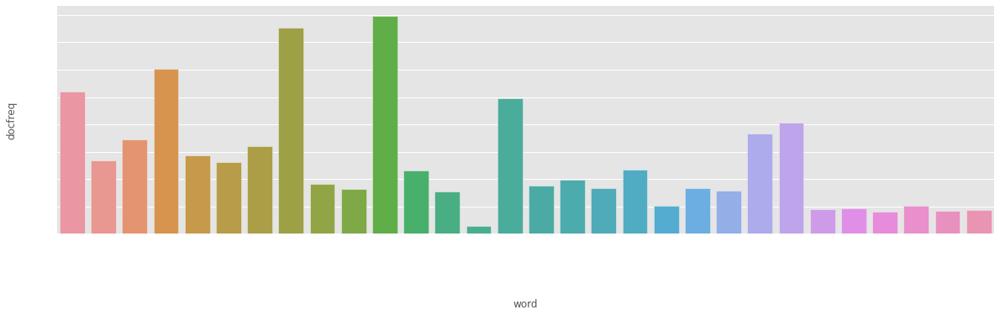

In [ ]:
def docfreq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()

  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})
  
  d = words_df.nlargest(columns="count", n = terms)
  d['docfreq'] = [incidents.Description.str.contains(i).sum() for i in d['word']]
  plt.figure(figsize=(20,5))
  plt.rcParams['xtick.color'] = 'white'
  plt.rcParams['ytick.color'] = 'white'
  ax = sns.barplot(data=d, x= "word", y = "docfreq")
  ax.set(ylabel = 'docfreq')
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
  plt.show()


docfreq_words(list(incidents['Description']))

**Observation:**

The motive behind plotting the frequency of words is to check whether they add value to our prediction data. None of the words have a document frequency that qualify it to be omitted as a stop word from the dataset, so we will proceed further.

## Exploratory Data Analysis on pre-processed Data

In [ ]:
incidents.rename(columns = {'lemma_str':'tokens'}, inplace = True)
incidents.drop(columns=['Description_Expanded','Description_Expanded_Str','langs','Translated_Description','tokenized','lower','no_punc','stopwords_removed'],inplace=True)
incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2


In [ ]:
df_inc = incidents['Assignment group'].value_counts().reset_index()
df_inc['percentage'] = (df_inc['Assignment group']/df_inc['Assignment group'].sum())*100
df_inc.head()

,index,Assignment group,percentage
0,GRP_0,3926,46.693625
1,GRP_8,645,7.671265
2,GRP_24,285,3.389629
3,GRP_12,257,3.056613
4,GRP_9,252,2.997146


##### Lets visualize the percentage of incidents per assignment group

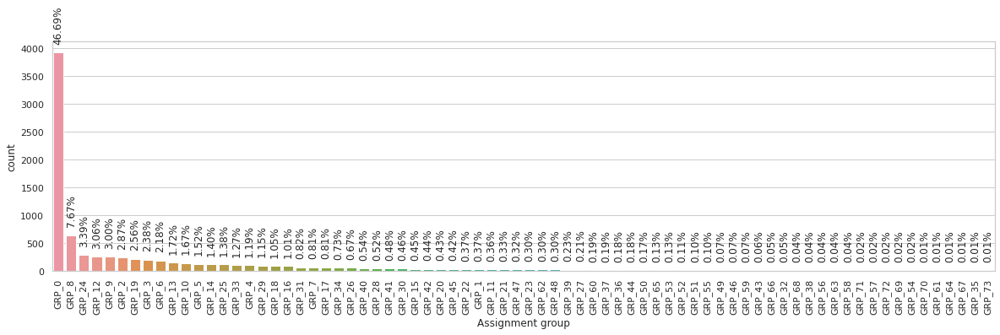

In [ ]:
# Plot to visualize the percentage data distribution across different groups
sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=incidents, order=incidents["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(str(format(p.get_height()/len(incidents.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), \
              ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

**Observation:**

Around three quarters of groups don't even contribute 1% each to the data. This imbalance need to be resolved by detailed data analysis.

##### Lets view the top 20 Assignment groups with highest number of tickets

In [ ]:
df_top_20 = incidents['Assignment group'].value_counts().nlargest(20).reset_index()
df_top_20

,index,Assignment group
0,GRP_0,3926
1,GRP_8,645
2,GRP_24,285
3,GRP_12,257
4,GRP_9,252
5,GRP_2,241
6,GRP_19,215
7,GRP_3,200
8,GRP_6,183
9,GRP_13,145


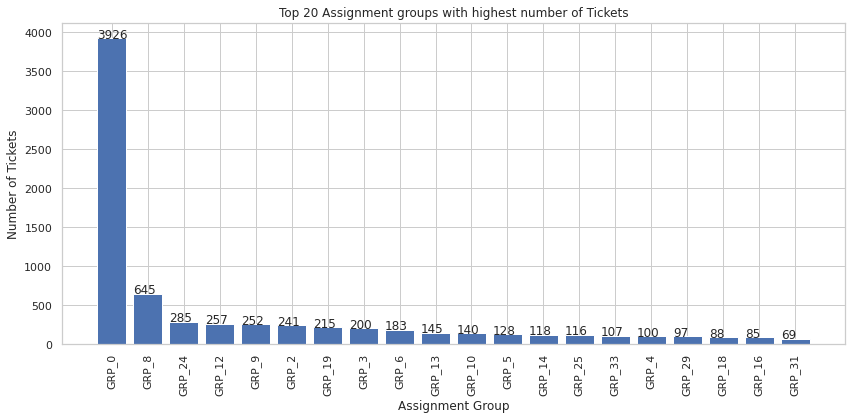

In [ ]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_top_20['index'],df_top_20['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

##### Lets view the bottom 20 Assignment groups with less number of tickets

In [ ]:
df_bottom_20 = incidents['Assignment group'].value_counts().nsmallest(20).reset_index()
df_bottom_20

,index,Assignment group
0,GRP_70,1
1,GRP_61,1
2,GRP_64,1
3,GRP_67,1
4,GRP_35,1
5,GRP_73,1
6,GRP_71,2
7,GRP_57,2
8,GRP_72,2
9,GRP_69,2


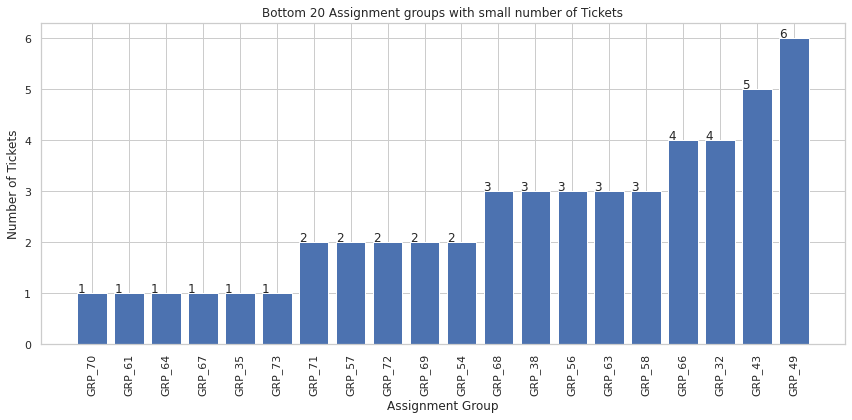

In [ ]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_bottom_20['index'],df_bottom_20['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

##### Distribution of tickets based on ticket count

In [ ]:
df_bins = pd.DataFrame(columns=['Description','Ticket Count'])
one_ticket = {'Description':'1 ticket','Ticket Count':len(df_inc[df_inc['Assignment group'] < 2])}
_2_5_ticket = {'Description':'2-5 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 1)& (df_inc['Assignment group'] < 6) ])}
_10_ticket = {'Description':' 6-10 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 5)& (df_inc['Assignment group'] < 11)])}
_10_20_ticket = {'Description':' 11-20 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 10)& (df_inc['Assignment group'] < 21)])}
_20_50_ticket = {'Description':' 21-50 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 20)& (df_inc['Assignment group'] < 51)])}
_51_100_ticket = {'Description':' 51-100 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 50)& (df_inc['Assignment group'] < 101)])}
_100_ticket = {'Description':' >100 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 100)])}
#append row to the dataframe
df_bins = df_bins.append([one_ticket,_2_5_ticket,_10_ticket,
                          _10_20_ticket,_20_50_ticket,_51_100_ticket,_100_ticket], ignore_index=True)

df_bins

,Description,Ticket Count
0,1 ticket,6
1,2-5 ticket,13
2,6-10 ticket,6
3,11-20 ticket,9
4,21-50 ticket,16
5,51-100 ticket,9
6,>100 ticket,15


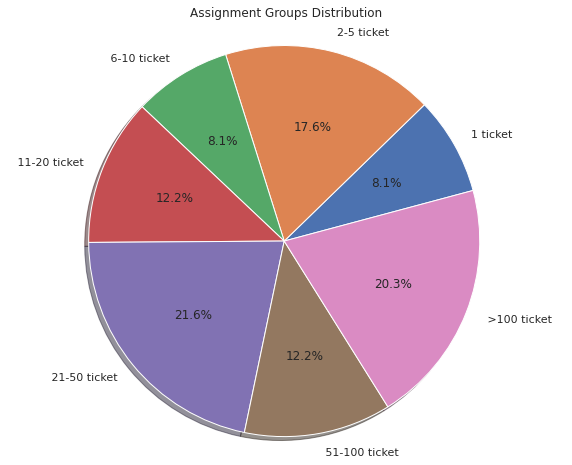

In [ ]:
plt.figure(figsize=(10, 8))
plt.pie(df_bins['Ticket Count'],labels=df_bins['Description'],autopct='%1.1f%%', startangle=15, shadow = True);
plt.title('Assignment Groups Distribution')
plt.axis('equal');

**Observation:**
* There are 15 Assignment group’s which have more than 100 tickets.
* Around 20% of the Assignment groups have greater than 100 tickets.

##### Derive insights on ticket distribution by L1/L2 and L3 Queues

In [ ]:
df_incidents_level = incidents.copy()
df_incidents_level['Target'] = np.where(df_incidents_level['Assignment group']=='GRP_0','L1/L2',np.where(df_incidents_level['Assignment group'] =='GRP_8','L1/L2','L3'))

Text(0, 0.5, 'samples')

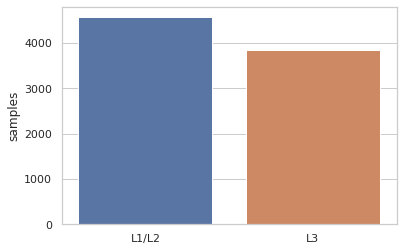

In [ ]:
x=df_incidents_level.Target.value_counts()
sns.barplot(x.index,x)
plt.gca().set_ylabel('samples')

**Observation:**

Given majority records are L1/L2, we assume group 0 and 8 records as L1/L2 tickets and try to observe how they stack up with respect to L3 tickets. L1/L2 records make up more than half of the total data.

#### Characters in Short description by L1/L2 and L3

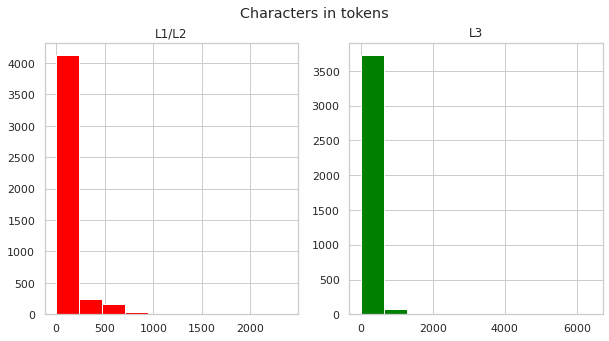

In [ ]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
text_len=df_incidents_level[df_incidents_level['Target']=='L1/L2']['tokens'].str.len()
ax1.hist(text_len.dropna(),color='red')
ax1.set_title('L1/L2')
text_len=df_incidents_level[df_incidents_level['Target']=='L3']['tokens'].str.len()
ax2.hist(text_len.dropna(),color='green')
ax2.set_title('L3')
fig.suptitle('Characters in tokens')
plt.show()

#### Words in Short description by L1/L2 and L3

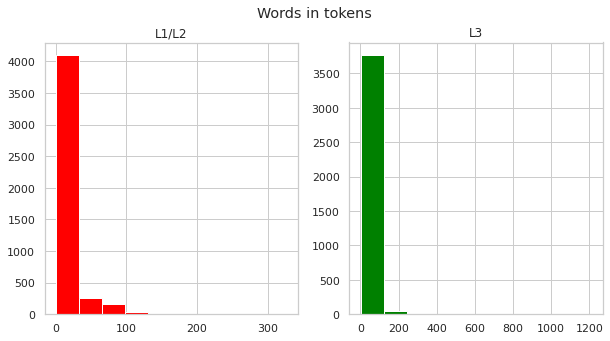

In [ ]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
text_len=df_incidents_level[df_incidents_level['Target']=='L1/L2']['tokens'].str.split().map(lambda x: len(str(x).split(" ")))
ax1.hist(text_len.dropna(),color='red')
ax1.set_title('L1/L2')
text_len=df_incidents_level[df_incidents_level['Target']=='L3']['tokens'].str.split().map(lambda x: len(str(x).split(" ")))
ax2.hist(text_len.dropna(),color='green')
ax2.set_title('L3')
fig.suptitle('Words in tokens')
plt.show()

**Observation:**

From the above graphs, we observe how the character and word count stack up for records for different support levels.

##### Take a look at the average (mean) number of words in each ticket, and the longest and shortest description in our data set

In [ ]:
incidents['desc_word_cnt'].mean()

20.17756898192198

In [ ]:
print(incidents['desc_word_cnt'].max())
print(incidents['desc_word_cnt'].min())

1210
0


In [ ]:
len(incidents[incidents['desc_word_cnt']==0])

47

**Average Word Count**

In [ ]:
def avg_word(sentence):
  words = sentence.split()
  if len(words) > 0:
    avg_cnt = sum(len(word) for word in words)/len(words)
  else:
    avg_cnt = 0
  return (avg_cnt)

df_incidents = incidents.copy()
df_incidents['avg_word'] = df_incidents['tokens'].apply(lambda x: avg_word(str(x)))
df_incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt,avg_word
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22,5.318182
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19,6.000000
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9,4.777778
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5,4.400000
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2,5.000000


##### Visualize a distribution of the description word counts to see how skewed our average might be by outliers. 

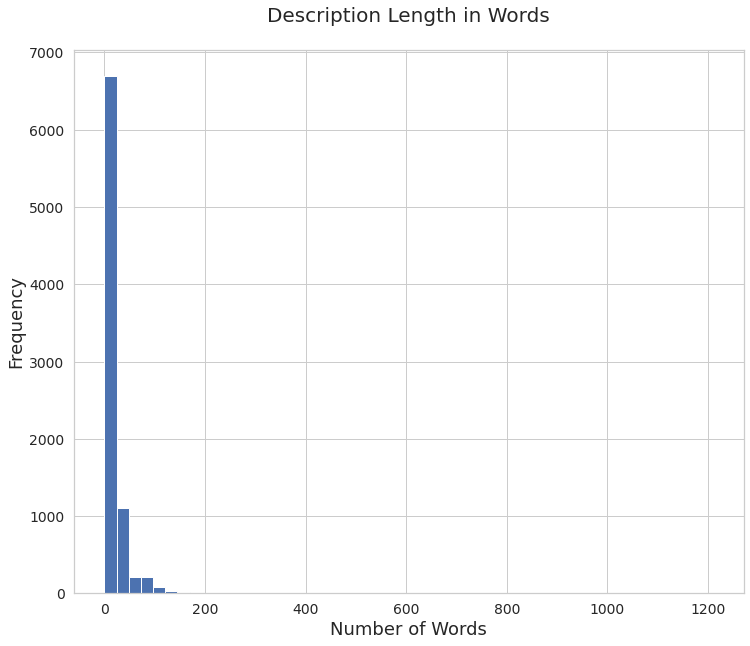

In [ ]:
ax=df_incidents['desc_word_cnt'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Description Length in Words\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Words', fontsize=18);

**Observation:**

Though most records have length in the lower range, there is significant amount of data with longer sentences.

#### Number of unique words in each article

In [ ]:
df_incidents['uniq_wds'] = df_incidents['tokens'].str.split().apply(lambda x: len(set(x)))
df_incidents['uniq_wds'].head()

0    17
1    18
2     9
3     5
4     2
Name: uniq_wds, dtype: int64

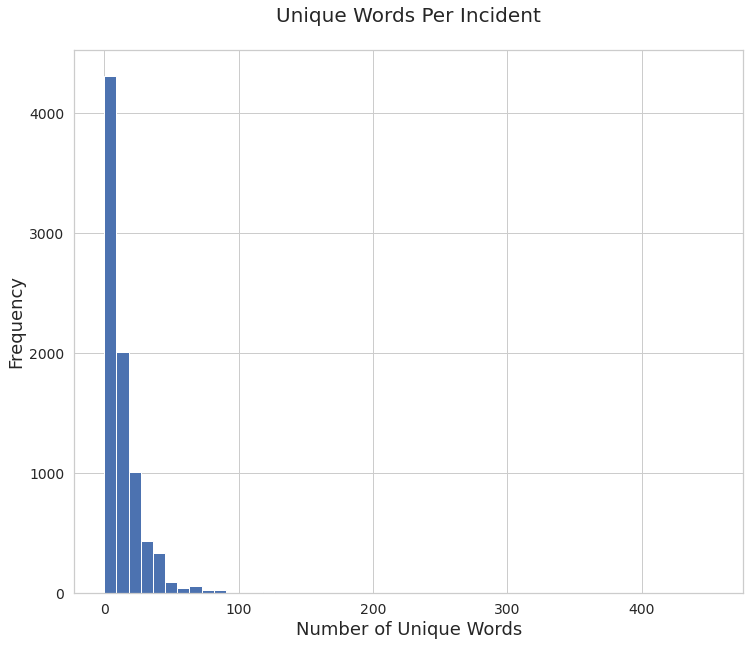

In [ ]:
ax=df_incidents['uniq_wds'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Unique Words Per Incident\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Unique Words', fontsize=18);

When we plot this into a chart, we can see that while the distribution of unique words is still skewed, it looks a bit similar to the distribution based on total word counts we generated earlier.

##### Mean Number of Words in tickets per Assignment Group

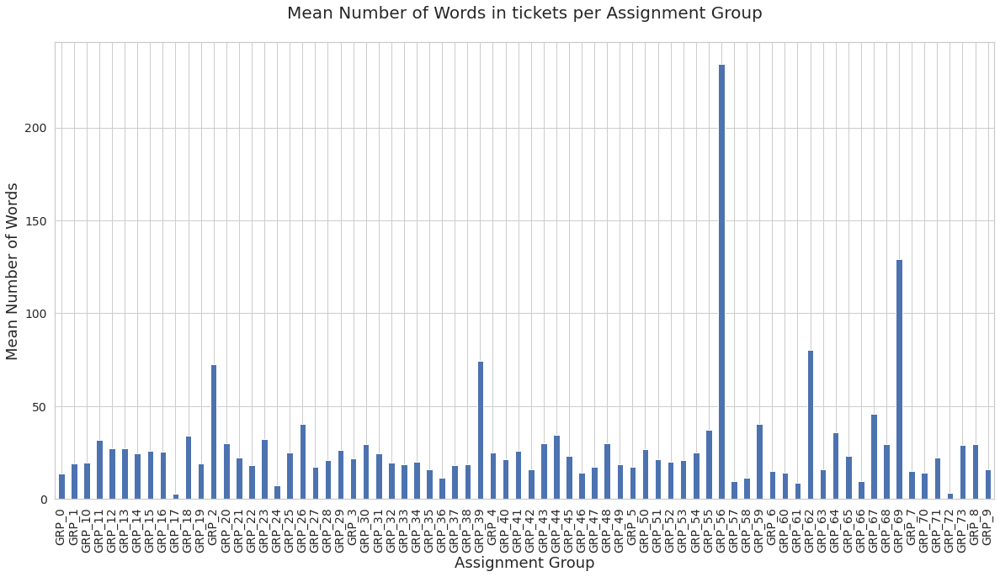

In [ ]:
assign_grps = df_incidents.groupby('Assignment group')
ax=assign_grps['desc_word_cnt'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Words in tickets per Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

##### Mean Number of Unique Words in tickets per Assignment Group

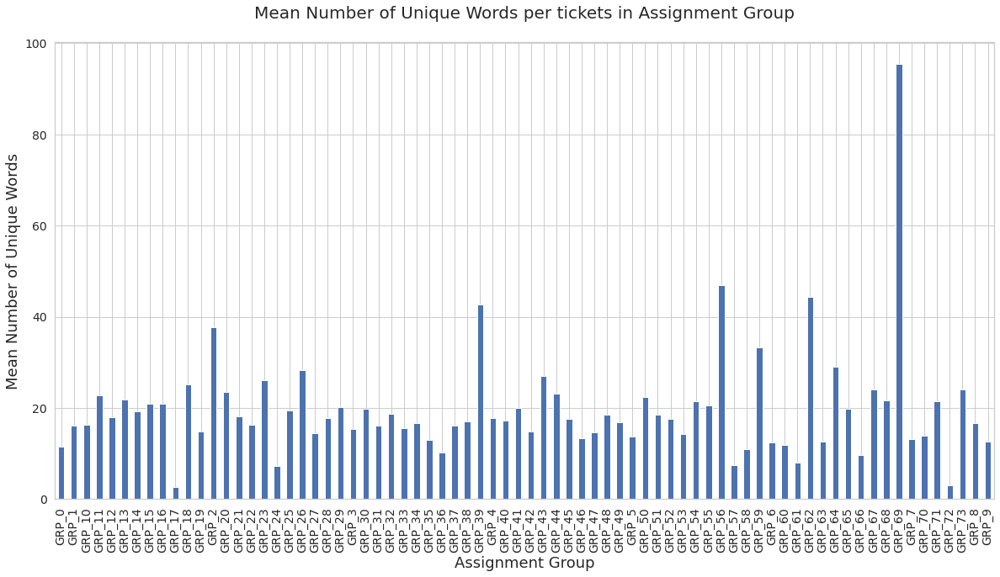

In [ ]:
ax=assign_grps['uniq_wds'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Unique Words per tickets in Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Unique Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

##### The most common words over the entire corpus.



In [ ]:
wd_counts = Counter()
for i, row in df_incidents.iterrows():
    wd_counts.update(row['tokens'].split())
    
wd_counts.most_common(20)

[('com', 3645),
 ('job', 2520),
 ('receive', 2471),
 ('company', 2408),
 ('gmail', 2147),
 ('tool', 2055),
 ('yes', 2027),
 ('please', 2014),
 ('na', 1939),
 ('password', 1420),
 ('user', 1369),
 ('erp', 1206),
 ('sid', 1101),
 ('monitor', 1025),
 ('ticket', 1021),
 ('access', 995),
 ('issue', 959),
 ('scheduler', 949),
 ('fail', 934),
 ('-PRON-', 897)]

##### WordCloud

A word cloud is a collection, or cluster, of words depicted in different sizes. The bigger and bolder the word appears, the more often it’s mentioned within a given text and the more important it is.

Also known as tag clouds or text clouds, these are ideal ways to pull out the most pertinent parts of textual data, often also help business users compare and contrast two different pieces of text to find the wording similarities between the two.

Let's write a generic method to generate Word Clouds for both Description column.

In [ ]:
def f_word_cloud(column):
    
    comment_words = ' '
    stopwords = set(STOPWORDS)

    # iterate through the csv file 
    for val in column: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 
    
    return wordcloud

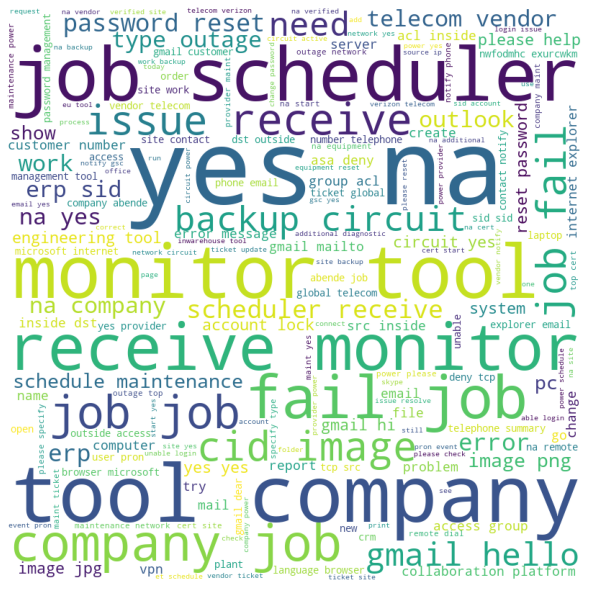

In [ ]:
wordcloud = f_word_cloud(incidents.tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

Word Cloud for tickets with Assignment group 'GRP_0'

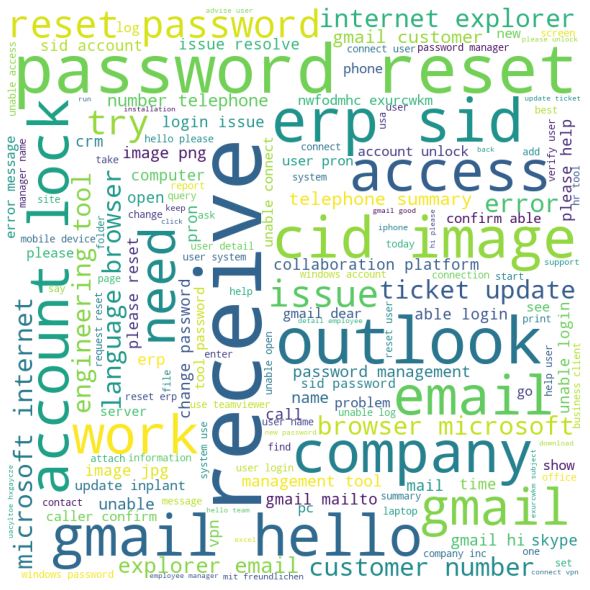

In [ ]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_0'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** 
* Analysis on GRP_0 which is the most frequent group to assign a ticket to reveals that this group deals with mostly the maintenance problems such as password reset, account lock, login issue, connectivity issue, ticket update etc.
* Maximum of the tickets from GRP_0 can be reduced by self correcting itself by putting automation scripts/mechanisms to help resolve these common maintenance issues. This will help in lowering the inflow of service tickets thereby saving the person/hour efforts spend and increasing the business revenue.

The word 'password' seems to be prominent for group 0 data, let us try a hypothesis testing procedure to conclude better.

In [ ]:
inc_hypo = incidents.copy()
inc_hypo['count_password']=inc_hypo.tokens.str.count("password")

In [ ]:
inc_hypo = inc_hypo[['Assignment group','count_password', 'desc_word_cnt']]
inc_hypo=inc_hypo.rename(columns={"Assignment group":"Assign_group"})
inc_hypo.head()

,Assign_group,count_password,desc_word_cnt
0,GRP_0,1,22
1,GRP_0,0,19
2,GRP_0,0,9
3,GRP_0,0,5
4,GRP_0,0,2


In [ ]:
inc_hypo.groupby(by=['Assign_group']).mean().sort_values(by='count_password',ascending=False)['count_password']

Assign_group
GRP_17    0.514706
GRP_53    0.454545
GRP_38    0.333333
GRP_0     0.329598
GRP_7     0.323529
            ...   
GRP_47    0.000000
GRP_48    0.000000
GRP_5     0.000000
GRP_50    0.000000
GRP_9     0.000000
Name: count_password, Length: 74, dtype: float64

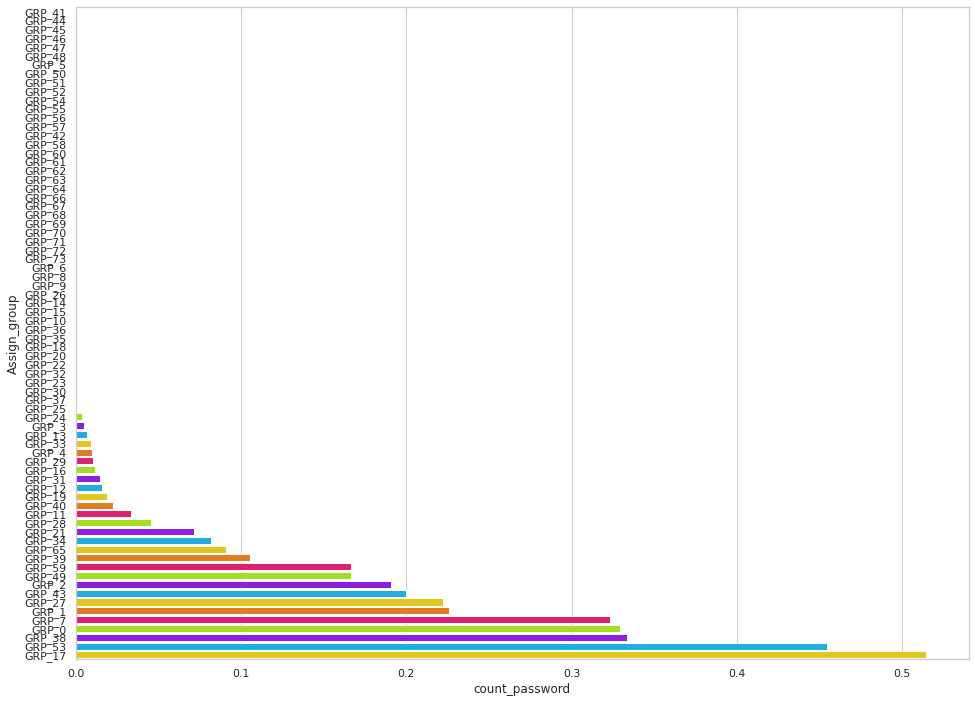

In [ ]:
rcParams['figure.figsize']=16,12
chart = sns.barplot(x = inc_hypo.groupby(by=['Assign_group']).mean().sort_values(by='count_password')['count_password'], 
                    y = inc_hypo.groupby(by=['Assign_group']).mean().sort_values(by='count_password').index, palette=HAPPY_COLORS_PALETTE)

### Step 1: State the null and alternative hypothesis:

* $H_0$: The word 'password' is equally probable to be present in tickets to all groups
* $H_A$: At least one group has close relevance to password related tickets


### Step 2: Decide the significance level

Here we select α = 0.05

### Step 3: Identify the test statistic

There are 38 groups as part of our analysis. Analysis of variance can determine the characteristic of the group (relevance with password related tickets). ANOVA uses F-tests to statistically test the equality of means.

### Step 4: Calculate p value using ANOVA table

* statsmodels.formula.api.ols creates a model from a formula and dataframe
* statsmodels.api.sm.stats.anova_lm gives an Anova table for one or more fitted linear models

In [ ]:
mod = ols('count_password ~ Assign_group', data = inc_hypo).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                   sum_sq      df         F        PR(>F)
Assign_group   218.203378    73.0  8.405189  9.052943e-83
Residual      2963.770814  8334.0       NaN           NaN


### Step 5:  Decide to reject or accept null hypothesis

In this example, p value is very close to 0 and it is less than our chosen level of signifance at 5%
So the statistical decision is to reject the null hypothesis at 5% level of significance.

### So there is sufficient evidence that the password related tickets are more specific to particular group.

### Determine which mean(s) is / are different

* An ANOVA test will test that at least one mean is different. 
* You have rejected the null hypothesis but do not know which mean(s) is / are different.
We use Tukey-krammer HSD test to detect which mean(s) is / are different.

In [ ]:
print(pairwise_tukeyhsd(inc_hypo['count_password'], inc_hypo['Assign_group']))

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
 GRP_0  GRP_1  -0.1038    0.9 -0.5524  0.3448  False
 GRP_0 GRP_10  -0.3296  0.001 -0.5436 -0.1156   True
 GRP_0 GRP_11  -0.2963    0.9 -0.7522  0.1597  False
 GRP_0 GRP_12   -0.314  0.001 -0.4742 -0.1538   True
 GRP_0 GRP_13  -0.3227  0.001 -0.5331 -0.1123   True
 GRP_0 GRP_14  -0.3296  0.001  -0.562 -0.0971   True
 GRP_0 GRP_15  -0.3296  0.475 -0.7351  0.0759  False
 GRP_0 GRP_16  -0.3178 0.0027 -0.5906 -0.0451   True
 GRP_0 GRP_17   0.1851    0.9 -0.1192  0.4894  False
 GRP_0 GRP_18  -0.3296  0.001 -0.5978 -0.0614   True
 GRP_0 GRP_19   -0.311  0.001 -0.4853 -0.1367   True
 GRP_0  GRP_2  -0.1387 0.3748 -0.3038  0.0264  False
 GRP_0 GRP_20  -0.3296 0.5408 -0.7461   0.087  False
 GRP_0 GRP_21  -0.2582    0.9   -0.73  0.2137  False
 GRP_0 GRP_22  -0.3296 0.7128 -0.7782   0.119  False
 GRP_0 GRP_23  -0.3296    0.9 -0.8288  0.1696 

Word Cloud for tickets with Assignment group 'GRP_8'

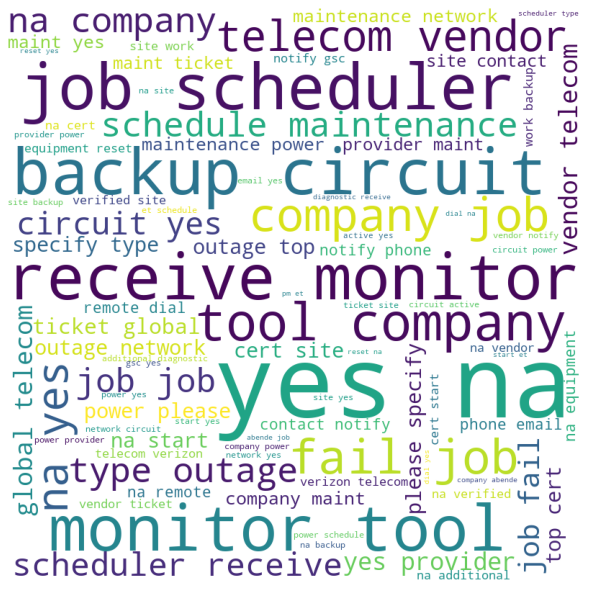

In [ ]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_8'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** GRP_8 seems to have tickets related to outage, job failures, monitoring tool etc

Word Cloud for tickets with Assignment group 'GRP_12'

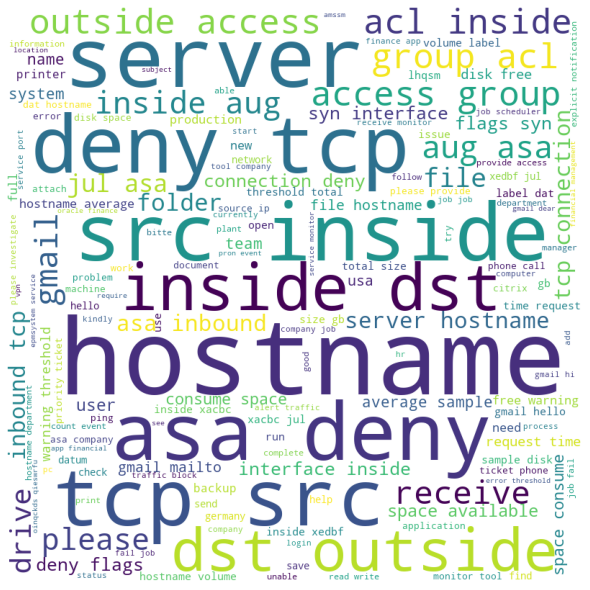

In [ ]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_12'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** GRP_12 contains tickets related to systems like disk space issues, network issues like tie out, citrix issue, connectivity timeout etc.

Word Cloud for tickets with Assignment group 'GRP_24'

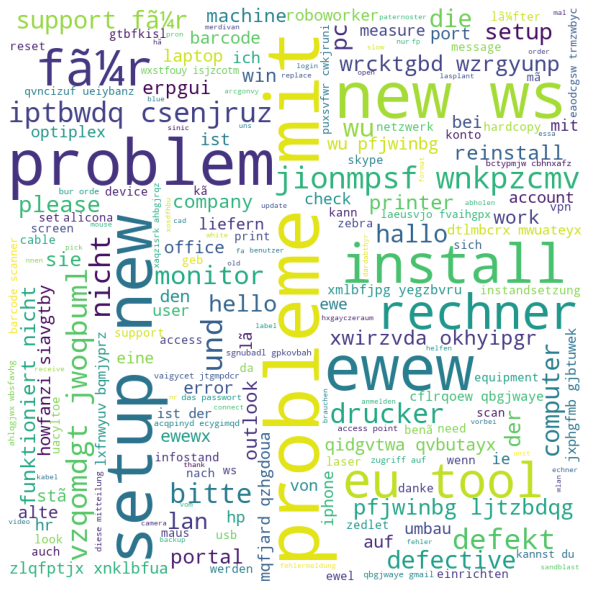

In [ ]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_24'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** GRP_24 - Tickets are mainly in german, these tickets were translated to english before passing it to our model.

#### Measure Readability of a ticket
The readability of a document says about the level of ease of understanding and interpretation .The readability of a text document can be checked using various readability indices like Flesch Reading Ease, Dale Chall Readability Score, and Gunning Fog Index.

For this, we can use the **textstat** library in Python. Textstat is typically used for determining readability, complexity, and grade level of a particular corpus. Each of these indices works on a different methodology for determining the readability level of a document.

In [ ]:
df_incidents['dale_chall_score']=df_incidents['tokens'].apply(lambda x: textstat.dale_chall_readability_score(x))
df_incidents['flesh_reading_ease']=df_incidents['tokens'].apply(lambda x: textstat.flesch_reading_ease(x))
df_incidents['gunning_fog']=df_incidents['tokens'].apply(lambda x: textstat.gunning_fog(x))

print('Dale Chall Score     =>',df_incidents['dale_chall_score'].mean())
print('Flesch Reading Score =>',df_incidents['flesh_reading_ease'].mean())
print('Gunning Fog Index    =>',df_incidents['gunning_fog'].mean())

Dale Chall Score     => 10.22579210275912
Flesch Reading Score => 44.496159609895074
Gunning Fog Index    => 12.003206470028468


**Observation:**
There is very little difference in the Dale Chall Score and the Gunning Fog Index. But there is a considerable amount of variation in the Flesch Reading Score.

Still, we cannot tell the difference in the readability of the two. The textstat library has a solution for this as well. It provides the text_standard() function. that uses various readability checking formulas, combines the result and returns the grade of education required to understand a particular document completel

In [ ]:
df_incidents['text_standard']=df_incidents['tokens'].apply(lambda x: textstat.text_standard(x))
print('Text Standard of Tickets =>',df_incidents['text_standard'].mode())

Text Standard of Tickets => 0    7th and 8th grade
dtype: object


**Observation:** 
The tickets are easily understandable by anyone who has completed the 9th or 10th grade in school.

Let’s take a look at the reading time of tickets. An average adult reads about 250 words per minute. We can also calculate the reading time of a document using the textstat library. It provides the reading_time() function, which takes a piece of text as an argument and returns the reading time for it in seconds.

In [ ]:
df_incidents['reading_time']=df_incidents['tokens'].apply(lambda x: textstat.reading_time(x))
print('Reading Time of =>',df_incidents['reading_time'].mean())

Reading Time of => 1.6358039961940967


**Observation:** On looking at the reading time, people usually find longer descriptions helpful (around 400-500 words).

#### Pickling the data post language translation for reuse, further preprocessing to be performed

In [ ]:
with open('incidents_trans.pickle', 'wb') as output:
    pickle.dump(incidents, output)

In [238]:
with open('incidents_trans.pickle', 'rb') as data:
    incidents = pickle.load(data)

## Topic Modeling
We need to convert our text into numbers or vectors. So following methods are used

### Count Vectorizer
The CountVectorizer method of vectorizing tokens transposes all the words/tokens into features and then provides a count of occurrence of each word. The result is called a document term matrix

In [239]:
tf_vectorizer = CountVectorizer(max_df=0.9, min_df=25, max_features=5000)
tf = tf_vectorizer.fit_transform(incidents['tokens'].values.astype('U'))
tf_feature_names = tf_vectorizer.get_feature_names()
doc_term_matrix = pd.DataFrame(tf.toarray(), columns=list(tf_feature_names))
doc_term_matrix

,abende,able,accept,access,account,action,activate,activation,active,activity,ad,add,additional,address,admin,administrator,advise,aerp,affect,agent,alert,allow,already,also,alternate,always,amar,analysis,another,ap,apac,app,appear,application,approval,approve,area,asa,ask,assign,...,vip,visitor,vlan,volume,von,vpn,want,warehouse,warm,warning,way,web,website,wednesday,week,welcome,well,wifi,win,window,windows,wireless,within,without,word,work,workflow,working,would,write,wrong,ws,www,yes,yesterday,µè,å¼,æ³,æœ,çš
0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8403,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8404,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8405,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8406,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### LDA Topic Modelling
Now that we have prepared our data for topic modeling, we’ll be using the Latent Dirichlet Allocation (LDA) approach to determine the topics present in our corpus. In our model, we are going to produce 10 individual topics (ie. n_components). Once the model is created let’s create a function to display the identified topics. Each topic will consist of 10 words. The function will have three required parameters; the LDA model, feature names from the document term matrix, and the number of words per topic.

In [240]:
lda_model = LatentDirichletAllocation(n_components=10, learning_method='online', max_iter=500, random_state=0).fit(tf)
no_top_words = 10
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic %d:" % (topic_idx))
        print(" ".join([feature_names[i]
                          for i in topic.argsort()[:-no_top_words - 1:-1]]))
              
display_topics(lda_model, tf_feature_names, no_top_words)

Topic 0:
com gmail receive please hello image cid help company hi
Topic 1:
access company send device subject pm deny com platform collaboration
Topic 2:
request call time get try use screen phone crm computer
Topic 3:
ticket event update pc tcp ip connection asa group source
Topic 4:
job tool company com monitor receive scheduler fail abende sid
Topic 5:
outlook unable email report customer name number internet skype language
Topic 6:
pron would hostname error please server order file plant see
Topic 7:
printer usa erp print need please problem system may tool
Topic 8:
password user account sid erp reset login issue tool lock
Topic 9:
yes na site power circuit vendor backup telecom network schedule


Topics produced via LDA are - 
* Topic 0 - Printer 
* Topic 1 - Job Scheduler
* Topic 2 - Power Outage 
* Topic 3 - Login Issues
* Topic 4 - Collaboration
* Topic 5 - Gmail
* Topic 6 - Password Reset
* Topic 7 - Outlook
* Topic 8 - ?
* Topic 9 - ?


In [241]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(lda_model, tf, tf_vectorizer, mds='tsne')
panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0      -75.994255 -141.563858       1        1  14.116082
6       27.232401 -143.355774       2        1  13.923626
9       35.335777  -51.787392       3        1  12.009155
2     -139.458267  -41.992741       4        1  10.635492
8      -11.192470   21.079712       5        1  10.618972
4      120.724068  -72.195908       6        1   9.232530
3      -51.099258  -55.690273       7        1   7.957311
1       88.419708   33.334984       8        1   7.547922
7        6.373305  107.102127       9        1   7.246334
5      -97.609917   52.372063      10        1   6.712575, topic_info=        Term         Freq        Total Category  logprob  loglift
330      job  2447.000000  2447.000000  Default  30.0000  30.0000
720      yes  2088.000000  2088.000000  Default  29.0000  29.0000
401       na  1997.000000  1997.000000  Default  28.0000  28.0000
97       com  3580.000000  3580.000000  Default  27.0000  27.0000
514  receive  2415.000000  2415.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
402     name   248.831777   710.330325  Topic10  -3.4840   1.6522
712     work   180.157335   799.027958  Topic10  -3.8069   1.2116
266    gmail   187.730622  2110.620742  Topic10  -3.7657   0.2815
97       com   195.375971  3580.688149  Topic10  -3.7258  -0.2072
263      get    76.140321   632.832998  Topic10  -4.6682   0.5836

[493 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
0         6  0.994218  abende
1         1  0.170160    able
1         2  0.153955    able
1         5  0.675240    able
2         4  0.988118  accept
...     ...       ...     ...
718       5  0.986512      ws
720       3  0.999674     yes
724      10  0.980553      æ³
725      10  0.980081      æœ
726      10  0.989502      çš

[625 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 7, 10, 3, 9, 5, 4, 2, 8, 6])

### NMF using TF-IDF 
LDA isn’t the only approach to topic modeling. Let’s try another method named the Non-Negative Matrix Factorization (NMF) approach and see if our topics can be slightly more defined. Instead of using the simple CountVectorizer method to vectorize our words/tokens, we’ll use the TF-IDF (Term Frequency — Inverse Document Frequency) method. The TF-IDF method helps to bring down the weight/impact of high-frequency words.

In [242]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.90, min_df =25, max_features=5000, use_idf=True)
tfidf1 = tfidf_vectorizer.fit_transform(incidents['tokens'])
tfidf_feature_names = tfidf_vectorizer.get_feature_names()
doc_term_matrix_tfidf = pd.DataFrame(tfidf1.toarray(), columns=list(tfidf_feature_names))
doc_term_matrix_tfidf

,abende,able,accept,access,account,action,activate,activation,active,activity,ad,add,additional,address,admin,administrator,advise,aerp,affect,agent,alert,allow,already,also,alternate,always,amar,analysis,another,ap,apac,app,appear,application,approval,approve,area,asa,ask,assign,...,vip,visitor,vlan,volume,von,vpn,want,warehouse,warm,warning,way,web,website,wednesday,week,welcome,well,wifi,win,window,windows,wireless,within,without,word,work,workflow,working,would,write,wrong,ws,www,yes,yesterday,µè,å¼,æ³,æœ,çš
0,0.0,0.172194,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.217859,0.0,0.0,0.0,0.0,0.0,0.210338,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.244771,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.277309,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.47847,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.000000,0.0,0.382723,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8403,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.428831,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8404,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8405,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.704032,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.499685,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8406,0.0,0.000000,0.0,0.334179,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0000

In [243]:
len(tfidf1.todense())

8408

In [244]:
nmf = NMF(n_components=10, random_state=0, alpha=.1, init='nndsvd').fit(tfidf1)
display_topics(nmf, tfidf_feature_names, no_top_words)

Topic 0:
job scheduler monitor fail tool company receive com abende sid
Topic 1:
password reset windows management request change tool manager please ess
Topic 2:
gmail com receive image cid please hello png help mailto
Topic 3:
account lock windows unlock ad get window expire unlocked please
Topic 4:
yes na circuit power site telecom backup vendor outage cert
Topic 5:
unable outlook connect login skype open vpn launch log engineering
Topic 6:
ticket update inplant inc printer driver query call information incident
Topic 7:
erp sid unlock reset log production system account hana error
Topic 8:
internet email explorer browser summary number telephone microsoft customer language
Topic 9:
user issue login pron would please error system work able


Topics produced via NMF are - 
* Topic 0 - Scheduler 
* Topic 1 - Password Reset
* Topic 2 - Gmail
* Topic 3 - Account Lock
* Topic 4 - Printer
* Topic 5 - Power Outage
* Topic 6 - Login Issue
* Topic 7 - User account
* Topic 8 - Browser
* Topic 9 - Outlook

The topics produced via NMF seem to be much more distinct compared to LDA.

Let’s add both the LDA and NMF topics into our dataframe for further analysis. Let’s also remap the integer topics into our subjectively derived topic labels.

In [ ]:
nmf_topic_values = nmf.transform(tfidf1)
df_incidents_level['nmf_topics'] = nmf_topic_values.argmax(axis=1)
lda_topic_values = lda_model.transform(tf)
df_incidents_level['lda_topics'] = lda_topic_values.argmax(axis=1)
lda_remap = {0: 'Printer', 1: 'Job Scheduler', 2: 'Power Outage', 3: 'Login Issues', 
             4: 'Collaboration', 5: 'Gmail', 6: 'Passowrd Reset', 
             7: 'Outlook', 8: 'Unknown1', 9: 'Unknown2'}
df_incidents_level['lda_topics'] = df_incidents_level['lda_topics'].map(lda_remap)
nmf_remap = {0: 'Scheduler', 1: 'Password Reset', 2: 'Gmail', 3: 'Account Lock', 
             4: 'Printer', 5: 'Power Outage', 6: 'Login Issue', 7: 'User Account', 
             8: 'Browser', 9: 'Outlook'}
df_incidents_level['nmf_topics'] = df_incidents_level['nmf_topics'].map(nmf_remap)

##### Plot the top most reasons for raising a ticket

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]),
 <a list of 7 Text major ticklabel objects>)

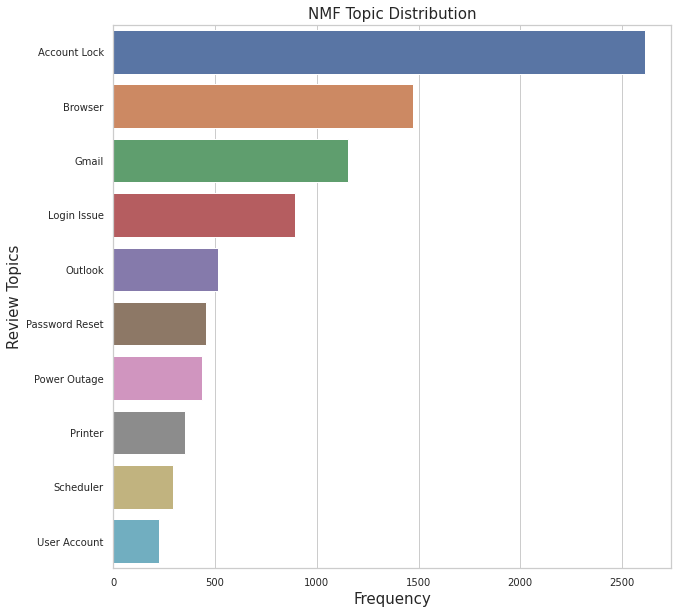

In [ ]:
nmf_x = df_incidents_level['nmf_topics'].value_counts()
nmf_y = nmf_x.sort_index()
plt.figure(figsize=(10,10))
sns.barplot(nmf_x, nmf_y.index)
plt.title("NMF Topic Distribution", fontsize=15)
plt.ylabel('Review Topics', fontsize=15)
plt.yticks(fontsize=10)
plt.xlabel('Frequency', fontsize=15)
plt.xticks(fontsize=10)

#### Try and see if the data could be clustered

In [ ]:
def create_bag_of_words(X):
    vectorizer = CountVectorizer(analyzer = "word", tokenizer = None, preprocessor = None, stop_words = 'english', ngram_range = (1,3), max_features = 10000) 
    train_data_features = vectorizer.fit_transform(X)
    train_data_features = train_data_features.toarray()
    
    # tfidf transform
    tfidf = TfidfTransformer()
    tfidf_features = tfidf.fit_transform(train_data_features).toarray()

    # Get words in the vocabulary
    vocab = vectorizer.get_feature_names()
      
    return vectorizer, vocab, train_data_features, tfidf_features, tfidf

In [ ]:
# word level tf-idf for ticket
vectorizer, vocab, train_data_features, tfidf_features, tfidf  =  create_bag_of_words(incidents['Description'])

In [ ]:
#  create a dictionary mapping the tokens to their tfidf values
bag_dictionary = pd.DataFrame()
bag_dictionary['ngram'] = vocab
bag_dictionary['count'] = train_data_features[0]
bag_dictionary['tfidf_features'] = tfidf_features[0]

# Sort by raw count
bag_dictionary.sort_values(by=['count'], ascending=False, inplace=True)
# Show top 10
print(bag_dictionary.head(10))

In [ ]:
sorted_by_idf = np.argsort(tfidf.idf_)
feature_names = np.array(vectorizer.get_feature_names())
print("Features with lowest idf:\n{}".format(feature_names[sorted_by_idf[:10]]))
print("\nFeatures with highest idf:\n{}".format(feature_names[sorted_by_idf[-10:]]))

Below is the 10 tokens with the lowest tfidf score, which is unsurprisingly, very generic words that we could not use to distinguish one description from another.

In [ ]:
bag_dictionary.sort_values(by=['count'], ascending=True).head(10)

Below is the 10 tokens with the highest tfidf score, which includes words that are a lot specific that by looking at them, we could guess the categories that they belong to:

In [ ]:
bag_dictionary.sort_values(by=['count'], ascending=False).head(10)

### TF-IDF Distribution

In [ ]:
# word level tf-idf for ticket
tfidf3 = TfidfVectorizer(max_features=250, analyzer = 'word', min_df=2, max_df=0.95, ngram_range=(1, 2))
inc_tfidf = tfidf3.fit_transform(incidents['tokens'])

In [ ]:
#  create a dictionary mapping the tokens to their tfidf values
tfidf4 = dict(zip(tfidf3.get_feature_names(), tfidf3.idf_))
tfidf4 = pd.DataFrame(columns=['tfidf']).from_dict(
                    dict(tfidf4), orient='index')
tfidf4.columns = ['tfidf']

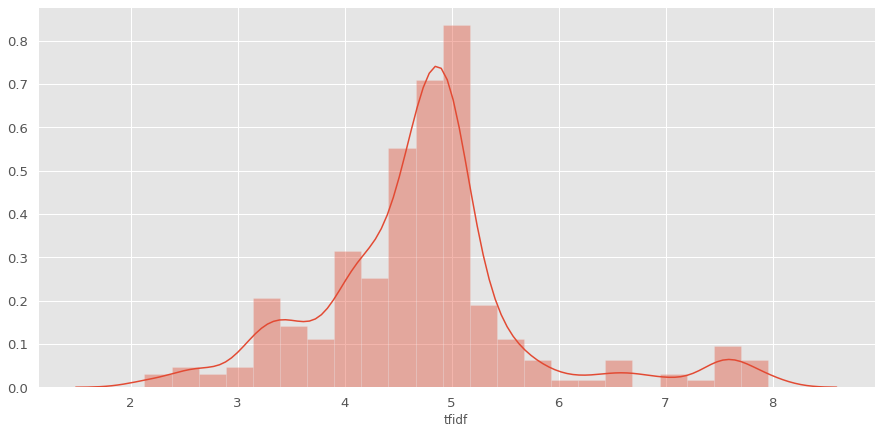

In [229]:
plt.figure(figsize=(15,7))
sns.distplot(tfidf4['tfidf'])

Given the high dimension of our tfidf matrix, we need to reduce their dimension using the Singular Value Decomposition (SVD) technique. And to visualize our vocabulary, we could next use t-SNE to reduce the dimension to 2. t-SNE is more suitable for dimensionality reduction to 2 or 3.

### Dimensionality Reduction using t-SNE

In [ ]:
n_comp=10
svd = TruncatedSVD(n_components=n_comp, random_state=42)
svd_tfidf = svd.fit_transform(tfidf1)

In [ ]:
tsne_model = TSNE(n_components=2, verbose=1, random_state=42, n_iter=500)
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

In [ ]:
tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])
plt.scatter(tfidf_df.x, tfidf_df.y, alpha=0.7)

**Observation:**
We can see there are multiple smaller clusters here, each cluster could be the type of tickets that we have in the dataset.

## Agglomerative Clustering


In [ ]:
incidents['Group id'] = incidents['Assignment group'].factorize()[0]
incidents.head()

In [ ]:
group_id_df = incidents[['Assignment group', 'Group id']].drop_duplicates().sort_values('Group id')

In [ ]:
group_to_id = dict(group_id_df.values)
id_to_group = dict(group_id_df[['Group id', 'Assignment group']].values)

### Get Embeddings from Glove

In [160]:
glove_file = "glove.6B.zip"
#Extract Glove embedding zip file
with ZipFile(glove_file, 'r') as z:
  z.extractall()

In [ ]:
EMBEDDING_FILE = './glove.6B.300d.txt'

embeddings = {}
for o in open(EMBEDDING_FILE):
    word = o.split(" ")[0]
    embd = o.split(" ")[1:]
    embd = np.asarray(embd, dtype='float32')
    embeddings[word] = embd

In [ ]:
def get_sentence_embedding(tokens, vector):
  if len(tokens)<1:
    return np.zeros(300)
  sentvec = [vector[word] if word in vector else np.zeros(300) for word in tokens]
  length = len(sentvec)
  sum = np.sum(sentvec, axis=0)
  avg = np.divide(sum,length)
  return(avg)

In [ ]:
incidents['embedding'] = incidents['tokens'].apply(lambda x: get_sentence_embedding(x, embeddings))

In [ ]:
incidents.head()

In [ ]:
inc_clus = pd.DataFrame(incidents['Assignment group'].unique(),columns=['Assignment group'])

In [ ]:
for i in incidents['Assignment group'].unique():
  inc_clus.loc[inc_clus['Assignment group']==i,'embedding'] = pd.Series([np.mean(incidents[incidents['Assignment group']==i]['embedding'])],
                                                                        index=inc_clus.loc[inc_clus['Assignment group']==i].index,dtype='object')
  inc_clus.loc[inc_clus['Assignment group']==i,'frequency'] = pd.Series(incidents[incidents['Assignment group']==i].shape[0],
                                                                        index=inc_clus.loc[inc_clus['Assignment group']==i].index,dtype='object')

In [ ]:
#Agglomerative Clustering
model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='average')
model.fit(inc_clus['embedding'].values.tolist())

In [ ]:
plt.figure(figsize=(30, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
Z = linkage(inc_clus['embedding'].values.tolist(), metric='euclidean', method='average')
dendrogram(Z, leaf_rotation=90, color_threshold=40, leaf_font_size=8)
plt.tight_layout()

**Observation:**

From the above graph, records for specific groups are largely different from most other groups which seem to be similar. The motive behind performing clustering is to counter the class imbalance in our data. When we choose to form clusters, it needs to satisfy the below condition:
* The clusters must restore some class balance in our data so that our classification model can predict precisely
* The clusters must not be a combination of large number of assignment groups each, if so then we will not be able to infer properly from the classification

Going by this logic, we go with 45 clusters

In [ ]:
model = AgglomerativeClustering(n_clusters=45, affinity='euclidean',  linkage='average')
model.fit(inc_clus['embedding'].values.tolist())

In [ ]:
inc_clus['class'] = model.labels_
inc_clus['class'].value_counts()

We can see that most of the clusters have only one group each. This is not an ideal scenario since then there are lot of labels to classify.

###Pseudo class setup

In [ ]:
for i in incidents['Assignment group'].unique():
  incidents.loc[incidents['Assignment group']==i,'class'] = inc_clus[inc_clus['Assignment group']==i]['class'].values[0]

In [ ]:
clus_arrngmt = pd.DataFrame([(i,inc_clus[inc_clus['class']==i]['Assignment group'].values) for i in inc_clus['class'].unique()],columns=['cluster id','cluster groups'])
clus_arrngmt.set_index('cluster id',inplace=True)
clus_arrngmt['ticket_counts'] = incidents['class'].value_counts()
clus_arrngmt['class_counts'] = inc_clus['class'].value_counts()
clus_arrngmt.reset_index(inplace=True)
clus_arrngmt.head()

In [ ]:
clus_arrngmt = clus_arrngmt.sort_values(by='ticket_counts',ascending=False).head(10)
clus_arrngmt.sum()

**Observation:**

We have tried to counter the challenges by filtering those clusters which are associated with more records. We have arrived at 10 clusters, the class balance has been improved slightly.

In [ ]:
clus_arrngmt

In [ ]:
clus_arrngmt['cluster id'].values

In [ ]:
incidents_clust = incidents[incidents['class'].isin(clus_arrngmt['cluster id'].values)]
incidents_clust.shape

In [ ]:
clus_arrngmt['cluster id'] = clus_arrngmt['cluster id'].map({0:0, 3:1, 1:2, 23:3, 8:4, 38:5, 18:6, 10:7, 39:8, 31:9})
incidents_clust['class'] = incidents_clust['class'].map({0:0, 3:1, 1:2, 23:3, 8:4, 38:5, 18:6, 10:7, 39:8, 31:9})

In [ ]:
incidents_clust['class'].value_counts()

Based on the above deductions, we will only focus on the 36 groups above clustered into 8 classes for building various supervised machine learning models. Other clusters/classes have very less number of records for our model to understand and predict.

## KMeans clustering

In [ ]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.90, min_df =25, max_features=10000, use_idf=True)
tfidf_matrix = tfidf_vectorizer.fit_transform(incidents['tokens'])
incidents['tfidf'] =  list(tfidf_vectorizer.fit_transform(incidents['tokens']).toarray())
tfidf_matrix_arr = tfidf_matrix.toarray()
tfidf_feature_names = tfidf_vectorizer.get_feature_names()
doc_term_matrix_tfidf = pd.DataFrame(tfidf_matrix.todense(), columns=list(tfidf_feature_names))
doc_term_matrix_tfidf

In [ ]:
incidents.head()

In [ ]:
tfidf_matrix

In [ ]:
#save the sparse matrix
from scipy.sparse import csr_matrix

def save_sparse_csr(filename,array):
    np.savez(filename,data = array.data ,indices=array.indices,
             indptr =array.indptr, shape=array.shape )

def load_sparse_csr(filename):
    loader = np.load(filename)
    return csr_matrix((loader['data'], loader['indices'], loader['indptr']),
                         shape = loader['shape'])

save_sparse_csr(project_path + 'tf_idf.npz', tfidf_matrix)

In [ ]:
len(tfidf_matrix.todense())

In [ ]:
#Find optimal clusters

from sklearn.cluster import MiniBatchKMeans

def find_optimal_clusters(data, max_k):
    iters = range(2, max_k+1, 2)
    
    sse = []
    for k in iters:
        sse.append(MiniBatchKMeans(n_clusters=k, init_size=1024, batch_size=2048, random_state=20).fit(data).inertia_)
        print('Fit {} clusters'.format(k))
        
    f, ax = plt.subplots(1, 1)
    ax.plot(iters, sse, marker='o')
    ax.set_xlabel('Cluster Centers')
    ax.set_xticks(iters)
    ax.set_xticklabels(iters)
    ax.set_ylabel('SSE')
    ax.set_title('SSE by Cluster Center Plot')
    
find_optimal_clusters(tfidf_matrix, 20)

In [ ]:
#Get the clusters

clusters = MiniBatchKMeans(n_clusters=14, init_size=1024, batch_size=2048, random_state=20).fit_predict(tfidf_matrix)

In [ ]:
#Get the top key words from the clusters

def get_top_keywords(data, clusters, labels, n_terms):
    df = pd.DataFrame(data.todense()).groupby(clusters).mean()
    
    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(','.join([labels[t] for t in np.argsort(r)[-n_terms:]]))
            
get_top_keywords(tfidf_matrix, clusters, tfidf_vectorizer.get_feature_names(), 10)

In [ ]:
# get clusters from k-means
from sklearn.cluster import KMeans

k = 14
km = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=5,
                verbose=1)
%time km.fit(tfidf_matrix)

clusters = km.labels_.tolist()
clusters = pd.DataFrame(clusters, columns=['Clusters'])
incidents_tfidf = pd.concat([incidents, clusters], axis=1)


In [ ]:
#Plot the clusters
import matplotlib.pyplot as plt
%matplotlib inline

plt.hist(km.labels_, bins=k)
plt.show()

In [ ]:
group_id_tfidf = incidents_tfidf[['Assignment group', 'Clusters']].drop_duplicates().sort_values('Clusters')

In [ ]:
group_id_tfidf.dropna(inplace=True)

In [ ]:
for i in incidents['Assignment group'].unique():
  incidents.loc[incidents['Assignment group']==i,'Clusters'] = group_id_tfidf[group_id_tfidf['Assignment group']==i]['Clusters'].values[0]

In [ ]:
Kclus_arrngmt = pd.DataFrame([(i,incidents[incidents['Clusters']==i]['Assignment group'].unique()) for i in group_id_tfidf['Clusters'].unique()],columns=['cluster id','cluster groups'])
Kclus_arrngmt.set_index('cluster id',inplace=True)
Kclus_arrngmt['ticket_counts'] = incidents['Clusters'].value_counts()
Kclus_arrngmt.reset_index(inplace=True)
Kclus_arrngmt.dropna(inplace=True)
Kclus_arrngmt.head(8)

In [ ]:
incidents_tfidf.dropna(inplace=True)

In [ ]:
incidents_tfidf.head()

In [246]:
incidents_tfidf.shape

(8316, 11)

In [249]:
incidents_tfidf['Clusters'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

In [216]:
incidents_tfidf['Clusters'] = incidents_tfidf['Clusters'].map({4:0,7:1,9:2,8:3,1:4,10:5,2:6,12:7,5:8,6:9,0:10,11:11,13:12,3:13})

## Model Building

Let's proceed towards trying different model architectures mentioned below to classify the problem and validate which one is outperforming.

* Multinomial Naive Bayes
* K Nearest neighbor
* Support Vector Machine
* Decision Tree
* Random Forest
* Logistic Regression
* SGD Classifier

Let's write some generic methods for utilities and to plot evaluation metrics.

In [108]:
#Create a dataframe to capture the accuracy and f1-score of various models   
log_cols=["Classifier", "Precision", "Recall", "Accuracy", "f1_score", "Latency"]
log = pd.DataFrame(columns=log_cols)


##### Create a function for various classification models

In [109]:
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method that plots the Precision-Recall curve
def plot_prec_recall_vs_thresh(precisions, recalls, thresholds):
    plt.figure(figsize=(10,5))
    plt.plot(thresholds, precisions[:-1], 'b--', label='precision')
    plt.plot(thresholds, recalls[:-1], 'g--', label = 'recall')
    plt.xlabel('Threshold')
    plt.legend()

# A method to train and test the model
def run_classification(estimator, X_train, X_test, y_train, y_test, clfname, arch_name=None, pipelineRequired=False, isDeepModel=False):
    global log
    timer.start()
    # train the model
    clf = estimator
    modelname = clfname
   
    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)

    try:
      classes = y_train.unique().tolist()
    except:
      classes = np.unique(y_train).tolist()
    print('Confusion matrix:\n')
    hmap = sns.heatmap(pd.DataFrame(confusion_matrix(y_test, y_pred), index=classes, columns=classes), annot=True, fmt="d")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))

    print(timer.stop(), 'to run the model')
    time_taken=timer.stop()
    log_entry = pd.DataFrame([[modelname,precision_score(y_pred, y_test,average='weighted'),recall_score(y_pred, y_test,average='weighted'),
                               accuracy_score(y_pred, y_test),f1_score(y_pred, y_test,average='weighted'),time_taken]], columns=log_cols)
    log = log.append(log_entry)


### Classification Models on Bag of Words

In [110]:
vectorizer, vocab, train_data_features, tfidf_features, tfidf  =  create_bag_of_words(incidents_clust['Description'])

In [111]:
X = tfidf_features
y = incidents_clust['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

**Multinomial Naive Bayes**

Estimator: MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)
Training accuracy: 79.86%
Testing accuracy: 77.99%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.75      0.98      0.85       940
           1       0.92      0.87      0.90       277
           2       0.76      0.21      0.33       210
           3       0.95      0.65      0.77        57
           4       0.00      0.00      0.00        36
           5       0.00      0.00      0.00        27
           6       0.00      0.00      0.00        16
           7       0.00      0.00      0.00        12
           8       1.00      0.14      0.25        14
           9       0.00      0.00      0.00        15

    accuracy                           0.78      1604
   macro avg       0.44      0.29      0.31      1604
weighted avg       0.74      0.78      0.73      1604

Time taken: 0.689486s to run the model


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


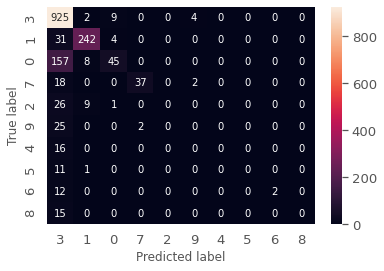

In [112]:
run_classification(MultinomialNB(), X_train, X_test, y_train, y_test,"MultinomialNB-BOW & Hierarchical")

**Linear SVC**

Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1, loss='hinge',
                                        max_iter=1000, multi_class='ovr',
                                        penalty='l2', random_state=42,
                                        tol=0.0001, verbose=0),
                    n_jobs=None)
Training accuracy: 94.12%
Testing accuracy: 79.80%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.86      0.85      0.86       940
           1       0.91      0.91      0.91       277
           2       0.50      0.58      0.54       210
           3       0.85      0.82      0.84        57
           4       0.88      0.42      0.57        36
           5       0.54      0.56      0.55        27
           6       0.90      0.56      0.69        16
  

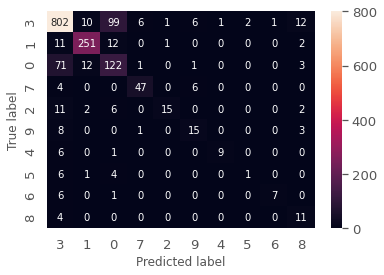

In [113]:
run_classification(OneVsRestClassifier(LinearSVC(loss='hinge',random_state=42,class_weight='balanced')), X_train, X_test, y_train, y_test, "LinearSVC-BOW & Hierarchical")

**SGD Classifier**

Estimator: SGDClassifier(alpha=0.001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=100, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=None,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 84.66%
Testing accuracy: 72.94%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.87      0.77      0.82       940
           1       0.93      0.90      0.91       277
           2       0.55      0.32      0.41       210
           3       0.69      0.81      0.74        57
           4       0.40      0.58      0.47        36
           5       0.25      0.67      0.36        27
           6       0.33      0.81      0.46        16
           7       0.12      0.83    

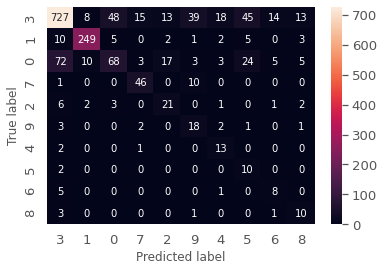

In [114]:
run_classification(SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None,class_weight='balanced'), 
                   X_train, X_test, y_train, y_test, "SGDClassifier-BOW & Hierarchical")

**Logistic Regression**

Estimator: LogisticRegression(C=100000.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=1, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 98.72%
Testing accuracy: 77.93%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.84      0.86      0.85       940
           1       0.88      0.88      0.88       277
           2       0.50      0.48      0.49       210
           3       0.92      0.81      0.86        57
           4       0.62      0.36      0.46        36
           5       0.57      0.48      0.52        27
           6       0.89      0.50      0.64        16
           7       0.17      0.25      0.20        12
           8       0.60      0.43      0.50        14
           9       0.

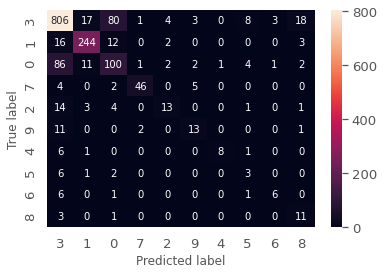

In [115]:
run_classification(LogisticRegression(n_jobs=1, C=1e5,class_weight='balanced'), X_train, X_test, y_train, y_test, "LogisticRegression-BOW & Hierarchical")

**Random Forest Classifier**

In [116]:
le = LabelEncoder()
tokenizer = Tokenizer(num_words= 10000)
tokenizer.fit_on_texts(incidents_clust['Description'])
maxlen = 300

In [117]:
X_M1 = tokenizer.texts_to_sequences(incidents_clust['Description'])
X_M1 = pad_sequences(X_M1, maxlen = maxlen)
y_M1 = np.asarray(incidents_clust['class'])

In [118]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_M1, y_M1, test_size = 0.3)

Estimator: RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=0, verbose=0, warm_start=False)
Training accuracy: 96.35%
Testing accuracy: 73.23%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.75      0.90      0.82      1458
           1       0.94      0.82      0.87       374
           2       0.30      0.22      0.25       316
           3       0.64      0.62      0.63        79
           4       0.77      0.19      0.30        53
           5       0.12      0.02      0.04        41
           6       0.00  

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


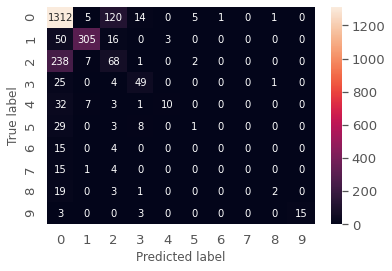

In [119]:
run_classification(RandomForestClassifier(max_depth=15, random_state=0, class_weight="balanced"), X_train_2, X_test_2, y_train_2, y_test_2, "RandomForest-BOW & Hierarchical")

**Decision Tree Classifier**

Estimator: DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Training accuracy: 99.25%
Testing accuracy: 67.17%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.79      0.77      0.78      1458
           1       0.78      0.84      0.81       374
           2       0.30      0.28      0.29       316
           3       0.56      0.67      0.61        79
           4       0.24      0.19      0.21        53
           5       0.18      0.17      0.18        41
           6       0.00      0.00      0.00        19
           7       0.03      0.05      0.04        20
   

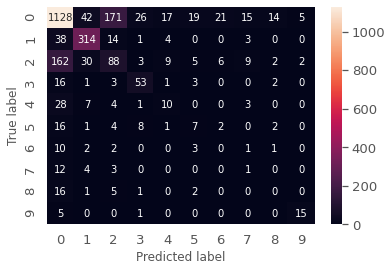

In [120]:
run_classification(DecisionTreeClassifier(), X_train_2, X_test_2, y_train_2, y_test_2, "DecisionTree-BOW & Hierarchical")

**K-Nearest Neighbours**

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')
Training accuracy: 99.25%
Testing accuracy: 71.57%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.74      0.89      0.81      1458
           1       0.79      0.81      0.80       374
           2       0.33      0.16      0.22       316
           3       0.61      0.58      0.60        79
           4       0.62      0.19      0.29        53
           5       0.40      0.15      0.21        41
           6       0.00      0.00      0.00        19
           7       0.00      0.00      0.00        20
           8       0.00      0.00      0.00        25
           9       0.94      0.71      0.81        21

    accuracy                           0.72      2406
   macro avg       0.44      0.35      0.37      2406
wei

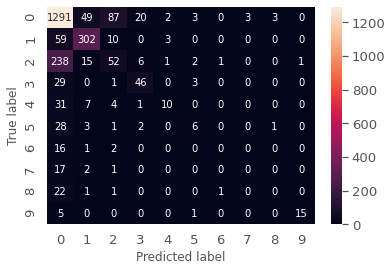

In [121]:
run_classification(KNeighborsClassifier(n_neighbors= 5 , weights = 'distance'), X_train_2, X_test_2, y_train_2, y_test_2, "KNN-BOW & Hierarchical")

In [122]:
log.set_index(["Classifier"]).sort_values(by=['f1_score'])

,Precision,Recall,Accuracy,f1_score,Latency
Classifier,,,,,
DecisionTree-BOW & Hierarchical,0.673921,0.671654,0.671654,0.672259,Time taken: 0.376561s
SGDClassifier-BOW & Hierarchical,0.748266,0.729426,0.729426,0.710577,Time taken: 114.048991s
KNN-BOW & Hierarchical,0.802361,0.715711,0.715711,0.751543,Time taken: 12.362868s
RandomForest-BOW & Hierarchical,0.805844,0.732336,0.732336,0.761768,Time taken: 0.293006s
LogisticRegression-BOW & Hierarchical,0.785735,0.779302,0.779302,0.779377,Time taken: 2.378956s
LinearSVC-BOW & Hierarchical,0.802436,0.798005,0.798005,0.796637,Time taken: 3.252946s
MultinomialNB-BOW & Hierarchical,0.924823,0.779925,0.779925,0.833164,Time taken: 0.689950s


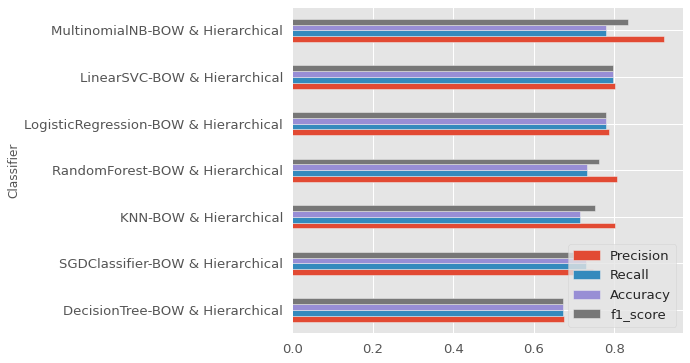

In [123]:
log.set_index(["Classifier"]).sort_values(by=['f1_score']).plot(kind='barh',figsize=[7,6])

**Observation:** 
* Multinomial NB and Linear SVC have better performance but still are overfitted since the training accuracy is around 90% for most of the models and the testing accuracies, f1-scores are plotted above 
* We would be fine tuning the models and reduce the overfitting in next iteration.

### Data balancing using cosine distance comparison and SMOTE techniques

In [67]:
inc_grp0 = incidents_clust[incidents_clust['Assignment group']=='GRP_0']
incidents_nongrp0 = incidents_clust[incidents_clust['Assignment group']!='GRP_0']
inc_grp0.reset_index(drop=True,inplace=True)

In [68]:
print(inc_grp0.shape)
print(incidents_nongrp0.shape)

(3926, 9)
(4093, 9)


In [69]:
for i in range(100000):  #randomly choosing 100k iterations of comparison
  a=random.randint(0,inc_grp0.shape[0]-1)
  b=random.randint(0,inc_grp0.shape[0]-1)
  if (a!=b):
    if ((1-scipy.spatial.distance.cosine(inc_grp0.iloc[a]['embedding'],inc_grp0.iloc[b]['embedding'])) > 0.97):
      inc_grp0.drop(b, inplace=True)
      inc_grp0.reset_index(drop=True, inplace=True)

incidents_cosine = pd.concat([inc_grp0, incidents_nongrp0])
print(incidents_cosine.shape)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.6/dist-packages/scipy/spatial/distance.py:720: RuntimeWarning: invalid value encountered in double_scalars
  dist = 1.0 - uv / np.sqrt(uu * vv)


(4280, 9)


In [70]:
#with open('incidents_cosine.pickle', 'wb') as output:
#    pickle.dump(incidents_cosine, output)

#with open('incidents_cosine.pickle', 'rb') as data:
#    incidents_cosine = pickle.load(data)

In [71]:
X1 = incidents_cosine['embedding'].values.tolist()
y1 = incidents_cosine['class']
X1 = np.array(X1)
y1 = np.array(y1)

In [72]:
np.unique(y1)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [73]:
oversample = SMOTE(k_neighbors=10)
X1, y1 = oversample.fit_resample(X1, y1)

undersample = RandomUnderSampler(random_state=42)
incidents_smote_data, incidents_smote_label = undersample.fit_resample(X1, y1)

In [74]:
counter = Counter(incidents_smote_label)
print(counter)

Counter({0: 1224, 1: 1224, 2: 1224, 3: 1224, 4: 1224, 5: 1224, 6: 1224, 7: 1224, 8: 1224, 9: 1224})


In [8]:
#with open('incidents_smote_data.pickle', 'wb') as output:
#    pickle.dump(incidents_smote_data, output)
    
#with open('incidents_smote_label.pickle', 'wb') as output:
#    pickle.dump(incidents_smote_label, output)
    
#with open('incidents_smote_data.pickle', 'rb') as data:
#    incidents_smote_data = pickle.load(data)

#with open('incidents_smote_label.pickle', 'rb') as data:
#    incidents_smote_label = pickle.load(data)

#### Create training and test datasets

In [124]:
X_train, X_test, y_train, y_test = train_test_split(incidents_smote_data, incidents_smote_label, test_size=0.15, random_state=10)

### Classification Models on Glove embedding clusters

**Linear SVC**

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1, loss='hinge',
                                        max_iter=1000, multi_class='ovr',
                                        penalty='l2', random_state=42,
                                        tol=0.0001, verbose=0),
                    n_jobs=None)
Training accuracy: 60.77%
Testing accuracy: 58.99%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.16      0.16      0.16       185
           1       0.73      0.76      0.75       186
           2       0.40      0.40      0.40       184
           3       0.78      0.71      0.75       189
           4       0.53      0.33      0.40       187
           5       0.56      0.55      0.55       185
           6       0.53      0.71      0.61       205
  

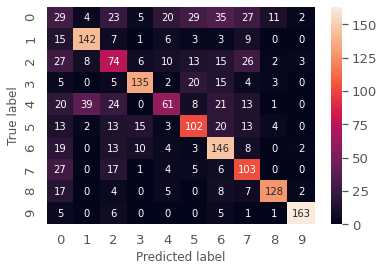

In [125]:
run_classification(OneVsRestClassifier(LinearSVC(loss='hinge',random_state=42,class_weight='balanced')), X_train, X_test, y_train, y_test, "LinearSVC-Glove & Hierarchical")

**SGD Classifier**

Estimator: SGDClassifier(alpha=0.001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=100, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=None,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 54.83%
Testing accuracy: 52.67%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.15      0.23      0.18       185
           1       0.49      0.68      0.57       186
           2       0.71      0.07      0.12       184
           3       0.60      0.82      0.69       189
           4       0.10      0.01      0.01       187
           5       0.53      0.54      0.53       185
           6       0.52      0.67      0.58       205
           7       0.49      0.64    

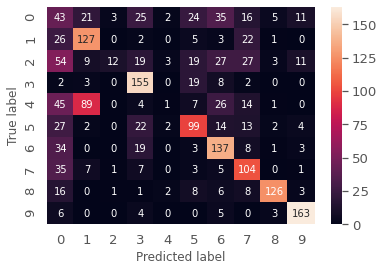

In [126]:
run_classification(SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None,class_weight='balanced'), 
                   X_train, X_test, y_train, y_test, "SGDClassifier-Glove & Hierarchical")

**Logistic Regression**

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Estimator: LogisticRegression(C=100000.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=1, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 63.58%
Testing accuracy: 61.06%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.21      0.18      0.19       185
           1       0.70      0.76      0.73       186
           2       0.40      0.36      0.38       184
           3       0.73      0.79      0.76       189
           4       0.61      0.28      0.39       187
           5       0.59      0.63      0.61       185
           6       0.59      0.70      0.64       205
           7       0.49      0.72      0.58       163
           8       0.87      0.78      0.82       171
           9       0.

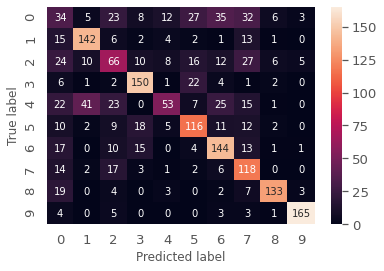

In [127]:
run_classification(LogisticRegression(n_jobs=1, C=1e5,class_weight='balanced'), X_train, X_test, y_train, y_test, "LogisticRegression-Glove & Hierarchical")

**Random Forest Classifier**

Estimator: RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=0, verbose=0, warm_start=False)
Training accuracy: 95.59%
Testing accuracy: 81.37%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.58      0.44      0.50       185
           1       0.77      0.80      0.79       186
           2       0.56      0.52      0.54       184
           3       0.85      0.92      0.88       189
           4       0.87      0.71      0.78       187
           5       0.83      0.91      0.87       185
           6       0.86  

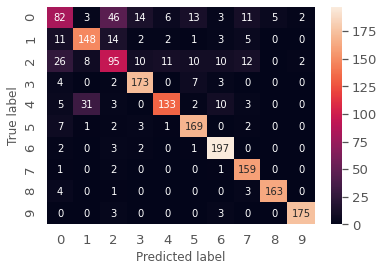

In [128]:
run_classification(RandomForestClassifier(max_depth=15, random_state=0, class_weight="balanced"), X_train, X_test, y_train, y_test, "RandomForest-Glove & Hierarchical")

**Decision Tree Classifier**

Estimator: DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Training accuracy: 98.22%
Testing accuracy: 74.67%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.40      0.38      0.39       185
           1       0.67      0.81      0.73       186
           2       0.44      0.37      0.40       184
           3       0.81      0.85      0.83       189
           4       0.77      0.66      0.71       187
           5       0.78      0.81      0.79       185
           6       0.85      0.87      0.86       205
           7       0.85      0.86      0.85       163
   

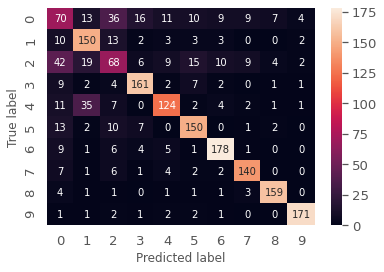

In [129]:
run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test, "DecisionTree-Glove & Hierarchical")

**K-Nearest Neighbours**

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')
Training accuracy: 98.22%
Testing accuracy: 84.31%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.79      0.34      0.48       185
           1       0.77      0.82      0.79       186
           2       0.76      0.51      0.61       184
           3       0.93      0.99      0.96       189
           4       0.77      0.81      0.79       187
           5       0.82      0.98      0.89       185
           6       0.86      1.00      0.93       205
           7       0.81      1.00      0.89       163
           8       0.92      0.99      0.95       171
           9       0.94      1.00      0.97       181

    accuracy                           0.84      1836
   macro avg       0.84      0.84      0.83      1836
wei

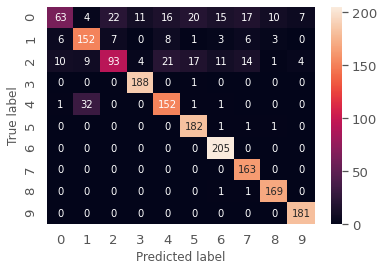

In [130]:
run_classification(KNeighborsClassifier(n_neighbors= 5 , weights = 'distance'), X_train, X_test, y_train, y_test, "KNN-Glove & Hierarchical")

In [131]:
log.set_index(["Classifier"]).sort_values(by=['f1_score'])

,Precision,Recall,Accuracy,f1_score,Latency
Classifier,,,,,
SGDClassifier-Glove & Hierarchical,0.627106,0.526688,0.526688,0.564908,Time taken: 5.977169s
LinearSVC-Glove & Hierarchical,0.604059,0.589869,0.589869,0.591923,Time taken: 9.210981s
LogisticRegression-Glove & Hierarchical,0.643272,0.610566,0.610566,0.619769,Time taken: 90.578665s
DecisionTree-BOW & Hierarchical,0.673921,0.671654,0.671654,0.672259,Time taken: 0.376561s
SGDClassifier-BOW & Hierarchical,0.748266,0.729426,0.729426,0.710577,Time taken: 114.048991s
DecisionTree-Glove & Hierarchical,0.758906,0.746732,0.746732,0.751236,Time taken: 5.299247s
KNN-BOW & Hierarchical,0.802361,0.715711,0.715711,0.751543,Time taken: 12.362868s
RandomForest-BOW & Hierarchical,0.805844,0.732336,0.732336,0.761768,Time taken: 0.293006s
LogisticRegression-BOW & Hierarchical,0.785735,0.779302,0.779302,0.779377,Time taken: 2.378956s


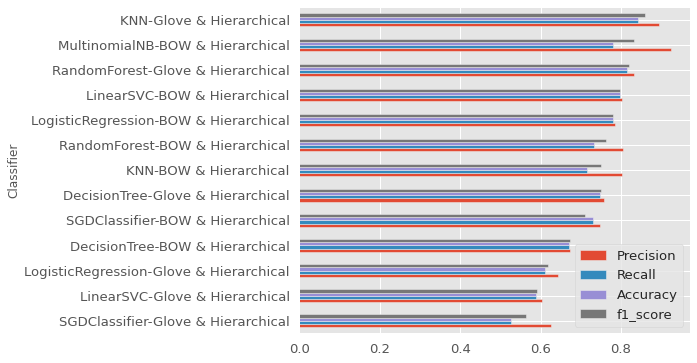

In [132]:
log.set_index(["Classifier"]).sort_values(by=['f1_score']).plot(kind='barh',figsize=[7,6])

**Observation:** 
* Random Forest and KNN have better performance but still are overfitted since the training accuracy is around 90% for most of the models and the f1-scores are plotted above 
* We would be fine tuning the models and reduce the overfitting in next iteration.


### Classification Models using KMeans clusters

In [250]:
X = incidents_tfidf['tfidf'].values.tolist()
y = incidents_tfidf['Clusters']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=10)

In [251]:
y_train.value_counts()

3     2834
1      867
11     763
2      501
7      438
5      357
8      224
4      220
0      204
10     155
13     149
6      128
12     123
9      105
Name: Clusters, dtype: int64

**Multinomial Naive Bayes**

In [ ]:
run_classification(MultinomialNB(), X_train, X_test, y_train, y_test,"TFIDF & K-Means", "MultinomialNB")

Estimator: MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)
Training accuracy: 68.26%
Testing accuracy: 66.21%
Confusion matrix:
 [[732   0   0   0   0]
 [ 58   0   0   0   1]
 [137   0   0   0   0]
 [105   1   0   0   0]
 [ 72   0   0   0   1]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.66      1.00      0.80       732
         1.0       0.00      0.00      0.00        59
         2.0       0.00      0.00      0.00       137
         3.0       0.00      0.00      0.00       106
         4.0       0.50      0.01      0.03        73

    accuracy                           0.66      1107
   macro avg       0.23      0.20      0.16      1107
weighted avg       0.47      0.66      0.53      1107

Time taken: 0.102224s to run the model


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


**LinearSVC**

In [ ]:
run_classification(OneVsRestClassifier(LinearSVC()), X_train, X_test, y_train, y_test, "LinearSVC-TFIDF & K-Means")

Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight=None, dual=True,
                                        fit_intercept=True, intercept_scaling=1,
                                        loss='squared_hinge', max_iter=1000,
                                        multi_class='ovr', penalty='l2',
                                        random_state=None, tol=0.0001,
                                        verbose=0),
                    n_jobs=None)
Training accuracy: 73.73%
Testing accuracy: 72.04%
Confusion matrix:
 [[  2   0 153   0   0]
 [  0   0  52   0   0]
 [  1   0 896   1   0]
 [  0   0  94   1   0]
 [  0   0  48   0   0]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.67      0.01      0.03       155
         1.0       0.00      0.00      0.00        52
         2.0       0.72      1.00      0.84       898
         3.0       0.50      0.01      0.02        95
         4.0       0.00      0.00      0.00 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


**SGD Classifier**

In [ ]:
run_classification(SGDClassifier(), X_train, X_test, y_train, y_test, "SGDClassifier-TFIDF & K-Means")

Estimator: SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 73.53%
Testing accuracy: 71.96%
Confusion matrix:
 [[  0   0 155   0   0]
 [  0   0  52   0   0]
 [  0   0 898   0   0]
 [  0   0  95   0   0]
 [  0   0  48   0   0]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       155
         1.0       0.00      0.00      0.00        52
         2.0       0.72      1.00      0.84       898
         3.0       0.00      0.00      0.00        95
         4.0       0.00      0.00      0.00        48

    accuracy                 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


**Logistic Regression**

In [ ]:
run_classification(LogisticRegression(), X_train, X_test, y_train, y_test, "LogisticRegression-TFIDF & K-Means")

Estimator: LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 73.53%
Testing accuracy: 71.96%
Confusion matrix:
 [[  0   0 155   0   0]
 [  0   0  52   0   0]
 [  0   0 898   0   0]
 [  0   0  95   0   0]
 [  0   0  48   0   0]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       155
         1.0       0.00      0.00      0.00        52
         2.0       0.72      1.00      0.84       898
         3.0       0.00      0.00      0.00        95
         4.0       0.00      0.00      0.00        48

    accuracy                           0.72      1248
   macro avg       0.14      0.20      0.17      1248
weighted avg       0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


**Random Forest Classifier**

In [ ]:
le = LabelEncoder()
tokenizer = Tokenizer(num_words= 10000)
tokenizer.fit_on_texts(incidents_tfidf['tokens'])
maxlen = 720

X_M1 = tokenizer.texts_to_sequences(incidents_clust['tokens'])
X_M1 = pad_sequences(X_M1, maxlen = maxlen)
y_M1 = np.asarray(incidents_clust['class'])

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_M1, y_M1, test_size = 0.3)

run_classification(RandomForestClassifier(), X_train, X_test, y_train, y_test, "RandomForest-TFIDF & K-Means")

Estimator: RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Training accuracy: 89.15%
Testing accuracy: 69.31%
Confusion matrix:
 [[ 10   1 140   3   1]
 [  1   0  51   0   0]
 [ 29   5 850  11   3]
 [  3   2  85   3   2]
 [  1   1  42   2   2]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.23      0.06      0.10       155
         1.0       0.00      0.00      0.00        52
         2.0       0.73      0.95      0.82       898
         3.0       0.16      0.03      0.05        95
         4.0      

**Decision Tree Classifier**

In [ ]:
run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test, "DecisionTree-TFIDF & K-Means")

Estimator: DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Training accuracy: 91.19%
Testing accuracy: 62.66%
Confusion matrix:
 [[ 20   5 125   3   2]
 [  2   2  43   3   2]
 [ 73  23 753  36  13]
 [  5   3  76   5   6]
 [  2   0  42   2   2]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.20      0.13      0.16       155
         1.0       0.06      0.04      0.05        52
         2.0       0.72      0.84      0.78       898
         3.0       0.10      0.05      0.07        95
         4.0       0.08      0.04      0.05        48

    accuracy                           0.63     

**K-Nearest Neighbours**

In [ ]:
run_classification(KNeighborsClassifier(), X_train, X_test, y_train, y_test, "KNN-TFIDF & K-Means")

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')
Training accuracy: 73.73%
Testing accuracy: 68.27%
Confusion matrix:
 [[ 14   0 139   2   0]
 [  6   1  45   0   0]
 [ 49   6 837   6   0]
 [  8   0  87   0   0]
 [  2   0  46   0   0]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.18      0.09      0.12       155
         1.0       0.14      0.02      0.03        52
         2.0       0.73      0.93      0.82       898
         3.0       0.00      0.00      0.00        95
         4.0       0.00      0.00      0.00        48

    accuracy                           0.68      1248
   macro avg       0.21      0.21      0.19      1248
weighted avg       0.55      0.68      0.60      1248

Time taken: 61.483382s to run the model


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


In [ ]:
log.set_index(["Classifier"]).sort_values(by=['f1_score', 'Latency'])

,Precision,Recall,Accuracy,f1_score,Latency
Classifier,,,,,
SGDClassifier-Glove & Hierarchical,0.623524,0.521786,0.521786,0.557378,Time taken: 5.630546s
LinearSVC-Glove & Hierarchical,0.611347,0.592048,0.592048,0.593827,Time taken: 9.335849s
LogisticRegression-Glove & Hierarchical,0.650761,0.612745,0.612745,0.622896,Time taken: 91.807559s
DecisionTree-TFIDF & K-Means,0.712567,0.626603,0.626603,0.665075,Time taken: 5.131654s
DecisionTree-BOW & Hierarchical,0.666088,0.667914,0.667914,0.666404,Time taken: 0.248980s
SGDClassifier-BOW & Hierarchical,0.731199,0.708853,0.708853,0.672385,Time taken: 107.211911s
KNN-BOW & Hierarchical,0.790791,0.705320,0.705320,0.741200,Time taken: 11.762786s
DecisionTree-Glove & Hierarchical,0.747779,0.737473,0.737473,0.741373,Time taken: 4.679496s
KNN-TFIDF & K-Means,0.867693,0.682692,0.682692,0.762108,Time taken: 61.483681s


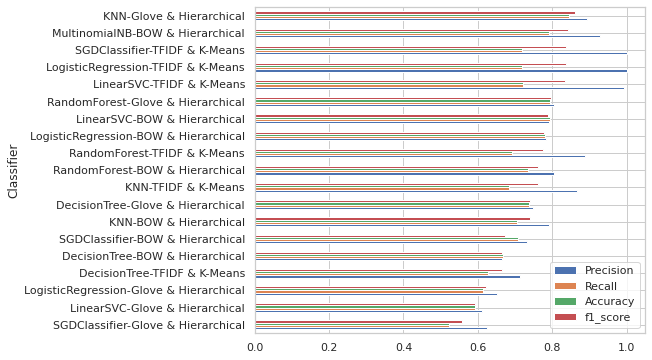

In [ ]:
log.set_index(["Classifier"]).sort_values(by=['f1_score','Latency']).plot(kind='barh',figsize=[7,6])

Observation:

* SGD Classifier and Logistic Regression models are performing better but fade in comparison to kNN glove model.
* As a next step, we will fine tune the GLOVE models and reduce the overfitting.

## Hyperparameter Tuning

### Determining the best hyperparameters using GridSearchCV

**Linear SVC**

In [ ]:
# define model and parameters
model = LinearSVC()
penalty = ['l1', 'l2']
loss = ['hinge', 'squared_hinge']
class_weight = ['dict', 'balanced']
C = [50, 10, 1.0]

# define grid search
grid = dict(penalty=penalty,loss=loss,class_weight=class_weight,C=C)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.624129 using {'C': 10, 'class_weight': 'balanced', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'hinge', 'penalty': 'l1'}
0.534341 (0.029023) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'squared_hinge', 'penalty': 'l1'}
0.497930 (0.067363) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 10, 'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l1'}
0.000

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


**SGD Classifier**

In [ ]:
# define model and parameters
model = SGDClassifier()
penalty = ['l1', 'l2','elasticnet']
loss = ['hinge', 'squared_hinge', 'modified_huber']
class_weight = ['dict', 'balanced']

# define grid search
grid = dict(penalty=penalty,loss=loss,class_weight=class_weight)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
f1_samples = make_scorer(f1_score, average='macro')
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.546476 using {'class_weight': 'balanced', 'loss': 'modified_huber', 'penalty': 'l1'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'elasticnet'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'elasticnet'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'modified_huber', 'penalty': 'l1'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'modified_huber', 'penalty': 'l2'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'modified_huber', 'penalty': 'elasticnet'}
0.525319 (0.022962) with: {'class_weight': 'balanced', 'loss': 'hin

**Logistic Regression**

In [ ]:
# define models and parameters
model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.608630 using {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.608630 (0.008424) with: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.606478 (0.008229) with: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.608490 (0.008459) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.605984 (0.009401) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.604815 (0.009192) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.605127 (0.008949) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.593342 (0.009106) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
0.593383 (0.009132) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}
0.591753 (0.009267) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.559051 (0.010322) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.559053 (0.010323) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.558608 (0.010251) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
0.473506 (0.008338) wit

**Random Forest**

In [ ]:
# define models and parameters
model = RandomForestClassifier()
n_estimators = [10, 100, 1000]
max_features = ['sqrt', 'log2']
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Best: 0.874214 using {'max_features': 'sqrt', 'n_estimators': 1000}
0.831405 (0.006861) with: {'max_features': 'sqrt', 'n_estimators': 10}
0.868379 (0.006285) with: {'max_features': 'sqrt', 'n_estimators': 100}
0.874214 (0.008818) with: {'max_features': 'sqrt', 'n_estimators': 1000}
0.824658 (0.006603) with: {'max_features': 'log2', 'n_estimators': 10}
0.867520 (0.008578) with: {'max_features': 'log2', 'n_estimators': 100}
0.873054 (0.008340) with: {'max_features': 'log2', 'n_estimators': 1000}


**Decision Tree**

In [ ]:
# define models and parameters
model = DecisionTreeClassifier()
criterion = ['gini', 'entropy']
max_features = ['auto', 'sqrt', 'log2']
class_weight = ['dict', 'balanced']

# define grid search
grid = dict(criterion=criterion,max_features=max_features,class_weight=class_weight)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.728382 using {'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'auto'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'gini', 'max_features': 'auto'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'gini', 'max_features': 'sqrt'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'gini', 'max_features': 'log2'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'entropy', 'max_features': 'auto'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'entropy', 'max_features': 'sqrt'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'entropy', 'max_features': 'log2'}
0.723427 (0.008054) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'auto'}
0.723817 (0.008037) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'sqrt'}
0.716398 (0.005669) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'log2'}
0.728382 (0.00867

**KNN**

In [ ]:
# define models and parameters
model = KNeighborsClassifier()
n_neighbors = range(1, 21, 5)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
# define grid search
grid = dict(n_neighbors=n_neighbors,weights=weights,metric=metric)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.837683 using {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'uniform'}
0.837617 (0.016573) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
0.837617 (0.016573) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'distance'}
0.799476 (0.007984) with: {'metric': 'euclidean', 'n_neighbors': 6, 'weights': 'uniform'}
0.816432 (0.008082) with: {'metric': 'euclidean', 'n_neighbors': 6, 'weights': 'distance'}
0.768075 (0.007300) with: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'uniform'}
0.792143 (0.008678) with: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'distance'}
0.739815 (0.007281) with: {'metric': 'euclidean', 'n_neighbors': 16, 'weights': 'uniform'}
0.776104 (0.007598) with: {'metric': 'euclidean', 'n_neighbors': 16, 'weights': 'distance'}
0.837683 (0.017027) with: {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'uniform'}
0.837683 (0.017027) with: {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'distance'}
0.8002

### Fit the models with tuned hyperparameters

In [253]:
#Create a dataframe to capture the accuracy and f1-score of various models   
log_cols=["Classifier", "Precision", "Recall", "Accuracy", "f1_score", "Latency"]
log_hyper = pd.DataFrame(columns=log_cols)

In [254]:
X_train, X_test, y_train, y_test = train_test_split(incidents_smote_data, incidents_smote_label, test_size=0.15, random_state=10)

##### Create a function for various classification models

In [255]:
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method that plots the Precision-Recall curve
def plot_prec_recall_vs_thresh(precisions, recalls, thresholds):
    plt.figure(figsize=(10,5))
    plt.plot(thresholds, precisions[:-1], 'b--', label='precision')
    plt.plot(thresholds, recalls[:-1], 'g--', label = 'recall')
    plt.xlabel('Threshold')
    plt.legend()

# A method to train and test the model
def run_classification_hyper(estimator, X_train, X_test, y_train, y_test, clfname, arch_name=None, pipelineRequired=False, isDeepModel=False):
    global log_hyper
    timer.start()
    # train the model
    clf = estimator
    modelname = clfname
   
    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)

    try:
      classes = y_train.unique().tolist()
    except:
      classes = np.unique(y_train).tolist()
    print('Confusion matrix:\n')
    hmap = sns.heatmap(pd.DataFrame(confusion_matrix(y_test, y_pred), index=classes, columns=classes), annot=True, fmt="d")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))

    print(timer.stop(), 'to run the model')
    time_taken=timer.stop()
    log_entry = pd.DataFrame([[modelname,precision_score(y_pred, y_test,average='weighted'),recall_score(y_pred, y_test,average='weighted'),
                               accuracy_score(y_pred, y_test),f1_score(y_pred, y_test,average='weighted'),time_taken]], columns=log_cols)
    log_hyper = log_hyper.append(log_entry)


**Linear SVC**

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Estimator: OneVsRestClassifier(estimator=LinearSVC(C=10, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1,
                                        loss='squared_hinge', max_iter=1000,
                                        multi_class='ovr', penalty='l2',
                                        random_state=None, tol=0.0001,
                                        verbose=0),
                    n_jobs=None)
Training accuracy: 62.39%
Testing accuracy: 61.38%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.29      0.11      0.16       185
           1       0.71      0.75      0.73       186
           2       0.44      0.40      0.42       184
           3       0.76      0.75      0.76       189
           4       0.56      0.30      0.39       187
           5       0.56      0.61      0.58       185
       

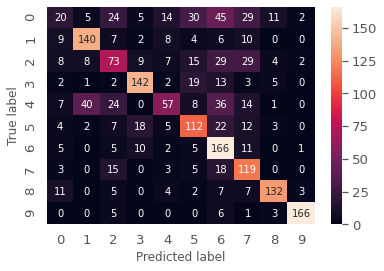

In [257]:
run_classification_hyper(OneVsRestClassifier(LinearSVC(C=10, class_weight='balanced', dual=True, 
                                                                 fit_intercept=True, intercept_scaling=1,
                                                                 loss='squared_hinge', max_iter=1000,
                                                                 multi_class='ovr', penalty='l2',
                                                                 random_state=None, tol=0.0001,
                                                                 verbose=0), 
                                             n_jobs=None), X_train, X_test, y_train, y_test, "Hypertuned LinearSVC-Glove & Agglomerative")

**SGD Classifier**

Estimator: SGDClassifier(alpha=0.0001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='modified_huber',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l1',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 61.53%
Testing accuracy: 58.93%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.20      0.09      0.13       185
           1       0.64      0.78      0.71       186
           2       0.57      0.16      0.25       184
           3       0.72      0.72      0.72       189
           4       0.61      0.28      0.38       187
           5       0.47      0.70      0.56       185
           6       0.48      0.81      0.60       205
           7       0.53

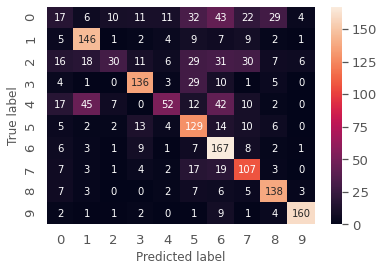

In [258]:
run_classification_hyper(SGDClassifier(alpha=0.0001, average=False, class_weight='balanced', 
                                       early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
                                       l1_ratio=0.15, learning_rate='optimal', loss='modified_huber',
                                       max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l1',
                                       power_t=0.5, random_state=None, shuffle=True, tol=0.001,
                                       validation_fraction=0.1, verbose=0, warm_start=False), X_train, X_test, y_train, y_test, "Hypertuned SGDClassifier-Glove & Agglomerative")

**Logistic Regression**

Estimator: LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 64.19%
Testing accuracy: 61.55%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.20      0.19      0.20       185
           1       0.69      0.75      0.72       186
           2       0.43      0.38      0.40       184
           3       0.75      0.77      0.76       189
           4       0.62      0.33      0.43       187
           5       0.60      0.65      0.62       185
           6       0.62      0.69      0.66       205
           7       0.52      0.74      0.61       163
           8       0.80      0.78      0.79       171
           9       0.93 

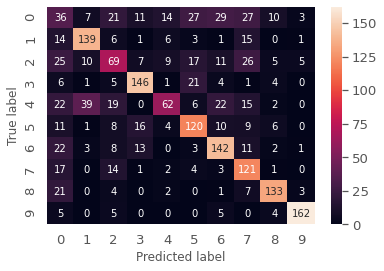

In [259]:
run_classification_hyper(LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
                                            intercept_scaling=1, l1_ratio=None, max_iter=100,
                                            multi_class='auto', n_jobs=None, penalty='l2',
                                            random_state=None, solver='newton-cg', tol=0.0001, verbose=0,
                                            warm_start=False), X_train, X_test, y_train, y_test, "Hypertuned LogisticRegression-Glove & Agglomerative")

**Random Forest Classifier**

Estimator: RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Training accuracy: 98.22%
Testing accuracy: 87.31%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.70      0.62      0.66       185
           1       0.79      0.81      0.80       186
           2       0.65      0.64      0.64       184
           3       0.90      0.98      0.94       189
           4       0.98      0.79      0.88       187
           5       0.90      0.97      0.93       185
           6       0.92 

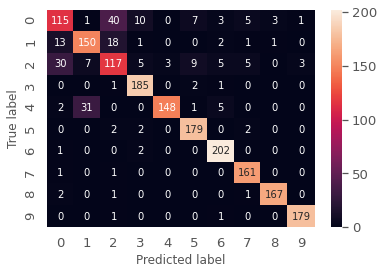

In [260]:
run_classification_hyper(RandomForestClassifier(bootstrap=True, class_weight=None,
                                                criterion='gini', max_depth=None, max_features='sqrt',
                                                max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None,
                                                min_samples_leaf=1, min_samples_split=2,
                                                min_weight_fraction_leaf=0.0, n_estimators=1000,
                                                n_jobs=None, oob_score=False, random_state=None,
                                                verbose=0, warm_start=False), X_train, X_test, y_train, y_test, "Hypertuned RandomForest-Glove & Agglomerative")

**Decision Tree Classifier**

Estimator: DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Training accuracy: 98.22%
Testing accuracy: 75.05%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.43      0.37      0.40       185
           1       0.66      0.81      0.73       186
           2       0.48      0.42      0.45       184
           3       0.82      0.85      0.83       189
           4       0.74      0.63      0.68       187
           5       0.75      0.82      0.78       185
           6       0.89      0.84      0.87       205
           7       0.84      0.91      0.87   

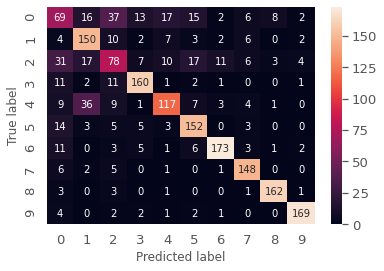

In [261]:
run_classification_hyper(DecisionTreeClassifier(class_weight='balanced', criterion='entropy', 
                                                max_depth=None, max_features='auto', max_leaf_nodes=None,
                                                min_impurity_decrease=0.0, min_impurity_split=None,
                                                min_samples_leaf=1, min_samples_split=2,
                                                min_weight_fraction_leaf=0.0,
                                                random_state=None, splitter='best'), X_train, X_test, y_train, y_test, "Hypertuned DecisionTree-Glove & Agglomerative")

**K-Nearest Neighbours**

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')
Training accuracy: 98.21%
Testing accuracy: 86.17%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.72      0.42      0.53       185
           1       0.75      0.83      0.79       186
           2       0.70      0.58      0.64       184
           3       0.93      0.99      0.96       189
           4       0.85      0.82      0.84       187
           5       0.87      0.99      0.92       185
           6       0.92      1.00      0.96       205
           7       0.88      1.00      0.93       163
           8       0.94      1.00      0.97       171
           9       0.96      1.00      0.98       181

    accuracy                           0.86      1836
   macro avg       0.85      0.86      0.85      1836
weig

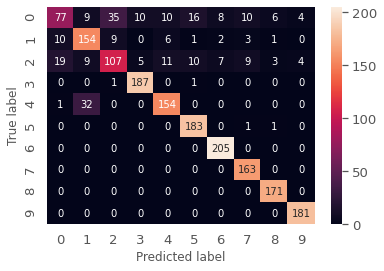

In [262]:
run_classification_hyper(KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                                              metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                                              weights='uniform'), X_train, X_test, y_train, y_test, "Hypertuned KNN-Glove & Agglomerative")

In [263]:
# add the hyper parameter details to the log table
                                     
log_hyper.loc[log_hyper['Classifier']=='Hypertuned RandomForest-Glove & Agglomerative','Best Hyper Parameters'] = 'max_features=sqrt, n_estimators=1000'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned DecisionTree-Glove & Agglomerative','Best Hyper Parameters'] = 'class_weight=balanced, criterion=entropy,max_features=auto'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned KNN-Glove & Agglomerative','Best Hyper Parameters'] = 'metric=manhattan, n_neighbors=1, weights=uniform'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned LinearSVC-Glove & Agglomerative','Best Hyper Parameters'] = 'C=10, class_weight=balanced, loss=squared_hinge, penalty=l2'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned SGDClassifier-Glove & Agglomerative','Best Hyper Parameters'] = 'class_weight=balanced, loss=modified_huber, penalty=l1'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned LogisticRegression-Glove & Agglomerative','Best Hyper Parameters'] = 'C=100, penalty=l2, solver=newton-cg'

log_hyper.set_index(["Classifier"]).sort_values(by=['f1_score', 'Latency'])

,Precision,Recall,Accuracy,f1_score,Latency,Best Hyper Parameters
Classifier,,,,,,
Hypertuned SGDClassifier-Glove & Agglomerative,0.694624,0.589325,0.589325,0.621457,Time taken: 16.658241s,"class_weight=balanced, loss=modified_huber, pe..."
Hypertuned LogisticRegression-Glove & Agglomerative,0.639847,0.615468,0.615468,0.622143,Time taken: 21.176750s,"C=100, penalty=l2, solver=newton-cg"
Hypertuned LinearSVC-Glove & Agglomerative,0.680194,0.613834,0.613834,0.632265,Time taken: 74.847376s,"C=10, class_weight=balanced, loss=squared_hing..."
Hypertuned DecisionTree-Glove & Agglomerative,0.764252,0.750545,0.750545,0.755404,Time taken: 1.143215s,"class_weight=balanced, criterion=entropy,max_f..."
Hypertuned KNN-Glove & Agglomerative,0.892413,0.861656,0.861656,0.872667,Time taken: 6.521873s,"metric=manhattan, n_neighbors=1, weights=uniform"
Hypertuned RandomForest-Glove & Agglomerative,0.881172,0.873094,0.873094,0.875552,Time taken: 173.683495s,"max_features=sqrt, n_estimators=1000"


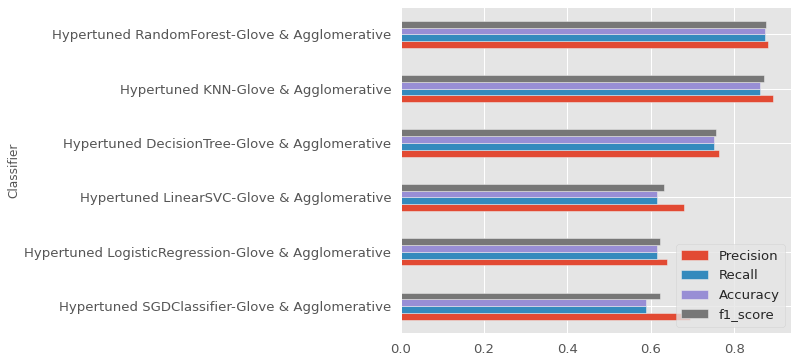

In [264]:
log_hyper.set_index(["Classifier"]).sort_values(by=['f1_score','Latency']).plot(kind='barh',figsize=[7,6])

In [ ]:
tfidfk_log = pd.concat([log, log_hyper])
tfidfk_log = tfidfk_log.set_index(["Classifier"]).sort_values(by=['f1_score', 'Latency'])
pd.set_option('display.max_colwidth', None)
tfidfk_log

,Precision,Recall,Accuracy,f1_score,Latency,Best Hyper Parameters
Classifier,,,,,,
Hypertuned SGDClassifier-Glove & Agglomerative,0.625776,0.536492,0.536492,0.551635,Time taken: 17.177881s,"class_weight=balanced, loss=modified_huber, penalty=l1"
SGDClassifier-Glove & Hierarchical,0.623524,0.521786,0.521786,0.557378,Time taken: 5.630546s,NaN
LinearSVC-Glove & Hierarchical,0.611347,0.592048,0.592048,0.593827,Time taken: 9.335849s,NaN
Hypertuned LinearSVC-Glove & Agglomerative,0.655891,0.600763,0.600763,0.616945,Time taken: 77.593581s,"C=10, class_weight=balanced, loss=squared_hinge, penalty=l2"
Hypertuned LogisticRegression-Glove & Agglomerative,0.639930,0.615468,0.615468,0.622333,Time taken: 22.045738s,"C=100, penalty=l2, solver=newton-cg"
LogisticRegression-Glove & Hierarchical,0.650761,0.612745,0.612745,0.622896,Time taken: 91.807559s,NaN
DecisionTree-TFIDF & K-Means,0.712567,0.626603,0.626603,0.665075,Time taken: 5.131654s,NaN
DecisionTree-BOW & Hierarchical,0.666088,0.667914,0.667914,0.666404,Time taken: 0.248980s,NaN
SGDClassifier-BOW & Hierarchical,0.731199,0.708853,0.708853,0.672385,Time taken: 107.211911s,NaN


As per above table, we can observe the hypertuned KNN and RandomForest models provide the best prediction performance. We will consider the hypertuned KNN model as our final prediction model.

In [ ]:
knc_model = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan', metric_params=None, n_jobs=None, n_neighbors=1, p=2, weights='uniform')
knc_model.fit(X_train, y_train)

filename = 'finalized_model.pkl'
pickle.dump(knc_model, open(filename, 'wb'))

loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test, y_test)
print(result)

0.8632897603485838


##Prediction using Neural Network Models

### Classification using BERT model

BERT (Bidirectional Encoder Representations from Transformers) is a big neural network architecture, with a huge number of parameters, that can range from 100 million to over 300 million. So, training a BERT model from scratch on a small dataset would result in overfitting.
So, it is better to use a pre-trained BERT model that was trained on a huge dataset, as a starting point. We can then further train the model on our relatively smaller dataset and this process is known as model fine-tuning.
Different Fine-Tuning Techniques Train the entire architecture – We can further train the entire pre-trained model on our dataset and feed the output to a softmax layer. In this case, the error is back-propagated through the entire architecture and the pre-trained weights of the model are updated based on the new dataset. Train some layers while freezing others – Another way to use a pre-trained model is to train it partially. What we can do is keep the weights of initial layers of the model frozen while we retrain only the higher layers. We can try and test as to how many layers to be frozen and how many to be trained. Freeze the entire architecture – We can even freeze all the layers of the model and attach a few neural network layers of our own and train this new model. Note that the weights of only the attached layers will be updated during model training.


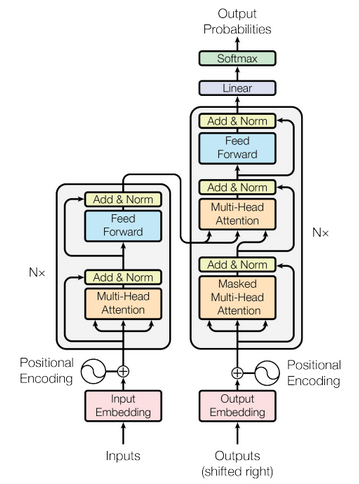

The Transformer – Model Architecture (Source: https://arxiv.org/abs/1706.03762

In [ ]:
!wget https://storage.googleapis.com/bert_models/2018_10_18/uncased_L-12_H-768_A-12.zip

--2020-09-05 04:42:57--  https://storage.googleapis.com/bert_models/2018_10_18/uncased_L-12_H-768_A-12.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.20.128, 74.125.142.128, 74.125.195.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.20.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 407727028 (389M) [application/zip]
Saving to: ‘uncased_L-12_H-768_A-12.zip.4’

uncased_L-12_H-768_ 100%[===================>] 388.84M  76.3MB/s    in 5.1s    

2020-09-05 04:43:02 (75.7 MB/s) - ‘uncased_L-12_H-768_A-12.zip.4’ saved [407727028/407727028]



In [ ]:
!unzip uncased_L-12_H-768_A-12.zip

Archive:  uncased_L-12_H-768_A-12.zip
   creating: uncased_L-12_H-768_A-12/
  inflating: uncased_L-12_H-768_A-12/bert_model.ckpt.meta  
  inflating: uncased_L-12_H-768_A-12/bert_model.ckpt.data-00000-of-00001  
  inflating: uncased_L-12_H-768_A-12/vocab.txt  
  inflating: uncased_L-12_H-768_A-12/bert_model.ckpt.index  
  inflating: uncased_L-12_H-768_A-12/bert_config.json  


In [ ]:
os.makedirs('model', exist_ok=True)

In [ ]:
!mv uncased_L-12_H-768_A-12/ model

In [ ]:
bert_model_name = 'uncased_L-12_H-768_A-12'
bert_ckpt_dir = os.path.join('model/',bert_model_name)
bert_ckpt_file = os.path.join(bert_ckpt_dir, 'bert_model.ckpt')
bert_config_file = os.path.join(bert_ckpt_dir, 'bert_config.json')

In [ ]:
bert_ckpt_file

'model/uncased_L-12_H-768_A-12/bert_model.ckpt'

1. The BERT model has been imported above.
2. We make use of the Bert FullTokenizer to generate embedding for our input tokens.
3. Next, we decide the model architecture and define the layers.
4. Lastly, we compile the BERT model with the optimizer and fit our training data.

In [ ]:
tokenizer = FullTokenizer(vocab_file = os.path.join(bert_ckpt_dir, 'vocab.txt'))
tokens = tokenizer.tokenize("hello guys, my first project is great!")
tokenizer.convert_tokens_to_ids(tokens)

[7592, 4364, 1010, 2026, 2034, 2622, 2003, 2307, 999]

In [ ]:
class TicketAssgnData:
  DATA_COLUMN = 'tokens'
  LABEL_COLUMN = 'class'

  def __init__(self, train, test, tokenizer: FullTokenizer, classes, max_seq_len=350):
    self.tokenizer = tokenizer
    self.max_seq_len = 0
    self.classes = classes

    ((self.train_x, self.train_y), (self.test_x, self.test_y)) = map(self._prepare, [train, test])

    self.max_seq_len = min(self.max_seq_len, max_seq_len)
    self.train_x, self.test_x = map(self._pad, [self.train_x, self.test_x])

  def _prepare(self, df):
    x, y = [], []

    for _, row in tqdm(df.iterrows()):
      text, label = row[TicketAssgnData.DATA_COLUMN], row[TicketAssgnData.LABEL_COLUMN]
      tokens = self.tokenizer.tokenize(text)
      tokens = ["[CLS]"] + tokens + ["[SEP]"]
      token_ids = self.tokenizer.convert_tokens_to_ids(tokens)
      self.max_seq_len = max(self.max_seq_len, len(token_ids))
      
      x.append(token_ids)
      y.append(self.classes.index(label))
    return np.array(x), np.array(y)

  def _pad(self, ids):
    x= []
    for input_ids in ids:
      cut_point = min(len(input_ids), self.max_seq_len - 2)
      input_ids = input_ids[:cut_point]
      
      input_ids = input_ids + [0] * (self.max_seq_len - len(input_ids))
      x.append(np.array(input_ids))
    return np.array(x)


In [ ]:
def create_model(max_seq_len, bert_config_file, bert_ckpt_file):

  with tf.io.gfile.GFile(bert_config_file, 'r') as reader:
    bc = StockBertConfig.from_json_string(reader.read())
    bert_params = map_stock_config_to_params(bc)
    bert_params.adapter_size = None
    bert = BertModelLayer.from_params(bert_params, name='bert')

  input_ids = keras.layers.Input(shape=(max_seq_len,),dtype='int32',name='input_ids')
  bert_output = bert(input_ids)

  print('bert shape', bert_output.shape)
 
  cls_out = keras.layers.Lambda(lambda seq: seq[:, 0, :])(bert_output)
  cls_out = keras.layers.Dropout(0.5)(cls_out)
  logits = keras.layers.Dense(units=768, activation='tanh')(cls_out)
  logits = keras.layers.Dropout(0.5)(logits)
  logits = keras.layers.Dense(units=len(classes), activation='softmax')(logits)

  model = keras.Model(inputs=input_ids, outputs=logits)
  model.build(input_shape=(None, max_seq_len))

  load_stock_weights(bert, bert_ckpt_file)

  return model


In [ ]:
train, test = train_test_split(incidents_cosine[['tokens','class']], test_size=0.25, random_state=10)

train.reset_index(drop=True,inplace=True)
test.reset_index(drop=True,inplace=True)

In [ ]:
classes = train['class'].unique().tolist()

data = TicketAssgnData(train, test, tokenizer, classes, max_seq_len=350)

3204it [00:01, 1673.55it/s]
1068it [00:00, 1731.07it/s]


In [ ]:
model = create_model(data.max_seq_len, bert_config_file, bert_ckpt_file)

bert shape (None, 350, 768)
Done loading 196 BERT weights from: model/uncased_L-12_H-768_A-12/bert_model.ckpt into <bert.model.BertModelLayer object at 0x7f3f6885b080> (prefix:bert). Count of weights not found in the checkpoint was: [0]. Count of weights with mismatched shape: [0]
Unused weights from checkpoint: 
	bert/embeddings/token_type_embeddings
	bert/pooler/dense/bias
	bert/pooler/dense/kernel
	cls/predictions/output_bias
	cls/predictions/transform/LayerNorm/beta
	cls/predictions/transform/LayerNorm/gamma
	cls/predictions/transform/dense/bias
	cls/predictions/transform/dense/kernel
	cls/seq_relationship/output_bias
	cls/seq_relationship/output_weights


In [ ]:
data.train_x.shape

(3204, 350)

In [ ]:
data.train_y[10]

3

In [ ]:
model.summary()

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(1e-5),
    loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name='acc')]
)

In [ ]:
log_dir = 'log/ticket_classif' + datetime.datetime.now().strftime("%Y%m%d-%H%M%s")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir)

history = model.fit(
    x=data.train_x,
    y=data.train_y,
    validation_split=0.1,
    batch_size=16,
    shuffle=True,
    epochs=5,
    callbacks=[tensorboard_callback]
)

Epoch 1/5
181/181 [==============================] - 286s 2s/step - loss: 2.0316 - acc: 0.4322 - val_loss: 1.8997 - val_acc: 0.5607
Epoch 2/5
181/181 [==============================] - 294s 2s/step - loss: 1.9052 - acc: 0.5567 - val_loss: 1.8745 - val_acc: 0.5857
Epoch 3/5
181/181 [==============================] - 293s 2s/step - loss: 1.8595 - acc: 0.6018 - val_loss: 1.8482 - val_acc: 0.6137
Epoch 4/5
181/181 [==============================] - 293s 2s/step - loss: 1.8123 - acc: 0.6535 - val_loss: 1.8537 - val_acc: 0.6044
Epoch 5/5
181/181 [==============================] - 293s 2s/step - loss: 1.7847 - acc: 0.6778 - val_loss: 1.8124 - val_acc: 0.6449


In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir log

<IPython.core.display.Javascript object>

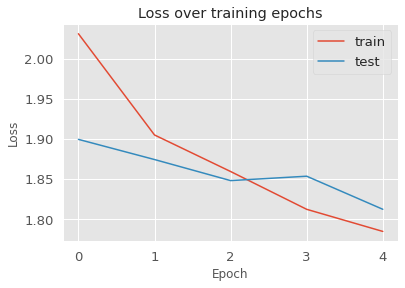

In [ ]:
ax = plt.figure().gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

ax.plot(history.history['loss'])
ax.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'test'])
plt.title('Loss over training epochs')
plt.show();

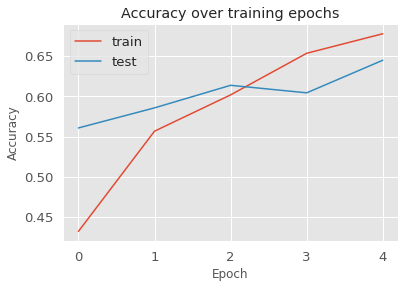

In [ ]:
ax = plt.figure().gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

ax.plot(history.history['acc'])
ax.plot(history.history['val_acc'])
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'test'])
plt.title('Accuracy over training epochs')
plt.show();

In [ ]:
_, train_acc = model.evaluate(data.train_x, data.train_y)
_, test_acc = model.evaluate(data.test_x, data.test_y)

print("train acc", train_acc)
print("test acc", test_acc)

34/34 [==============================] - 31s 921ms/step - loss: 1.7983 - acc: 0.6610
train acc 0.7063046097755432
test acc 0.6610487103462219


In [ ]:
y_pred = model.predict(data.test_x).argmax(axis=1)

In [ ]:
res = " ".join([str(i) for i in classes])

In [ ]:
print(classification_report(data.test_y, y_pred, labels=classes))

              precision    recall  f1-score   support

           2       0.90      0.83      0.86       313
           6       0.00      0.00      0.00        47
           1       0.00      0.00      0.00        16
           0       0.63      0.54      0.58       252
           5       0.78      0.88      0.83        76
           3       0.51      0.86      0.64       285
           4       0.00      0.00      0.00        30
           7       0.00      0.00      0.00        14
           9       0.00      0.00      0.00        16
           8       0.00      0.00      0.00        19

    accuracy                           0.66      1068
   macro avg       0.28      0.31      0.29      1068
weighted avg       0.60      0.66      0.62      1068



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [ ]:
cm = confusion_matrix(data.test_y, y_pred)
df_cm = pd.DataFrame(cm, index=classes, columns=classes)

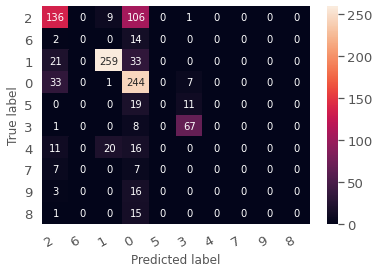

In [ ]:
hmap = sns.heatmap(df_cm, annot=True, fmt="d")
hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
plt.ylabel('True label')
plt.xlabel('Predicted label');

Clearly, the prediction is dominated by classes 0 and 1 due to imbalanced input data. We need to train our model with a fairly balanced data.

In [ ]:
sentences = [
"verified user details employee manager name checked the user name in ad and reset the password advised the user to login and check caller confirmed that he was able to login issue resolved"
]

pred_tokens = map(tokenizer.tokenize, sentences)
pred_tokens = map(lambda tok: ["[CLS]"] + tok + ["[SEP]"], pred_tokens)
pred_token_ids = list(map(tokenizer.convert_tokens_to_ids, pred_tokens))

pred_token_ids = map(lambda tids: tids +[0]*(data.max_seq_len-len(tids)),pred_token_ids)
pred_token_ids = np.array(list(pred_token_ids))

predictions = model.predict(pred_token_ids).argmax(axis=-1)

for text, label in zip(sentences, predictions):
  print("ticket:", text, "\nassignment group:", classes[label])
  print()

ticket: verified user details employee manager name checked the user name in ad and reset the password advised the user to login and check caller confirmed that he was able to login issue resolved 
assignment group: 2



###BiDirectional LSTM for prediction

#### Prediction using Word2Vec embedding and LSTM architecture

In [ ]:
sentences = [line.split(' ') for line in incidents_cosine['tokens']]
word2vec = Word2Vec(sentences=sentences,min_count=1)
word2vec.wv.save_word2vec_format(project_path+ 'word2vec_vector.txt')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


In [ ]:
embeddings_index = dict()
f = open(project_path+'word2vec_vector.txt')

for line in f:
	values = line.split()
	word = values[0]
	coefs = np.asarray(values[1:], dtype='float32')
	embeddings_index[word] = coefs
f.close()
print('Loaded %s word vectors.' % len(embeddings_index))

Loaded 9671 word vectors.


In [ ]:
class LstmModel:
  model= Model()
  X_test=[]
  y_test=[]
  embedding_matrix=[]

  def wordTokenizer(self, dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe
  
  def splitData(self,X,y):

    print("Number of Samples:", len(X))
    print("Number of Labels: ", len(y))
    X_train, self.X_test, y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=10)
    X_train, X_Val, y_train, y_Val = train_test_split(X, y, test_size=0.2, random_state=10)
    print("Number of train Samples:", len(X_train))
    print("Number of val Samples:", len(X_Val))

    return X_train, self.X_test, y_train, self.y_test, X_Val, y_Val

  def tokenizeAndEmbedding(self,dataframe):
    
    tokenizer,X = self.wordTokenizer(dataframe['tokens'])
    y = np.asarray(dataframe['class'])
    X = pad_sequences(X, maxlen = maxlen)

    self.embedding_matrix = np.zeros((numWords+1, 100))
    for i,word in tokenizer.index_word.items():
      if i<numWords+1:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            self.embedding_matrix[i] = embedding_vector
    return X,y

  def train(self, dataframe, batch_size, epochs):
   
    X,y = self.tokenizeAndEmbedding(dataframe)
    X_train, _, y_train, _, X_Val, y_Val = self.splitData(X,y)
    model_history = self.fitModel(X_train,y_train,X_Val,y_Val,batch_size, epochs)
    return model_history

  def fitModel(self,X_train,y_train,X_Val,y_Val,batch_size, epochs):
    
    input_layer = Input(shape=(maxlen,),dtype=tf.int64)
    embed = Embedding(numWords+1,output_dim=100,input_length=maxlen,weights=[self.embedding_matrix], trainable=True)(input_layer)
    lstm=Bidirectional(LSTM(128))(embed)
    drop=Dropout(0.3)(lstm)
    dense =Dense(100,activation='relu')(drop)
    out=Dense(len((pd.Series(y_train)).unique()),activation='softmax')(dense)   

    self.model = Model(input_layer,out)
    self.model.compile(loss='sparse_categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

    self.model.summary()
    plot_model(self.model,to_file="LSTM_Model.jpg")

    checkpoint = ModelCheckpoint('model-{epoch:03d}-{val_accuracy:03f}.h5', verbose=1, monitor='val_accuracy',save_best_only=True, mode='auto') 
    reduceLoss = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=2, min_lr=0.0001)
    model_history = self.model.fit(X_train,y_train,batch_size=batch_size, epochs=epochs, callbacks=[checkpoint,reduceLoss], validation_data=(X_Val,y_Val))

    return model_history,self.model

  def prediction(self):
      
     pred = self.model.predict(self.X_test)
     pred = [i.argmax() for i in pred]
     accuracy = metrics.accuracy_score(self.y_test, pred)
     print("Precision:",metrics.precision_recall_fscore_support(self.y_test, pred, average='weighted'))
     print(classification_report(self.y_test, pred))
     print("Accuracy of the model :",metrics.accuracy_score(self.y_test, pred))
     return accuracy

  def plotModelAccuracy(self, history, modelname):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])

    plt.title(modelname+' model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])

    plt.title(modelname+' model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

In [ ]:
maxlen = 300
numWords=9000
epochs = 10

lstmModel = LstmModel()
lstmModel_history, model = lstmModel.train(incidents_clust,100,epochs)
lstm_accuracy = lstmModel.prediction()

Number of Samples: 8019
Number of Labels:  8019
Number of train Samples: 6415
Number of val Samples: 1604
Model: "functional_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 300)]             0         
_________________________________________________________________
embedding_10 (Embedding)     (None, 300, 100)          900100    
_________________________________________________________________
bidirectional_9 (Bidirection (None, 256)               234496    
_________________________________________________________________
dropout_11 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_20 (Dense)             (None, 100)               25700     
_________________________________________________________________
dense_21 (Dense)             (None, 10)                1010      
Total params:

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


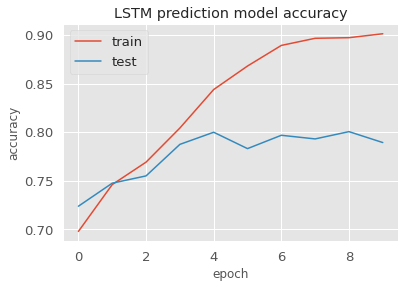

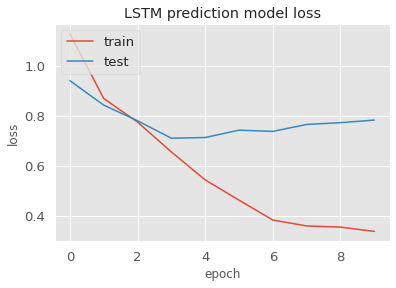

In [ ]:
lstmModel.plotModelAccuracy(lstmModel_history, 'LSTM prediction')

As we can observe, the LSTM model has not improved over 80% accuracy as it trained.

#### Prediction using Glove embedding and LSTM architecture

In [ ]:
class LstmGloveModel:
  model= Model()
  X_test=[]
  y_test=[]
  embedding_matrix=[]

  def wordTokenizer(self, dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe
  
  def splitData(self,X,y):

    print("Number of Samples:", len(X))
    print("Number of Labels: ", len(y))
    X_train, self.X_test, y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=10) # changed by Abraham
    X_train, X_Val, y_train, y_Val = train_test_split(X, y, test_size=0.2, random_state=10)
    print("Number of train Samples:", len(X_train))
    print("Number of val Samples:", len(X_Val))

    return X_train, self.X_test, y_train, self.y_test, X_Val, y_Val

  def tokenizeAndEmbedding(self,dataframe):
    
    tokenizer,X = self.wordTokenizer(dataframe['tokens'])
    y = np.asarray(dataframe['class'])
    X = pad_sequences(X, maxlen = maxlen)

    self.embedding_matrix = np.zeros((numWords+1, 300))
    for i,word in tokenizer.index_word.items():
      if i<numWords+1:
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            self.embedding_matrix[i] = embedding_vector
    return X,y

  def train(self, dataframe, batch_size, epochs):
   
    X,y = self.tokenizeAndEmbedding(dataframe)
    X_train, _, y_train, _, X_Val, y_Val = self.splitData(X,y)
    model_history = self.fitModel(X_train,y_train,X_Val,y_Val,batch_size, epochs)
    return model_history

  def fitModel(self,X_train,y_train,X_Val,y_Val,batch_size, epochs):
    
    input_layer = Input(shape=(maxlen,),dtype=tf.int64)
    embed = Embedding(numWords+1,output_dim=300,input_length=maxlen,weights=[self.embedding_matrix], trainable=True)(input_layer)
    lstm=Bidirectional(LSTM(128))(embed)
    drop=Dropout(0.3)(lstm)
    dense =Dense(100,activation='relu')(drop)
    out=Dense(len((pd.Series(y_train)).unique()),activation='softmax')(dense)   

    self.model = Model(input_layer,out)
    self.model.compile(loss='sparse_categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

    checkpoint = ModelCheckpoint('model-{epoch:03d}-{val_accuracy:03f}.h5', verbose=1, monitor='val_accuracy',save_best_only=True, mode='auto') 
    reduceLoss = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=2, min_lr=0.0001)
    model_history = self.model.fit(X_train,y_train,batch_size=batch_size, epochs=epochs, callbacks=[checkpoint,reduceLoss], validation_data=(X_Val,y_Val))
    return model_history,self.model

  def prediction(self):
      
     pred = self.model.predict(self.X_test)
     pred = [i.argmax() for i in pred]
     print("Precision:",metrics.precision_recall_fscore_support(self.y_test, pred, average='weighted'))
     print(classification_report(self.y_test, pred))
     accuracy = metrics.accuracy_score(self.y_test, pred)
     print("Accuracy of the model :",accuracy)
     return accuracy

  def plotModelAccuracy(self, history, modelname):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])

    plt.title(modelname+' model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])

    plt.title(modelname+' model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

In [ ]:
maxlen = 300
numWords=9000
epochs = 10

lstmModel2 = LstmGloveModel()
lstmModel2_history, model = lstmModel2.train(incidents_clust,100,epochs)
lstm2_accuracy = lstmModel2.prediction()

Number of Samples: 8019
Number of Labels:  8019
Number of train Samples: 6415
Number of val Samples: 1604
Epoch 1/10
65/65 [==============================] - ETA: 0s - loss: 1.0412 - accuracy: 0.7082
Epoch 00001: val_accuracy improved from -inf to 0.73940, saving model to model-001-0.739402.h5
65/65 [==============================] - 7s 102ms/step - loss: 1.0412 - accuracy: 0.7082 - val_loss: 0.8378 - val_accuracy: 0.7394
Epoch 2/10
65/65 [==============================] - ETA: 0s - loss: 0.7166 - accuracy: 0.7810
Epoch 00002: val_accuracy improved from 0.73940 to 0.77993, saving model to model-002-0.779925.h5
65/65 [==============================] - 6s 92ms/step - loss: 0.7166 - accuracy: 0.7810 - val_loss: 0.7106 - val_accuracy: 0.7799
Epoch 3/10
65/65 [==============================] - ETA: 0s - loss: 0.5672 - accuracy: 0.8251
Epoch 00003: val_accuracy did not improve from 0.77993
65/65 [==============================] - 6s 90ms/step - loss: 0.5672 - accuracy: 0.8251 - val_loss: 0.6

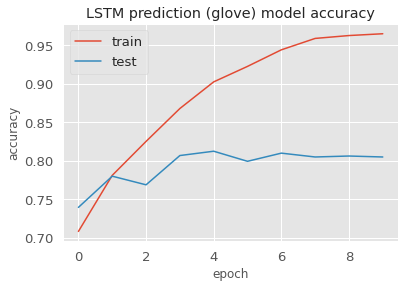

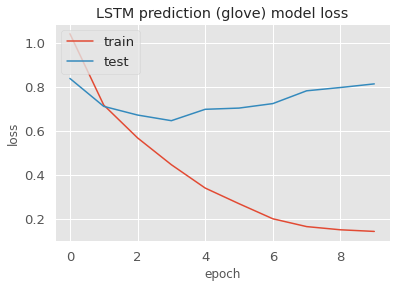

In [ ]:
lstmModel2.plotModelAccuracy(lstmModel2_history, 'LSTM prediction (glove)')

The same case is observed when using the GLOVE embeddings for training with LSTM.

### Prediction using GRU model

In [ ]:
class GruGloveModel:
  model= Model()
  X_test=[]
  y_test=[]
  embedding_matrix=[]

  def wordTokenizer(self, dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe
  
  def splitData(self,X,y):

    print("Number of Samples:", len(X))
    print("Number of Labels: ", len(y))
    X_train, self.X_test, y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=10)
    X_train, X_Val, y_train, y_Val = train_test_split(X, y, test_size=0.2, random_state=10)
    print("Number of train Samples:", len(X_train))
    print("Number of val Samples:", len(X_Val))

    return X_train, self.X_test, y_train, self.y_test, X_Val, y_Val

  def tokenizeAndEmbedding(self,dataframe):
    
    tokenizer,X = self.wordTokenizer(dataframe['tokens'])
    y = np.asarray(dataframe['class'])
    X = pad_sequences(X, maxlen = maxlen)

    self.embedding_matrix = np.zeros((numWords+1, 100))
    for i,word in tokenizer.index_word.items():
      if i<numWords+1:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            self.embedding_matrix[i] = embedding_vector
    return X,y

  def train(self, dataframe, batch_size, epochs):
   
    X,y = self.tokenizeAndEmbedding(dataframe)
    X_train, _, y_train, _, X_Val, y_Val = self.splitData(X,y)
    model_history = self.fitModel(X_train,y_train,X_Val,y_Val,batch_size, epochs)
    return model_history

  def fitModel(self,X_train,y_train,X_Val,y_Val,batch_size, epochs):
    
    input_layer = Input(shape=(maxlen,),dtype=tf.int64)
    embed = Embedding(numWords+1,output_dim=100,input_length=maxlen,weights=[self.embedding_matrix], trainable=True)(input_layer)
    gru=GRU(128)(embed)
    drop=Dropout(0.3)(gru)
    dense =Dense(100,activation='relu')(drop)
    out=Dense(len((pd.Series(y_train)).unique()),activation='softmax')(dense)   

    self.model = Model(input_layer,out)
    self.model.compile(loss='sparse_categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

    checkpoint = ModelCheckpoint('model-{epoch:03d}-{val_accuracy:03f}.h5', verbose=1, monitor='val_accuracy',save_best_only=True, mode='auto') 
    reduceLoss = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=2, min_lr=0.0001)
    model_history = self.model.fit(X_train,y_train,batch_size=batch_size, epochs=epochs, callbacks=[checkpoint,reduceLoss], validation_data=(X_Val,y_Val))
    return model_history,self.model

  def prediction(self):
      
     pred = self.model.predict(self.X_test)
     pred = [i.argmax() for i in pred]
     print("Precision:",metrics.precision_recall_fscore_support(self.y_test, pred, average='weighted'))
     print(classification_report(self.y_test, pred))
     accuracy=metrics.accuracy_score(self.y_test, pred)
     print("Accuracy of the model :",accuracy)
     return accuracy

  def plotModelAccuracy(self, history, modelname):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])

    plt.title(modelname+' model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])

    plt.title(modelname+' model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

  def plotModel(self):
    self.model.summary()

In [ ]:
gruModel = GruGloveModel()
gruModel_history, model = gruModel.train(incidents_clust,100,epochs)
gru_accuracy = gruModel.prediction()

Number of Samples: 8019
Number of Labels:  8019
Number of train Samples: 6415
Number of val Samples: 1604
Epoch 1/10
65/65 [==============================] - ETA: 0s - loss: 1.1455 - accuracy: 0.6882
Epoch 00001: val_accuracy improved from -inf to 0.72319, saving model to model-001-0.723192.h5
65/65 [==============================] - 3s 41ms/step - loss: 1.1455 - accuracy: 0.6882 - val_loss: 0.9650 - val_accuracy: 0.7232
Epoch 2/10
65/65 [==============================] - ETA: 0s - loss: 0.8977 - accuracy: 0.7378
Epoch 00002: val_accuracy improved from 0.72319 to 0.74002, saving model to model-002-0.740025.h5
65/65 [==============================] - 2s 34ms/step - loss: 0.8977 - accuracy: 0.7378 - val_loss: 0.8506 - val_accuracy: 0.7400
Epoch 3/10
65/65 [==============================] - ETA: 0s - loss: 0.7414 - accuracy: 0.7835
Epoch 00003: val_accuracy improved from 0.74002 to 0.74751, saving model to model-003-0.747506.h5
65/65 [==============================] - 2s 34ms/step - loss:

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


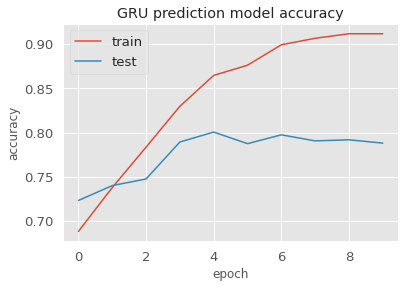

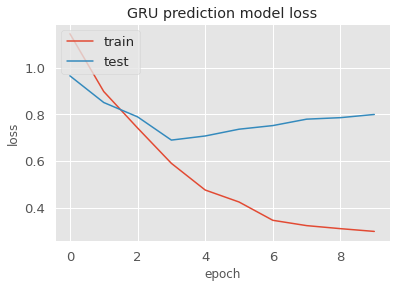

In [ ]:
gruModel.plotModelAccuracy(gruModel_history, 'GRU prediction')

### Prediction using RNN model

In [ ]:
class RNNGloveModel:
  X_test=[]
  y_test=[]
  embedding_matrix=[]

  def wordTokenizer(self, dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe

  def tokenizeAndEmbedding(self,dataframe):
    
    tokenizer,X = self.wordTokenizer(dataframe['tokens'])
    y = np.asarray(dataframe['class'])
    X = pad_sequences(X, maxlen = maxlen)

    self.embedding_matrix = np.zeros((numWords+1, 300))
    for i,word in tokenizer.index_word.items():
      if i<numWords+1:
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            self.embedding_matrix[i] = embedding_vector
    return X,y

  def splitData(self,X,y):

    print("Number of Samples:", len(X))
    print("Number of Labels: ", len(y))
    X_train, self.X_test, y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=10)
    X_train, X_Val, y_train, y_Val = train_test_split(X, y, test_size=0.2, random_state=10)
    print("Number of train Samples:", len(X_train))
    print("Number of val Samples:", len(X_Val))

    return X_train, self.X_test, y_train, self.y_test, X_Val, y_Val

  def train(self, dataframe, batch_size, epochs):
    X,y = self.tokenizeAndEmbedding(dataframe)
    X_train, _, y_train, _, X_Val, y_Val = self.splitData(X,y)

    embed = Embedding(numWords+1,output_dim=300,input_length=maxlen,weights=[self.embedding_matrix], trainable=True)
    model=Sequential()
    model.add(Input(shape=(maxlen,),dtype=tf.int64))
    model.add(embed)
    model.add(Conv1D(100,10,activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(0.3))
    model.add(Conv1D(100,10,activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Bidirectional(LSTM(128)))
    model.add(Dropout(0.3))
    model.add(Dense(100,activation='relu'))
    model.add(Dense(len((pd.Series(y_train)).unique()),activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

    model.summary()

    checkpoint = ModelCheckpoint('model-{epoch:03d}-{val_accuracy:03f}.h5', verbose=1, monitor='val_accuracy',save_best_only=True, mode='auto') 
    reduceLoss = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=2, min_lr=0.0001)
    model_history = model.fit(X_train,y_train,batch_size=batch_size, epochs=epochs, callbacks=[checkpoint,reduceLoss], validation_data=(X_Val, y_Val))
    return model_history, model

  def prediction(self,model):
      
     pred = model.predict(self.X_test)
     pred = [i.argmax() for i in pred]
     print("Precision:",metrics.precision_recall_fscore_support(self.y_test, pred, average='weighted'))
     print(classification_report(self.y_test, pred))
     accuracy = metrics.accuracy_score(self.y_test, pred)
     print("Accuracy of the model :",accuracy)
     return accuracy

  def plotModelAccuracy(self, history, modelname):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])

    plt.title(modelname+' model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])

    plt.title(modelname+' model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

In [ ]:
RNNModel = RNNGloveModel()
RNNModel_history, model = RNNModel.train(incidents_clust,100,epochs)
RNNModel_accuracy = RNNModel.prediction(model)

Number of Samples: 8019
Number of Labels:  8019
Number of train Samples: 6415
Number of val Samples: 1604
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_14 (Embedding)     (None, 300, 300)          2700300   
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 291, 100)          300100    
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 145, 100)          0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 145, 100)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 136, 100)          100100    
_________________________________________________________________
max_pooling1d_3 (MaxPooling1 (None, 68, 100)           0         
______________

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


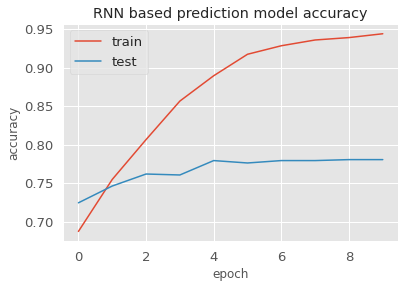

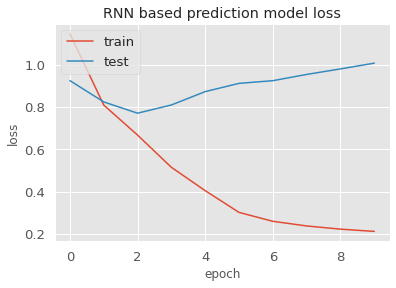

In [ ]:
RNNModel.plotModelAccuracy(RNNModel_history, 'RNN based prediction')

We observe that the machine learning models are performing better when comparing the prediction performance and training latency. One possible reason is that we train the Neural network models with the text data where there is a huge imbalance and there is overfitting clearly visible. On the other hand, we have smoothened the input class distribution to Machine learning model using SMOTE so there is a better performance.

### Text Classification With Hugging Face Transformers in TensorFlow Using [ktrain](https://github.com/amaiya/ktrain)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(incidents_clust['tokens'].values, incidents_clust['class'].values, test_size=0.15, random_state=10)

In [ ]:
!pip3 install -q git+https://github.com/amaiya/eli5@tfkeras_0_10_1

In [ ]:
MODEL_NAME = 'distilbert-base-uncased'
t = text.Transformer(MODEL_NAME, maxlen=500, classes=incidents_clust['class'].unique().tolist())
trn = t.preprocess_train(X_train, y_train)
val = t.preprocess_test(X_test, y_test)
model = t.get_classifier()
learner = ktrain.get_learner(model, train_data=trn, val_data=val, batch_size=6)

/usr/local/lib/python3.6/dist-packages/ktrain/text/preprocessor.py:399: UserWarning: The class_names argument is replacing the classes argument. Please update your code.
  warnings.warn('The class_names argument is replacing the classes argument. Please update your code.')


preprocessing train...
language: en
train sequence lengths:
	mean : 20
	95percentile : 68
	99percentile : 130


Is Multi-Label? False
preprocessing test...
language: en
test sequence lengths:
	mean : 20
	95percentile : 67
	99percentile : 125


Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertForSequenceClassification: ['activation_13', 'vocab_layer_norm', 'vocab_projector', 'vocab_transform']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPretraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier', 'pre_classifier', 'dropout_37']
You should probably TRAIN this model on a down-stream task to be able to use i

simulating training for different learning rates... this may take a few moments...
Epoch 1/3
1136/1136 [==============================] - 436s 384ms/step - loss: 1.5109 - accuracy: 0.5782
Epoch 2/3
1136/1136 [==============================] - 434s 382ms/step - loss: 1.2429 - accuracy: 0.6530
Epoch 3/3
1136/1136 [==============================] - 427s 376ms/step - loss: 1.8450 - accuracy: 0.5631


Some weights of the model checkpoint at /tmp/tmpz9ynj67m were not used when initializing TFDistilBertForSequenceClassification: ['dropout_37']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPretraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at /tmp/tmpz9ynj67m and are newly initialized: ['dropout_57']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.




done.
Visually inspect loss plot and select learning rate associated with falling loss


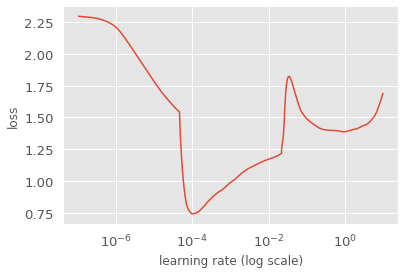

In [ ]:
learner.lr_find(show_plot=True, max_epochs=3)

In [ ]:
learner.fit_onecycle(5e-5, 7)



begin training using onecycle policy with max lr of 5e-05...
Epoch 1/7
1136/1136 [==============================] - 463s 408ms/step - loss: 0.9437 - accuracy: 0.7344 - val_loss: 0.7400 - val_accuracy: 0.7689
Epoch 2/7
1136/1136 [==============================] - 462s 407ms/step - loss: 0.6285 - accuracy: 0.8104 - val_loss: 0.6761 - val_accuracy: 0.7938
Epoch 3/7
1136/1136 [==============================] - 463s 407ms/step - loss: 0.4934 - accuracy: 0.8555 - val_loss: 0.6364 - val_accuracy: 0.8047
Epoch 4/7
1136/1136 [==============================] - 463s 408ms/step - loss: 0.3980 - accuracy: 0.8862 - val_loss: 0.6844 - val_accuracy: 0.7922
Epoch 5/7
1136/1136 [==============================] - 464s 408ms/step - loss: 0.2446 - accuracy: 0.9335 - val_loss: 0.7810 - val_accuracy: 0.8080
Epoch 6/7
1136/1136 [==============================] - 464s 408ms/step - loss: 0.1372 - accuracy: 0.9651 - val_loss: 0.8790 - val_accuracy: 0.8030
Epoch 7/7
1136/1136 [==============================] - 

In [ ]:
learner.validate(class_names=t.get_classes())

              precision    recall  f1-score   support

           0       0.85      0.88      0.87       739
           2       0.84      0.90      0.87       169
           1       0.50      0.45      0.47       157
           6       0.97      0.86      0.92        44
           4       0.57      0.48      0.52        33
           9       0.53      0.56      0.55        16
           7       0.62      0.50      0.56        10
           3       0.17      0.10      0.12        10
           8       0.50      0.40      0.44        10
           5       0.91      0.67      0.77        15

    accuracy                           0.80      1203
   macro avg       0.65      0.58      0.61      1203
weighted avg       0.79      0.80      0.79      1203



array([[654,  10,  51,   0,   8,   5,   2,   4,   4,   1],
       [  6, 152,  10,   0,   1,   0,   0,   0,   0,   0],
       [ 73,   8,  70,   0,   3,   1,   1,   1,   0,   0],
       [  2,   0,   2,  38,   0,   2,   0,   0,   0,   0],
       [  6,  10,   1,   0,  16,   0,   0,   0,   0,   0],
       [  6,   0,   0,   1,   0,   9,   0,   0,   0,   0],
       [  5,   0,   0,   0,   0,   0,   5,   0,   0,   0],
       [  6,   0,   3,   0,   0,   0,   0,   1,   0,   0],
       [  4,   0,   2,   0,   0,   0,   0,   0,   4,   0],
       [  5,   0,   0,   0,   0,   0,   0,   0,   0,  10]])

In [ ]:
learner.view_top_losses(n=10, preproc=t)

----------
id:65 | loss:9.17 | true:8 | pred:0)

----------
id:807 | loss:8.76 | true:4 | pred:0)

----------
id:758 | loss:8.7 | true:5 | pred:0)

----------
id:813 | loss:8.66 | true:5 | pred:0)

----------
id:1163 | loss:8.65 | true:3 | pred:0)

----------
id:879 | loss:8.53 | true:5 | pred:0)

----------
id:30 | loss:8.51 | true:3 | pred:1)

----------
id:134 | loss:8.44 | true:8 | pred:0)

----------
id:1032 | loss:8.39 | true:2 | pred:0)

----------
id:924 | loss:8.22 | true:4 | pred:0)



The prediction has reported worst losses, we can see the model has intepreted many non-zero records as zero classes. As already explained above, the imbalance is a main reason. Also, the model reports record 65 as the prediction with the worst loss, we can use the explain utility provided by the library to understand why this prediction occurred.

In [ ]:
predictor = ktrain.get_predictor(learner.model, preproc=t)
print(X_test[65])

account lock 8


0

In [ ]:
predictor.explain(X_test[65])

/usr/local/lib/python3.6/dist-packages/eli5/lime/samplers.py:191: DeprecationWarning: `itemfreq` is deprecated!
`itemfreq` is deprecated and will be removed in a future version. Use instead `np.unique(..., return_counts=True)`
  for idx, freq in itemfreq(sampler_indices)


In [ ]:
print(X_test[1])
print(y_test[1])
predictor.predict(X_test[1])

please provide detail template multiple application impact please use quick ticket template operation folder site location usa user -PRON- would ad dinkifgtrl system see performance problem please list e g crm erp bw bobj sid erp production server name hostname transaction slow e g va create order quote order va va area belong e g sale finance markhtyete etc sale per robhyertyj issue replicate support group user see yes please attach relevant screenshot exact time issue occur attach user name robhyertyj l dinfgrtyukin contact
0


0

In [ ]:
predictor.explain(X_test[1])

/usr/local/lib/python3.6/dist-packages/eli5/base_utils.py:28: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  init_args = inspect.getargspec(class_.__init__)
/usr/local/lib/python3.6/dist-packages/eli5/base_utils.py:28: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  init_args = inspect.getargspec(class_.__init__)
/usr/local/lib/python3.6/dist-packages/eli5/base_utils.py:28: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  init_args = inspect.getargspec(class_.__init__)
/usr/local/lib/python3.6/dist-packages/eli5/base_utils.py:28: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  init_args = inspect.getargspec(class_.__init__)
/usr/local/lib/python3.6/dist-packages/eli5/base_uti

/usr/local/lib/python3.6/dist-packages/eli5/lime/samplers.py:191: DeprecationWarning: `itemfreq` is deprecated!
`itemfreq` is deprecated and will be removed in a future version. Use instead `np.unique(..., return_counts=True)`
  for idx, freq in itemfreq(sampler_indices)
/usr/local/lib/python3.6/dist-packages/eli5/lime/textutils.py:186: DeprecationWarning: Flags not at the start of the expression '((?u)\\b\\w+\\b)'
  parts = re.split(token_pattern, text)


From the above prediction, we can see which words have contributed to the model's understanding of the data and subsequent prediction. The more darker green the text is highlighted, it influences the model more to predict the respective class.

## Group classification (Secondary layer)

Till this point, we have attempted to predict the cluster class that relates to different assignment group. So, this doesn't make a complete solution. As a precursor to the full model, the below sample shows a secondary layer classification that tries to predict the assignment group to which the ticket needs to be assigned. Through a similar approach and more balanced data, it is possible to scale it to accomodate multiple classification labels for prediction.

In [ ]:
incidents_clus0 = incidents_cosine[incidents_cosine['class']==0]
incidents_clus0['Group id'].value_counts()

18    215
2     200
0     179
12    145
13    118
25    116
28     44
40     40
20     36
10     30
62     25
50      8
Name: Group id, dtype: int64

In [ ]:
incidents_clus0 = incidents_clus0[['embedding','Group id']]
incidents_clus0.head()

,embedding,Group id
0,"[-0.2254139279354025, -0.042521087283437904, -...",0
1,"[-0.33971445061839545, 0.14048253916777098, -0...",0
2,"[-0.22252566686186653, 0.04802200198173523, -0...",0
3,"[-0.14620803489482828, 0.0351748950779438, -0....",0
4,"[-0.24889229132483404, 0.014318003753821055, -...",0


In [ ]:
incidents_clus0['Group id'] = incidents_clus0['Group id'].map({0:0,2:1,10:2,12:3,13:4,18:5,20:6,25:7,28:8,40:9,50:10,62:11})

In [ ]:
incidents_clus0['Group id'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [ ]:
X1 = incidents_clus0['embedding'].values.tolist()
y1 = incidents_clus0['Group id']
X1 = np.array(X1)
y1 = np.array(y1)

In [ ]:
oversample = SMOTE(k_neighbors=5)
X1, y1 = oversample.fit_resample(X1, y1)

undersample = RandomUnderSampler(random_state=42)
incidents_clus0_smd, incidents_clus0_sml = undersample.fit_resample(X1, y1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(incidents_clus0_smd, incidents_clus0_sml, test_size=0.15, random_state=10)

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5 , weights = 'distance')
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')

In [ ]:
print('Training accuracy: %.2f%%' % (accuracy_score(y_train,knn.predict(X_train)) * 100))
print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, knn.predict(X_test)) * 100))
print('Confusion matrix:\n %s' % (confusion_matrix(y_test, knn.predict(X_test))))
print('Classification report:\n %s' % (classification_report(y_test, knn.predict(X_test))))

Training accuracy: 99.73%
Testing accuracy: 72.09%
Confusion matrix:
 [[12  3  1  1  1  7  1  1  2  0  0  1]
 [ 0 10  2  3  2  0  4  5  6  3  1  0]
 [ 0  0 25  0  0  0  0  0  0  0  0  0]
 [ 0  0  6 19  3  0  4  3  0  3  3  2]
 [ 0  0  0  1 20  0  0  2  0  0  1  0]
 [ 0  0  1  2  2  5  5  2  2  0  3  4]
 [ 0  0  0  0  0  0 31  0  1  0  0  0]
 [ 0  1  1  2  1  2  2 20  1  1  3  0]
 [ 0  0  0  0  0  0  0  0 40  0  0  0]
 [ 0  0  0  0  0  0  0  0  0 37  0  0]
 [ 0  0  0  0  0  0  0  0  0  0 26  0]
 [ 0  0  0  0  0  0  0  0  0  0  0 34]]
Classification report:
               precision    recall  f1-score   support

           0       1.00      0.40      0.57        30
           1       0.71      0.28      0.40        36
           2       0.69      1.00      0.82        25
           3       0.68      0.44      0.54        43
           4       0.69      0.83      0.75        24
           5       0.36      0.19      0.25        26
           6       0.66      0.97      0.78        32
    

## **Final Conclusion**
We first analysed the dataset provided to us, undestood the structure of the data provided - number of columns, field , datatypes etc.

> We first analysed the dataset provided to us, undestood the structure of the data provided - number of columns, field , datatypes etc.

> We did Exploratory Data Analysis to derive further insights from this data set and we found that
*   Data is very much imbalanced, there are around ~45% of the Groups with less than 20 tickets.
*   Few of the tickets are in foreign language like German
*   The data has lot of noise in it, for eg- few tickets related to account setup are spread across multiple assignment groups.

> We performed the data cleaning and preprocessing:
*   Translation: A small number of tickets were written in German. Hence, we used the Google translate to convert German to English to generate the input data for the next steps. 
*   Make text all lowercase so that the algorithm does not treat the same words in different cases as different
*   Removing Noise i.e everything that isn’t in a standard number or letter i.e Punctuation, Numerical values
*   Removing extra spaces
*   Removed punctuations
*   Removed words containing numbers
*   Stopword Removal: Sometimes, some extremely common words which would appear to be of little value in helping select documents matching a user need are excluded from the vocabulary entirely. These words are called stop words
*   Lemmatization
*   Tokenization: Tokenization is just the term used to describe the process of converting the normal text strings into a list of tokens i.e words that we actually want. Sentence tokenizer can be used to find the list of sentences and Word tokenizer can be used to find the list of words in strings.

> In the process of analysing the dataset, we used Analysis Of Variance (ANOVA) hypothesis testing algorithm to conclude that the some words have strong relevance to specific assignment groups at a 0.05 significance level.

> We then explored unsupervised learning techniques including topic modeling using Latent Dirichlet Allocation (LDA) and Non-Negative Matrix Factorization (NMF) methods, in an attempt to identify major topics for which tickets were raised. It was observed that NMF was able to identify fine grained topics.

> Dimensionality reduction by t-distributed stochastic neighbor embedding (T-sNE) was performed to visualize clusters of ticket groups. Since there were many different clusters, we proceeded to other clustering approaches.

> Clustering using hierarchical agglomerative clustering was performed to arrive at the different clusters and pseudo group of the assignment groups.

> We also attempted to cluster the group data into clusters using the KMeans algorithm and tf-idf vectors.

> We then trained various supervised machine learning models using the cleaned and preprocessed dataset, focusing only on the 37 groups above clustered into 10 classes. Other assignment groups have very less number of records for our model to understand and predict.

> We trained the Bag of Words embedding data using below models:
*   Multinomial NB
*   Linear Support vector Machine
*   SGD Classifier
*   Random Forest
*   Decision Tree
*   Logistic regression
*   K Nearest Neighbors   
  We achieved 79% accuracy with Multinomial Naive Bayes model, clearly the performance was low due to vast imbalance between different classes. Imbalance causes two problems:
1) Training is inefficient as most samples are easy examples that contribute no useful learning signal
2) The easy examples can overwhelm training and lead to degenerate models. A common solution is to perform some form of hard negative mining that samples hard examples during training or more complex sampling/re weighing schemes.In order to handle the imbalance problem we used class_weight=balanced hyperparameter while training the model, which tells the model to "pay more attention" to samples from an under-represented class although it brought down the accuracy and f1_score.

> Using cosine distance and SMOTE algorithm, we shortened the dataset and brought all classes to the same range. Training the same models using the glove embedding this time, we are able to achieve 84.53% accuracy with 86.18 f1 score using the K Nearest Neighbors classifier.

> We performed hyper paramater tuning using GridSearchCV to determine the best hyperparameters for each model. kNN and Random Forest algorithm produced the best results with 87% accuracy and f1 score, although the kNN trained quicker.

> We attempted utilising Neural network architectures:
* Bidirectional Encoder Representations from Transformers (BERT)
* Long Short Term Memory (LSTM)
* Gated Recurrent Unit (GRU)
* Recurrent Neural Network (RNN)
* Transformers (ktrain)   
   In this case, we trained on original text data which is imbalanced so overfitting is more prevalent and the common pattern was that test accuracy flatted early on where the training accuracy is increasing rapidly. We are able to achieve 80% accuracy on the test data.

> We demonstrated a second layer of classification to predict the assignment group within a single cluster using the K Nearest Neighbors algorithm, it was achieved with 72% accuracy. This approach can be extended to other clusters given the data is sufficiently large.

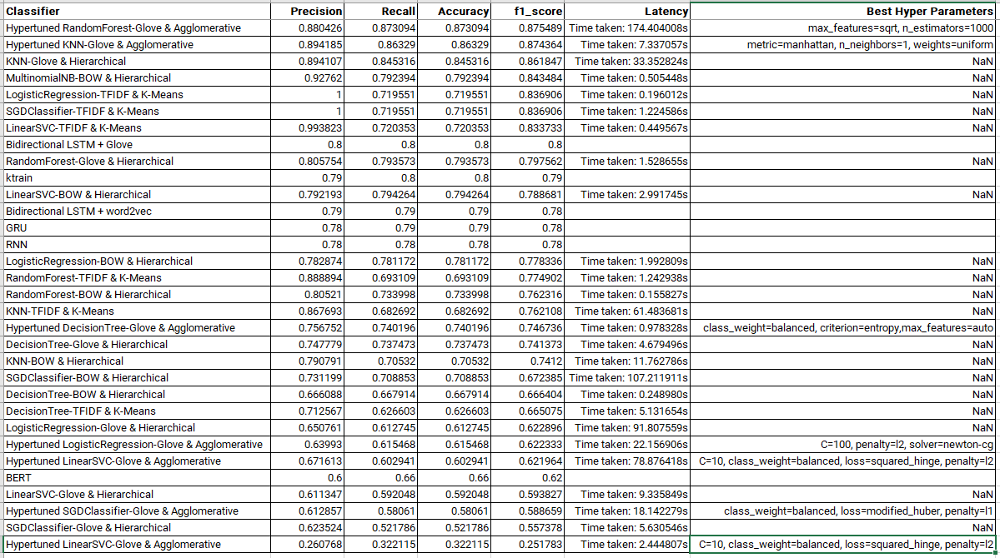